# 1)Prediction Census Income:

In [13]:
# import the librarioies:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

### https://raw.githubusercontent.com/dsrscientist/dataset1/master/census_income.csv

In [14]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset1/master/census_income.csv")

In [15]:
#checking first 5 rows:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [16]:
#checking rows and columns:
df.shape

(32560, 15)

In [17]:
#Checking 15 columns:
df.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

In [18]:
df.describe()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [20]:
#checking missing values
df.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

No null values 

In [22]:
#checking duplicated values:
df.duplicated().sum()

24

In [24]:
# lets handel duplicated values:
df.drop_duplicates(inplace = True)

In [25]:
#checking duplicated values:
df.duplicated().sum()

0

In [21]:
df.dtypes

Age                int64
Workclass         object
Fnlwgt             int64
Education         object
Education_num      int64
Marital_status    object
Occupation        object
Relationship      object
Race              object
Sex               object
Capital_gain       int64
Capital_loss       int64
Hours_per_week     int64
Native_country    object
Income            object
dtype: object

### Visualization:

 <=50K    75.918305
 >50K     24.081695
Name: Income, dtype: float64


<AxesSubplot:xlabel='Income', ylabel='count'>

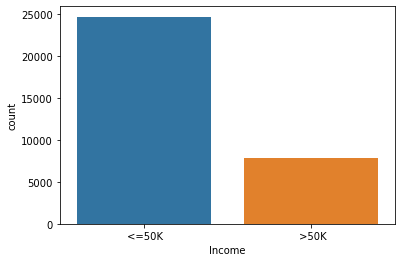

In [10]:
#checing Income column:
print((df['Income'].value_counts()/32560)*100)
sns.countplot(df['Income'])

In Income column we can see that the <=50k is highest value then >50k.

 Private             69.705160
 Self-emp-not-inc     7.804054
 Local-gov            6.428133
 ?                    5.638821
 State-gov            3.983415
 Self-emp-inc         3.427518
 Federal-gov          2.948403
 Without-pay          0.042998
 Never-worked         0.021499
Name: Workclass, dtype: float64


<AxesSubplot:xlabel='Workclass', ylabel='count'>

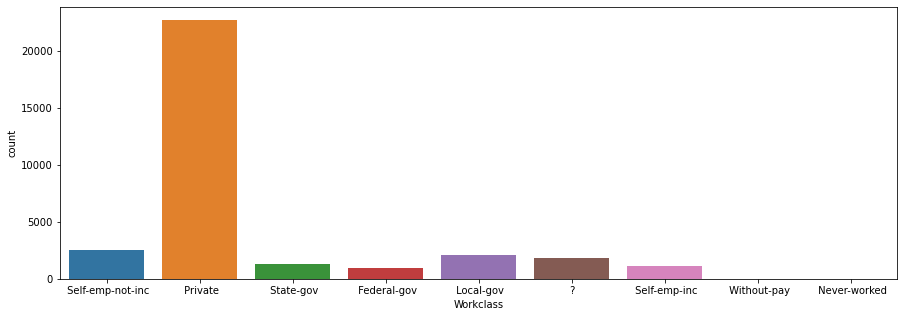

In [11]:
#checking workclass column:
plt.figure(figsize=(15,5))
print((df['Workclass'].value_counts()/32560)*100)
sns.countplot(df['Workclass'])

 Male      66.919533
 Female    33.080467
Name: Sex, dtype: float64


<AxesSubplot:xlabel='Sex', ylabel='count'>

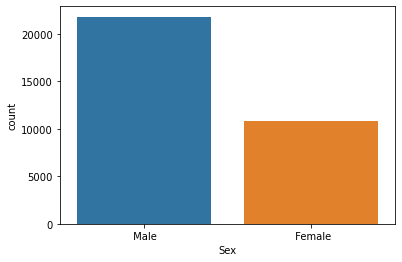

In [12]:
# checking sex columns:
print((df['Sex'].value_counts()/32560)*100)
sns.countplot(df['Sex'])

 White                 85.426904
 Black                  9.594595
 Asian-Pac-Islander     3.191032
 Amer-Indian-Eskimo     0.955160
 Other                  0.832310
Name: Race, dtype: float64


<AxesSubplot:xlabel='Race', ylabel='count'>

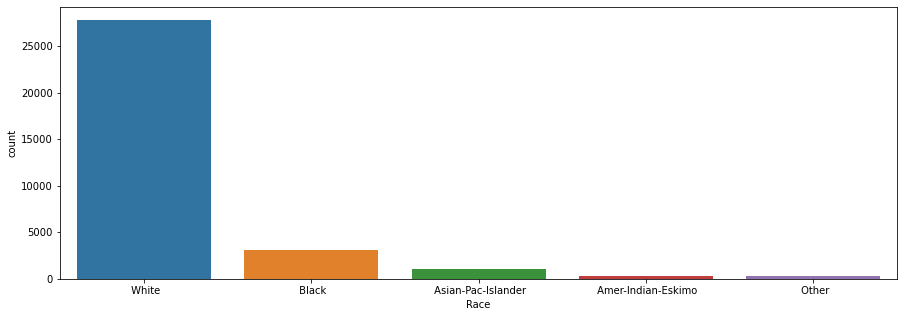

In [13]:
# checking race columns:
plt.figure(figsize=(15,5))
print((df['Race'].value_counts()/32560)*100)
sns.countplot(df['Race'])

The race  columns has 5 different categories,and no missing data.Highest number of people have race
as white .

 Husband           40.519042
 Not-in-family     25.503686
 Own-child         15.565111
 Unmarried         10.583538
 Wife               4.815725
 Other-relative     3.012899
Name: Relationship, dtype: float64


<AxesSubplot:xlabel='Relationship', ylabel='count'>

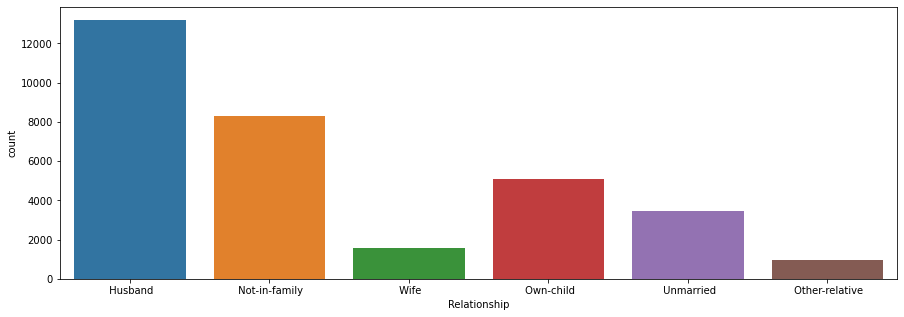

In [14]:
# checking relationship column:
plt.figure(figsize=(15,5))
print((df['Relationship'].value_counts()/32560)*100)
sns.countplot(df['Relationship'])

The relationship columns contains 6 different types of values,with highest no. set
for Husband and lowest for Other-relative.The columns does not have any missing value.

 Prof-specialty       12.714988
 Craft-repair         12.589066
 Exec-managerial      12.487715
 Adm-clerical         11.575553
 Sales                11.210074
 Other-service        10.119779
 Machine-op-inspct     6.148649
 ?                     5.660319
 Transport-moving      4.904791
 Handlers-cleaners     4.207617
 Farming-fishing       3.052826
 Tech-support          2.850123
 Protective-serv       1.993243
 Priv-house-serv       0.457617
 Armed-Forces          0.027641
Name: Occupation, dtype: float64


<AxesSubplot:xlabel='Occupation', ylabel='count'>

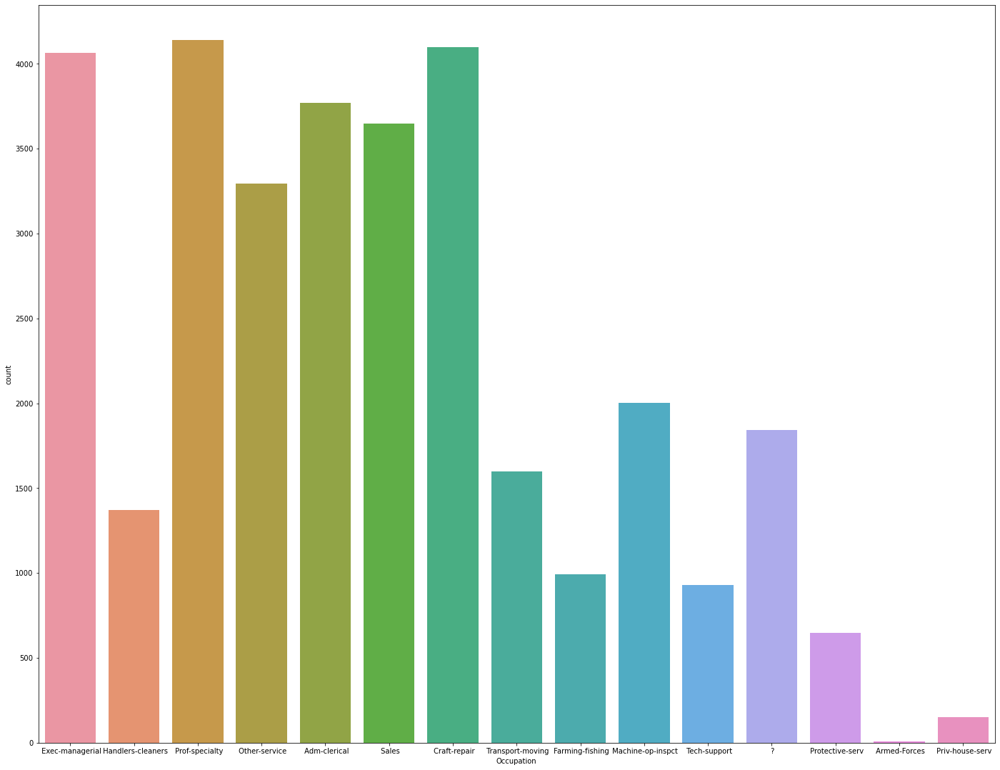

In [15]:
#checking Occupation column
plt.figure(figsize=(24,19))
print((df['Occupation'].value_counts()/32560)*100)
sns.countplot(df['Occupation'])

In this columns we can see missing(?) values are present.The prof speciality have highest no. than another columns.

 Married-civ-spouse       45.995086
 Never-married            32.807125
 Divorced                 13.645577
 Separated                 3.148034
 Widowed                   3.049754
 Married-spouse-absent     1.283784
 Married-AF-spouse         0.070639
Name: Marital_status, dtype: float64


<AxesSubplot:xlabel='Marital_status', ylabel='count'>

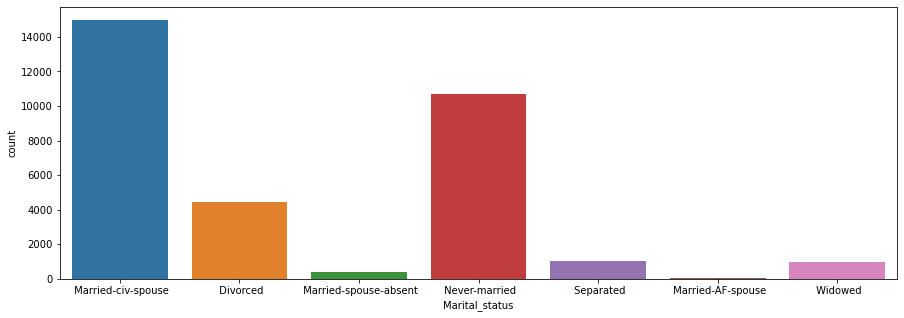

In [16]:
#checking Marital_status column:
plt.figure(figsize=(15,5))
print((df['Marital_status'].value_counts()/32560)*100)
sns.countplot(df['Marital_status'])

In this columns Majority_status as Married_civ_spouse, and least have Married-AF-spouse.

 HS-grad         32.251229
 Some-college    22.392506
 Bachelors       16.443489
 Masters          5.291769
 Assoc-voc        4.244472
 11th             3.608722
 Assoc-acdm       3.277027
 10th             2.865479
 7th-8th          1.984029
 Prof-school      1.769042
 9th              1.578624
 12th             1.329853
 Doctorate        1.268428
 5th-6th          1.022727
 1st-4th          0.515971
 Preschool        0.156634
Name: Education, dtype: float64


<AxesSubplot:xlabel='Education', ylabel='count'>

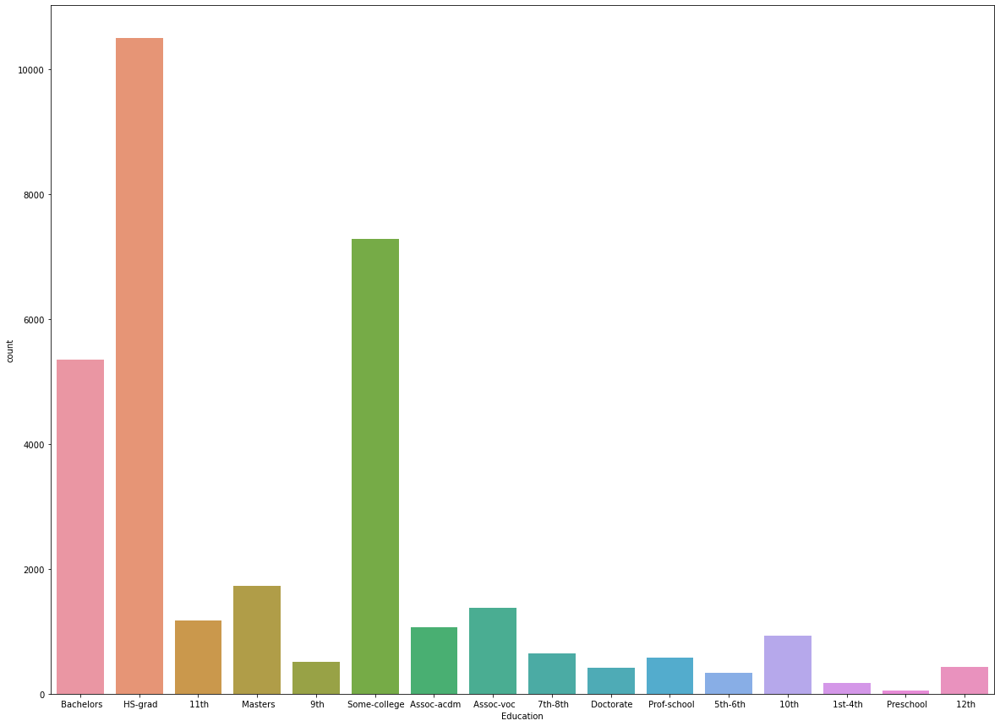

In [17]:
#checking Education column
plt.figure(figsize=(20,15))
print((df['Education'].value_counts()/32560)*100)
sns.countplot(df['Education'])

In [18]:
#checking Native_country column:
df['Native_country'].value_counts()

 United-States                 29169
 Mexico                          643
 ?                               583
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China                            75
 Italy                            73
 Dominican-Republic               70
 Vietnam                          67
 Guatemala                        64
 Japan                            62
 Poland                           60
 Columbia                         59
 Taiwan                           51
 Haiti                            44
 Iran                             43
 Portugal                         37
 Nicaragua                        34
 Peru                             31
 

0.5587376395152729
-0.166212226734332


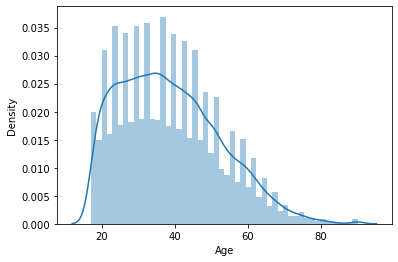

In [19]:
# Age column
sns.distplot(df['Age'])

print(df['Age'].skew())

print(df['Age'].kurt())

<AxesSubplot:xlabel='Age'>

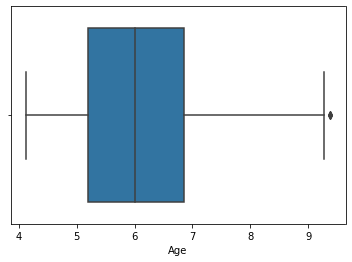

In [61]:
sns.boxplot(df['Age'])

1.4469722429475549
6.218940105241957


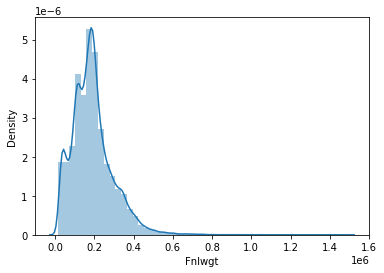

In [21]:
sns.distplot(df['Fnlwgt'])

print(df['Fnlwgt'].skew())

print(df['Fnlwgt'].kurt())

<AxesSubplot:xlabel='Fnlwgt'>

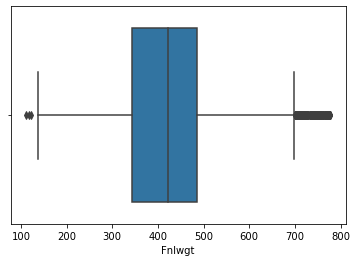

In [60]:
sns.boxplot(df['Fnlwgt'])

this columns is also right skewed and outliers are present.No null values.

-0.31162989158397764
0.6235250276277089


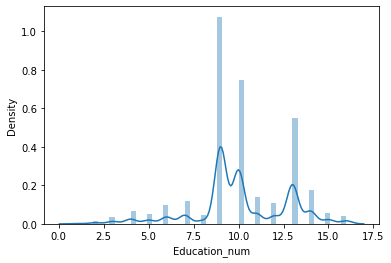

In [23]:
sns.distplot(df['Education_num'])

print(df['Education_num'].skew())

print(df['Education_num'].kurt())

<AxesSubplot:xlabel='Education_num'>

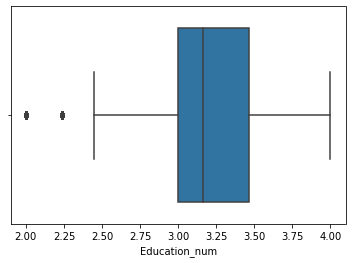

In [62]:
sns.boxplot(df['Education_num'])

11.953689856702193
154.79502392766804


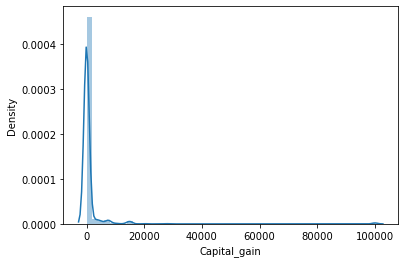

In [25]:
# Age column
sns.distplot(df['Capital_gain'])

print(df['Capital_gain'].skew())

print(df['Capital_gain'].kurt())

<AxesSubplot:xlabel='Capital_gain'>

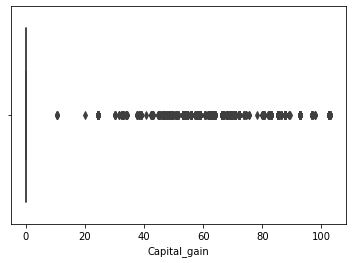

In [65]:
sns.boxplot(df['Capital_gain'])

In this column is right skewed .in this columns outliers are presnts.

4.594548858598902
20.37602890016126


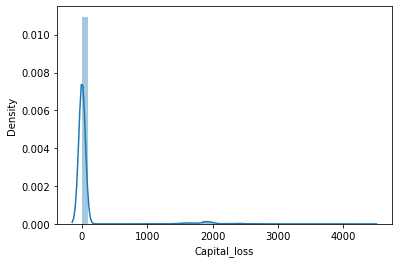

In [27]:
sns.distplot(df['Capital_loss'])

print(df['Capital_loss'].skew())

print(df['Capital_loss'].kurt())

<AxesSubplot:xlabel='Capital_loss'>

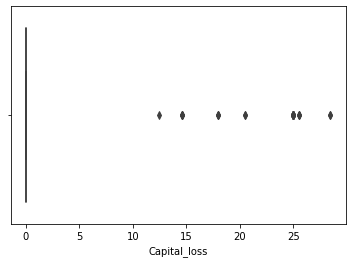

In [64]:
sns.boxplot(df['Capital_loss'])

in this column have also skewness and outliers are presents.but no null values are presents.

0.22763579151335658
2.916504561354311


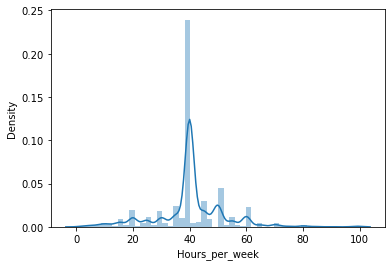

In [29]:
sns.distplot(df['Hours_per_week'])

print(df['Hours_per_week'].skew())

print(df['Hours_per_week'].kurt())

<AxesSubplot:xlabel='Hours_per_week'>

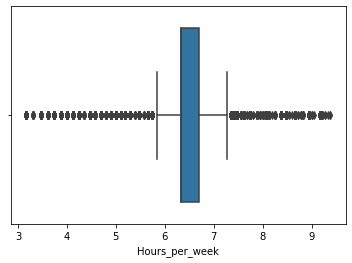

In [66]:
sns.boxplot(df['Hours_per_week'])

In this columns Have ouliers are presents and skewness is also presents.

### Let's Handel missing values b replace methhod:

In [31]:
df['Workclass'] = df['Workclass'].replace(' ?', 'Private')
df['Occupation'] = df['Occupation'].replace(' ?', 'Prof-specialty')
df['Native_country'] = df['Native_country'].replace(' ?', 'United-States')


### Lets check relationship bitween our Dependent and Independent variables:

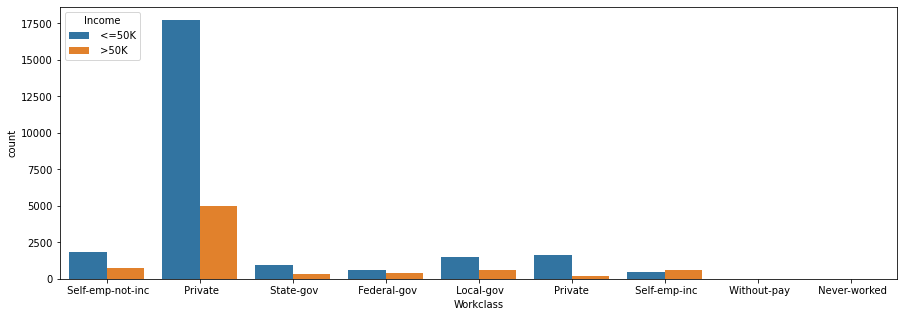

In [32]:
#relationship b/w income and workclass
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Income'],x=df['Workclass'])
plt.show()

 in Workclass column  in income have higher relationsion with private .

<AxesSubplot:xlabel='Education', ylabel='count'>

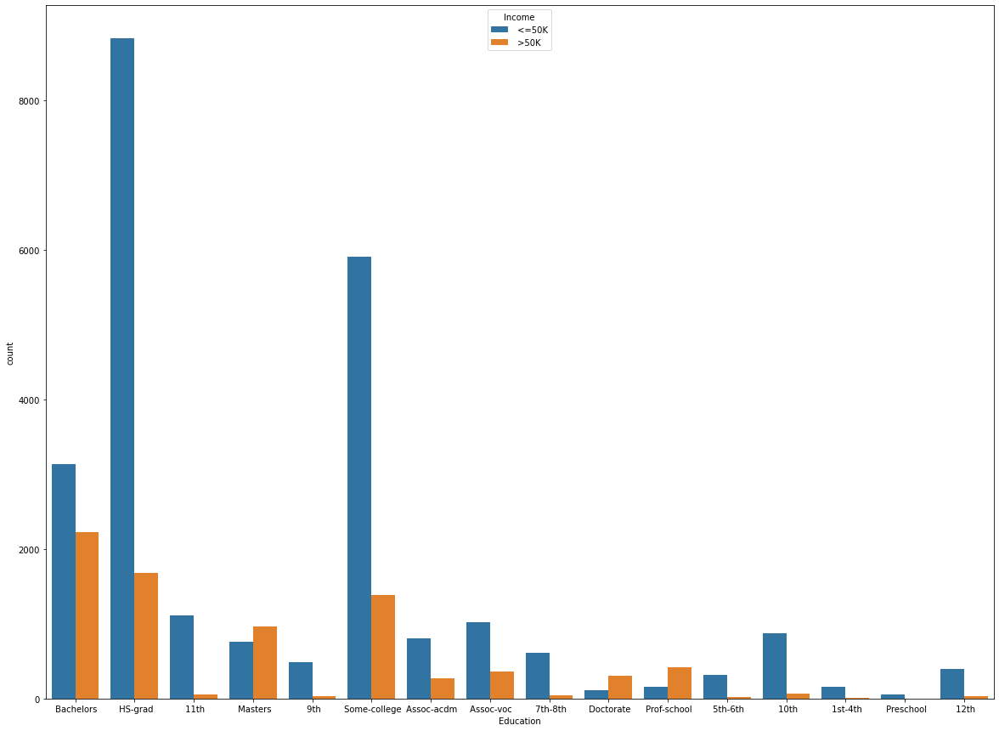

In [33]:
# relationship b/w income and education
plt.figure(figsize=(20,15))
sns.countplot(hue=df['Income'],x= df['Education'])

<AxesSubplot:xlabel='Marital_status', ylabel='count'>

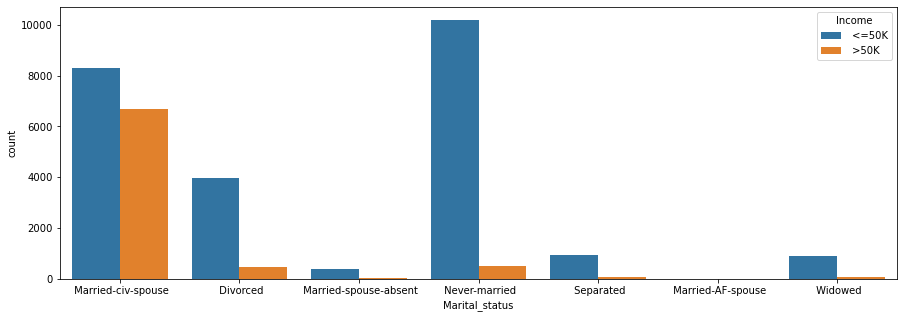

In [34]:
# relationship b/w incomee and Marital_status
plt.figure(figsize=(15,5))
sns.countplot(hue=df['Income'],x = df ['Marital_status'])

the relationship bitween Married-civ-spouse is high than another columns.

<AxesSubplot:xlabel='Occupation', ylabel='count'>

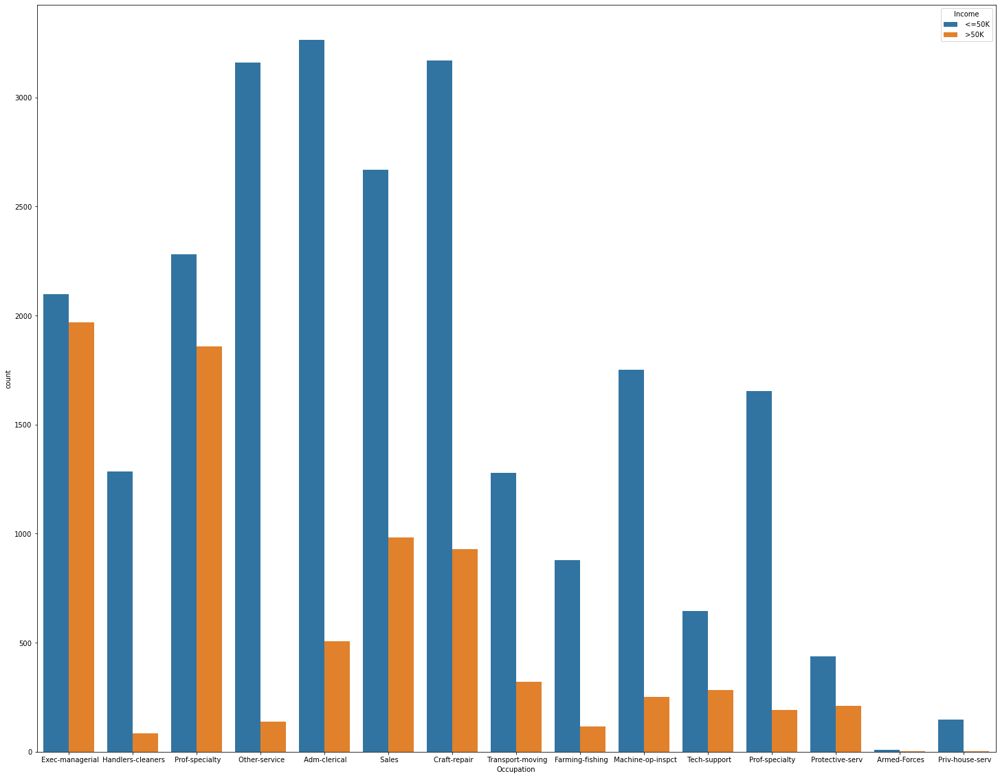

In [35]:
#relationship b/w income and Occupation:
plt.figure(figsize=(25,20))
sns.countplot(hue=df['Income'],x = df ['Occupation'])

<AxesSubplot:xlabel='Relationship', ylabel='count'>

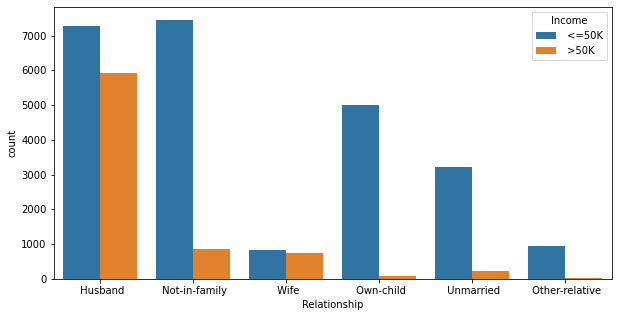

In [36]:
# relationship b/w income and Relationship
plt.figure(figsize=(10,5))
sns.countplot(hue=df['Income'],x = df ['Relationship'])

The relationship bitween Husband  and income is higherr than another columns.

<AxesSubplot:xlabel='Race', ylabel='count'>

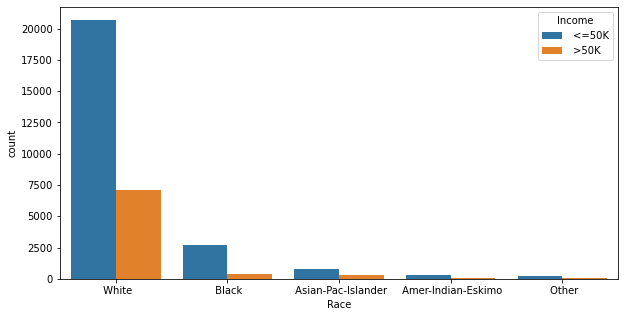

In [37]:
plt.figure(figsize=(10,5))
sns.countplot(hue=df['Income'],x = df ['Race'])

The relationship bitween white and income is higher than white.

<AxesSubplot:xlabel='Sex', ylabel='count'>

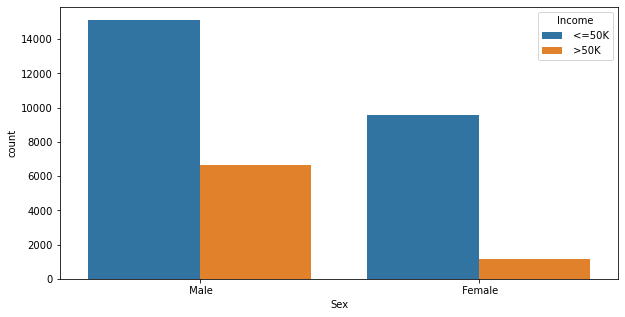

In [38]:
plt.figure(figsize=(10,5))
sns.countplot(hue=df['Income'],x = df ['Sex'])

The relationship b/w male and income is higer than Female column.

In [39]:
df['Native_country'].value_counts()

 United-States                 29169
 Mexico                          643
United-States                    583
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China                            75
 Italy                            73
 Dominican-Republic               70
 Vietnam                          67
 Guatemala                        64
 Japan                            62
 Poland                           60
 Columbia                         59
 Taiwan                           51
 Haiti                            44
 Iran                             43
 Portugal                         37
 Nicaragua                        34
 Peru                             31
 

After cleaning the null values from upper column are all eliminated.

### Let's handels Categorical values:

In [40]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [41]:
df['Workclass'] = le.fit_transform(df['Workclass'])
df['Education'] = le.fit_transform(df['Education'])
df['Marital_status'] = le.fit_transform(df['Marital_status'])
df['Occupation'] = le.fit_transform(df['Occupation'])
df['Relationship'] = le.fit_transform(df['Relationship'])
df['Race'] = le.fit_transform(df['Race'])
df['Sex'] = le.fit_transform(df['Sex'])
df['Native_country'] = le.fit_transform(df['Native_country'])
df['Income'] = le.fit_transform(df['Income'])

In [42]:
# lets check the correlations :
df.corr()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
Age,1.000000,0.059424,-0.076646,-0.010508,0.036527,-0.266292,0.012628,-0.263698,0.028718,0.088832,0.077674,0.057775,0.068756,-0.000176,0.234039
Workclass,0.059424,1.000000,-0.019111,-0.019358,-0.054412,0.042191,0.312611,0.012832,0.018893,0.002270,0.010680,-0.009878,-0.093413,0.001240,-0.055098
Fnlwgt,-0.076646,-0.019111,1.000000,-0.028156,-0.043159,0.028184,-0.000569,0.008922,-0.021278,0.026882,0.000437,-0.010259,-0.018770,-0.062703,-0.009481
Education,-0.010508,-0.019358,-0.028156,1.000000,0.359172,-0.038398,-0.046460,-0.010879,0.014135,-0.027349,0.030047,0.016744,0.055510,0.075189,0.079311
Education_num,0.036527,-0.054412,-0.043159,0.359172,1.000000,-0.069338,0.044150,-0.094145,0.031825,0.012256,0.122627,0.079932,0.148127,0.090270,0.335182
Marital_status,-0.266292,0.042191,0.028184,-0.038398,-0.069338,1.000000,0.052891,0.185461,-0.068025,-0.129337,-0.043398,-0.034182,-0.190521,-0.020463,-0.199295
Occupation,0.012628,0.312611,-0.000569,-0.046460,0.044150,0.052891,1.000000,-0.014638,-0.009948,0.026149,0.012357,0.004530,-0.056999,-0.000467,0.010777
Relationship,-0.263698,0.012832,0.008922,-0.010879,-0.094145,0.185461,-0.014638,1.000000,-0.116052,-0.582453,-0.057918,-0.061064,-0.248975,-0.010938,-0.250924
Race,0.028718,0.018893,-0.021278,0.014135,0.031825,-0.068025,-0.009948,-0.116052,1.000000,0.087197,0.011143,0.018902,0.041910,0.111294,0.071853
Sex,0.088832,0.002270,0.026882,-0.027349,0.012256,-0.129337,0.026149,-0.582453,0.087197,1.000000,0.048477,0.045572,0.229312,0.003007,0.215995


<AxesSubplot:>

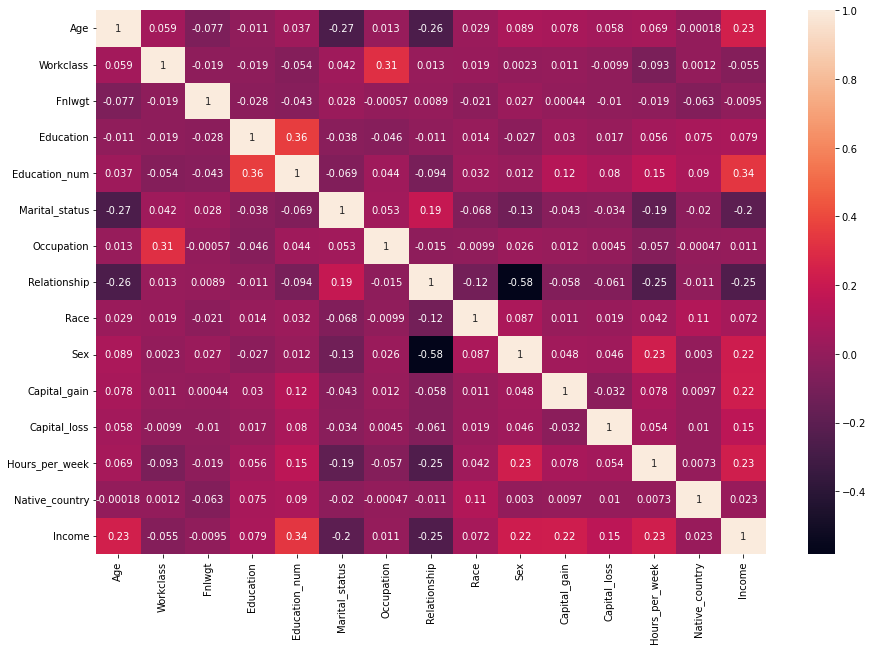

In [43]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot = True)

### Lets handel skewness fom our columns:

In [44]:
df['Age'] =np.sqrt(df['Age'])
df['Fnlwgt'] = np.sqrt(df['Fnlwgt'])
df['Education_num'] = np.sqrt(df['Education_num'])
df['Capital_gain'] = np.sqrt(df['Capital_gain'])
df['Capital_loss'] = np.sqrt(df['Capital_loss'])
df['Hours_per_week'] =np.sqrt(df['Hours_per_week'])

### Lets handel outliers:

In [45]:
# handling outlies :
from scipy import stats

from scipy.stats import zscore
z_score = zscore(df[['Age','Fnlwgt','Education_num','Capital_gain','Capital_loss','Hours_per_week']])
abs_z_score = np.abs(z_score)
filtering_entry = (abs_z_score < 3).all(axis=1)
df = df[filtering_entry]
df.reset_index(inplace = True)

In [46]:
# lets drop unessesory columns:
df = df.drop(['index'],axis=1)

In [47]:
# lets check our rows and columns again
df.shape

(29102, 15)

In [48]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,7.071068,5,288.636450,9,3.605551,2,3,0,4,1,0.0,0.0,3.605551,38,0
1,6.164414,3,464.377002,11,3.000000,0,5,1,4,1,0.0,0.0,6.324555,38,0
2,7.280110,3,484.480134,1,2.645751,2,5,0,2,1,0.0,0.0,6.324555,38,0
3,5.291503,3,581.729318,9,3.605551,2,9,5,2,0,0.0,0.0,6.324555,4,0
4,6.082763,3,533.462276,12,3.741657,2,3,5,4,0,0.0,0.0,6.324555,38,0


### Let's seprate our depend and  independent variables:

In [49]:
x = df.drop('Income',axis =1)
y = df['Income']

### Using Standard Scaler

In [50]:
# using this methd for biasness
Scaler =StandardScaler()
x = pd.DataFrame(Scaler.fit_transform(x),columns = x.columns)
x

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,0.939274,1.057311,-1.100688,-0.362096,1.180871,-0.407931,-0.774228,-0.922691,0.396412,0.715561,-0.257207,-0.029816,-2.925957,0.235357
1,0.091682,-0.224073,0.411843,0.159083,-0.415925,-1.724073,-0.313285,-0.299787,0.396412,0.715561,-0.257207,-0.029816,0.035430,0.235357
2,1.134698,-0.224073,0.584862,-2.446815,-1.350053,-0.407931,-0.313285,-0.922691,-1.951243,0.715561,-0.257207,-0.029816,0.035430,0.235357
3,-0.724366,-0.224073,1.421848,-0.362096,1.180871,-0.407931,0.608601,2.191830,-1.951243,-1.397504,-0.257207,-0.029816,0.035430,-5.576571
4,0.015349,-0.224073,1.006433,0.419673,1.539773,-0.407931,-0.774228,2.191830,0.396412,-1.397504,-0.257207,-0.029816,0.035430,0.235357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29097,-1.286296,-0.224073,1.208263,1.201443,0.011990,0.908212,0.839073,-0.299787,0.396412,0.715561,-0.257207,-0.029816,0.035430,0.235357
29098,-0.813505,-0.224073,0.780829,-0.883276,0.807878,-0.407931,1.300016,2.191830,0.396412,-1.397504,-0.257207,-0.029816,-0.138987,0.235357
29099,0.241391,-0.224073,-0.203293,0.159083,-0.415925,-0.407931,-0.082814,-0.922691,0.396412,0.715561,-0.257207,-0.029816,0.035430,0.235357
29100,1.448495,-0.224073,-0.230388,0.159083,-0.415925,2.224354,-1.465643,1.568926,0.396412,-1.397504,-0.257207,-0.029816,0.035430,0.235357


In [51]:
# lets check y values counts:
y.value_counts()

0    22853
1     6249
Name: Income, dtype: int64

In [52]:
#oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [53]:
# balansing value counts
y.value_counts()

0    22853
1    22853
Name: Income, dtype: int64

### Spliting-Testing:

In [91]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25, random_state =42)

In [92]:
from sklearn.metrics  import confusion_matrix,classification_report,accuracy_score

In [93]:
def metric_score(clf, x_train,x_test,y_train,y_test,train = True):
    if train:
        y_pred = clf.predict(x_train)
        
        print("\n==========Train Result=========")
        
        print(f"Accuracy Score: {accuracy_score(y_train,y_pred)*100: .2f}%")
        
    
    elif train==False:
        pred = clf.predict(x_test)
        
        print("\n=========Train Result========")
        
        print(f"Accuracy Score: {accuracy_score(y_test, pred)*100: .2f}%")
        
        print('\n \n Test Cassification Report \n',classification_report(y_test,pred,digits=2))

# Train the Models:

In [94]:
#for DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

In [95]:
Dec = DecisionTreeClassifier()
Dec.fit(x_train,y_train)

DecisionTreeClassifier()

In [96]:
metric_score(Dec,x_train,x_test,y_train,y_test,train=True)

metric_score(Dec,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  100.00%

=========Train Result========
Accuracy Score:  85.30%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.86      0.85      0.85      5656
           1       0.85      0.86      0.86      5771

    accuracy                           0.85     11427
   macro avg       0.85      0.85      0.85     11427
weighted avg       0.85      0.85      0.85     11427



In [67]:
# for RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

In [68]:
RFR = RandomForestClassifier()
RFR.fit(x_train,y_train)

RandomForestClassifier()

In [69]:
metric_score(RFR,x_train,x_test,y_train,y_test,train=True)
metric_score(RFR,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  99.99%

=========Train Result========
Accuracy Score:  90.11%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.91      0.89      0.90      5656
           1       0.89      0.92      0.90      5771

    accuracy                           0.90     11427
   macro avg       0.90      0.90      0.90     11427
weighted avg       0.90      0.90      0.90     11427



In [70]:
# for AdaBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [71]:
Adb = AdaBoostClassifier()
Adb.fit(x_train,y_train)

AdaBoostClassifier()

In [72]:
metric_score(Adb,x_train,x_test,y_train,y_test,train=True)
metric_score(Adb,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  84.58%

=========Train Result========
Accuracy Score:  84.27%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.87      0.81      0.84      5656
           1       0.82      0.88      0.85      5771

    accuracy                           0.84     11427
   macro avg       0.84      0.84      0.84     11427
weighted avg       0.84      0.84      0.84     11427



In [73]:
# for GradientbosstingClaasifier
from sklearn.ensemble import GradientBoostingClassifier

In [74]:
Grb =GradientBoostingClassifier ()
Grb.fit(x_train,y_train)

GradientBoostingClassifier()

In [75]:
metric_score(Grb,x_train,x_test,y_train,y_test,train=True)
metric_score(Grb,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  86.47%

=========Train Result========
Accuracy Score:  86.32%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.89      0.83      0.86      5656
           1       0.84      0.90      0.87      5771

    accuracy                           0.86     11427
   macro avg       0.87      0.86      0.86     11427
weighted avg       0.86      0.86      0.86     11427



### Cross-val:

In [76]:
from sklearn.model_selection import cross_val_score

In [77]:
#checkig cv score for DecisionTreeClassifier
score = cross_val_score(Dec,x,y)
print(score)
print(score.mean())

[0.75694596 0.84060825 0.88064763 0.88239799 0.88743026]
0.8496060180294567


In [78]:
#checkig cv score for RandomForestClassifier
score = cross_val_score(RFR,x,y)
print(score)
print(score.mean())

[0.81699847 0.89519746 0.92604748 0.93042337 0.92692266]
0.8991178864791903


In [79]:
# checking cv score for AdaBoostClassifier
score = cross_val_score(Adb,x,y)
print(score)
print(score.mean())

[0.8004813  0.84443715 0.85548627 0.86095613 0.85734602]
0.8437413744383522


In [80]:
# checking cv score for GradientBoostingClassifier
score = cross_val_score(Grb,x,y)
print(score)
print(score.mean())

[0.80409101 0.86062794 0.87747511 0.87692813 0.87441199]
0.8587068353351158


I am using DecesionTreeClassifier as a my best Model because it have very least difference bitween acc.score and cross-val score.

### Hyperparametres:

In [97]:
# DecesionTreeClassifier:
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['gini', 'entropy', 'log_loss'],
              'splitter':['best', 'random'],
              'max_features':['auto', 'sqrt', 'log2'],
              'splitter':['best', 'random'],
              'max_depth':[2,8,9]}

In [98]:
Dec=  GridSearchCV(DecisionTreeClassifier(),parameters,cv= 5)

In [99]:
# fit our model:
Dec.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 8, 9],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']})

In [100]:
#checking best parameters:
Dec.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'max_features': 'log2',
 'splitter': 'best'}

In [101]:
# checking the best  score:
Dec.best_score_

0.8226024280244131

In [103]:
Final_model = DecisionTreeClassifier(criterion = 'entropy',max_depth= 9,max_features = 'log2',splitter = 'best')
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

82.30506694670517


### Save my Model:

In [104]:
# we use joblib methode for save the model
import joblib
joblib.dump(Final_model,"Census Income Prediction")

['Census Income Prediction']

In [105]:
# load the saved model
model = joblib.load("Census Income Prediction")

#pediction
prediction = model.predict(x_test)
prediction

array([1, 1, 0, ..., 0, 1, 1])

# 2) Rainfall Weather Forecasting:

In [475]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

### https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv

In [476]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")

In [477]:
# checking first 5 rows:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [478]:
#checking rows and columns:
df.shape

(8425, 23)

In [479]:
# checking our columns:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [480]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [481]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [482]:
#checking data type:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [483]:
# is there is any missing values:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [484]:
# handling missing values:
df=df.dropna(0)

In [485]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [486]:
# checking duplicate values:
df.duplicated().sum()

653

In [487]:
# lets handel duplicate values:
df.drop_duplicates(inplace=True)

In [488]:
# checking duplicate values:
df.duplicated().sum()

0

there is no any duplicate values.

# Visualization:

No     28.712166
Yes     8.522255
Name: RainTomorrow, dtype: float64


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

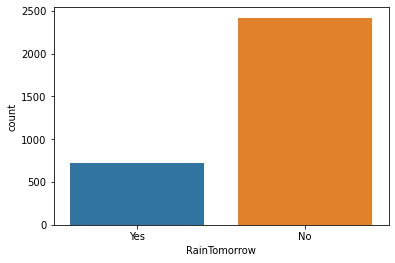

In [489]:
# checking our column:
print((df['RainTomorrow'].value_counts()/8425)*100)
sns.countplot(df['RainTomorrow'])

Here we can see that in the count of next day rain prediction 'No' column is higher than the 'yes'.

No     28.724036
Yes     8.510386
Name: RainToday, dtype: float64


<AxesSubplot:xlabel='RainToday', ylabel='count'>

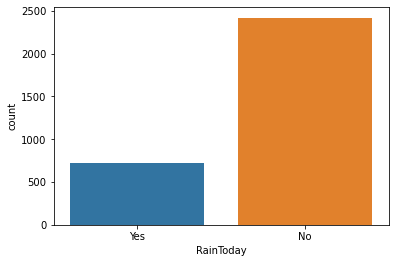

In [490]:
# checking Rain today column
print((df['RainToday'].value_counts()/8425)*100)
sns.countplot(df['RainToday'])

 In rain today column we observed that the chances of todays rain  is 'No'.

WSW    3.465875
S      3.181009
SW     3.002967
E      2.872404
ENE    2.433234
NE     2.421365
W      2.409496
SSE    2.373887
ESE    2.302671
SE     2.219585
N      2.195846
NNE    2.041543
SSW    1.732938
WNW    1.697329
NNW    1.531157
NW     1.353116
Name: WindDir3pm, dtype: float64


<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

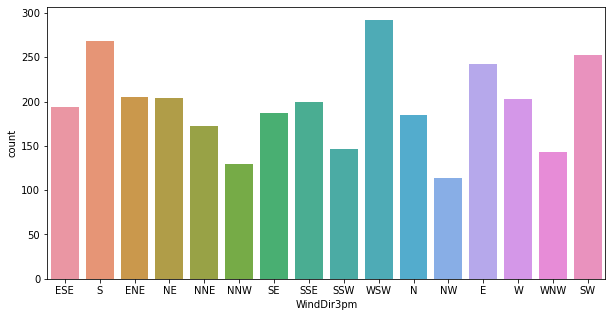

In [491]:
plt.figure(figsize=(10,5))
print((df['WindDir3pm'].value_counts()/8425)*100)
sns.countplot(df['WindDir3pm'])

Direction of the wind at 3pm 'WSW' is higher than another columns.

SW     4.640950
N      4.272997
ENE    3.430267
WSW    2.813056
E      2.623145
SSW    2.492582
NNE    2.468843
NE     2.077151
SE     1.994065
W      1.875371
S      1.816024
SSE    1.590504
ESE    1.341246
NW     1.317507
NNW    1.281899
WNW    1.198813
Name: WindDir9am, dtype: float64


<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

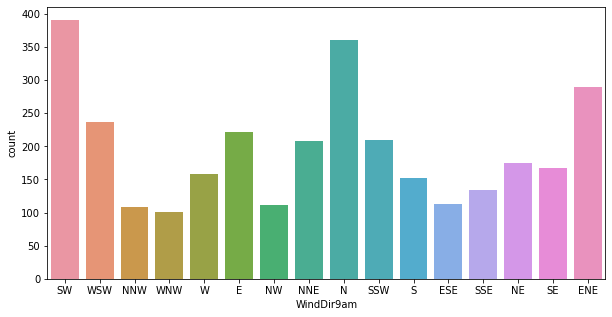

In [492]:
plt.figure(figsize=(10,5))
print((df['WindDir9am'].value_counts()/8425)*100)
sns.countplot(df['WindDir9am'])

Direction of the wind at 9am SW have highest value than another columns.

E      4.664688
SW     3.750742
N      3.287834
WSW    3.074184
ENE    2.540059
S      2.433234
SSW    2.183976
W      2.124629
SE     1.994065
ESE    1.958457
NNE    1.887240
SSE    1.839763
NE     1.804154
NW     1.376855
WNW    1.258160
NNW    1.056380
Name: WindGustDir, dtype: float64


<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

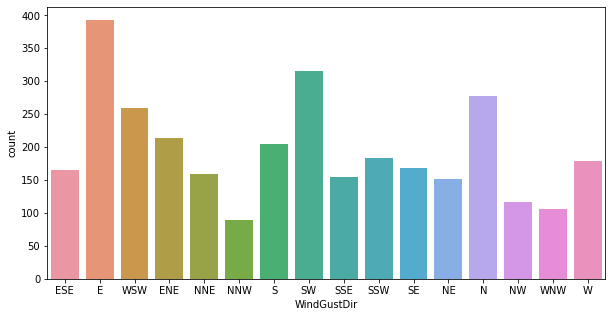

In [493]:
plt.figure(figsize=(10,5))
print((df['WindGustDir'].value_counts()/8425)*100)
sns.countplot(df['WindGustDir'])

The direction of the strongest wind gust in the 24 hours to midnight 'E' have highest value than another.

PerthAirport    13.756677
Melbourne        6.682493
CoffsHarbour     6.551929
Brisbane         6.219585
Darwin           2.955490
Williamtown      1.068249
Name: Location, dtype: float64


<AxesSubplot:xlabel='Location', ylabel='count'>

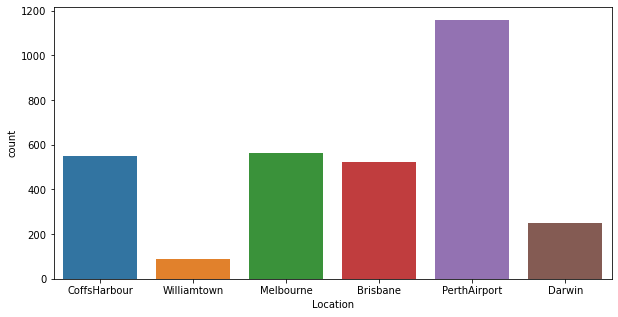

In [494]:
plt.figure(figsize=(10,5))
print((df['Location'].value_counts()/8425)*100)
sns.countplot(df['Location'])

In Location column we can see PerthAirpot have highest value counts.

7.815069698670473
103.5219357466328


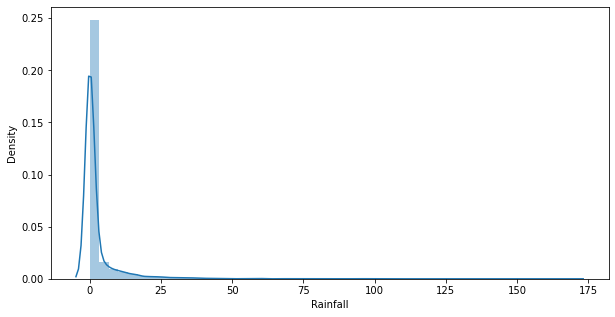

In [495]:
plt.figure(figsize=(10,5))
sns.distplot(df['Rainfall'])
print(df['Rainfall'].skew())

print(df['Rainfall'].kurt())

<AxesSubplot:xlabel='Rainfall'>

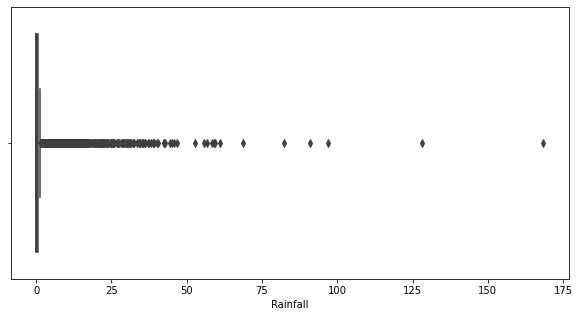

In [496]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Rainfall'])

0.005209913214340024
-0.6583370079403958


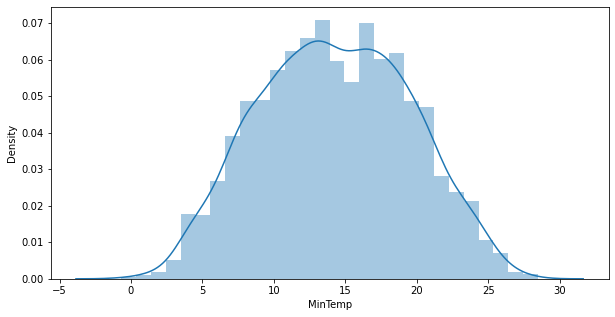

In [497]:
plt.figure(figsize=(10,5))
sns.distplot(df['MinTemp'])
print(df['MinTemp'].skew())

print(df['MinTemp'].kurt())

<AxesSubplot:xlabel='MinTemp'>

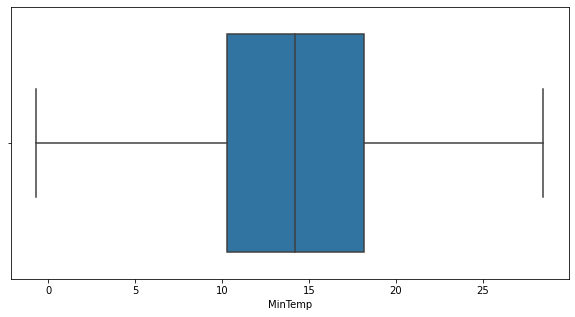

In [498]:
plt.figure(figsize=(10,5))
sns.boxplot(df['MinTemp'])

In minimum temperature column we can see its looks likke normal distributed and also dnt have any outlier.

0.2435513305671845
-0.5037711453011093


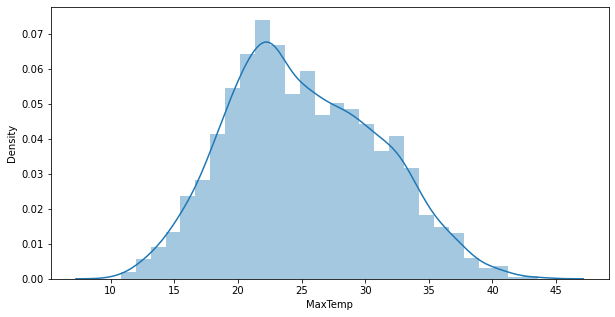

In [499]:
plt.figure(figsize=(10,5))
sns.distplot(df['MaxTemp'])
print(df['MaxTemp'].skew())

print(df['MaxTemp'].kurt())

<AxesSubplot:xlabel='MaxTemp'>

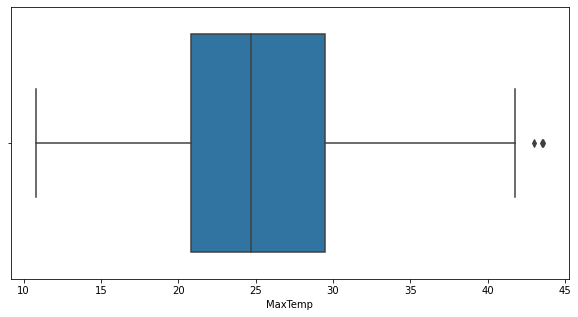

In [500]:
plt.figure(figsize=(10,5))
sns.boxplot(df['MaxTemp'])

This column is normally distributed But outliers are presents.

1.7786972505567333
7.696416335285916


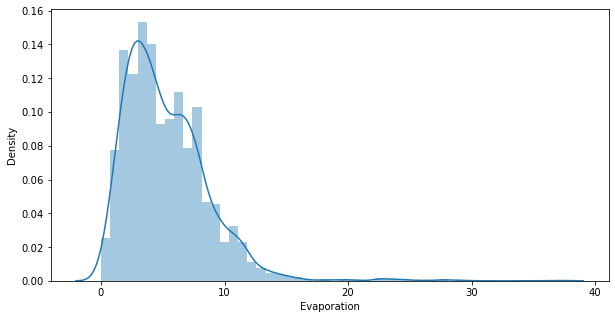

In [501]:
plt.figure(figsize=(10,5))
sns.distplot(df['Evaporation'])
print(df['Evaporation'].skew())

print(df['Evaporation'].kurt())

<AxesSubplot:xlabel='Evaporation'>

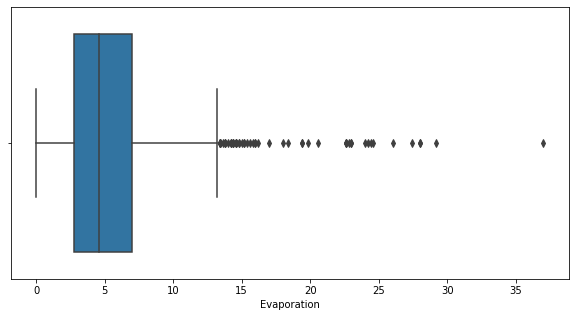

In [502]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Evaporation'])

In Evaporation column we can see there is highly skewness is present and also ouliers are presents.

-0.6939485560809197
-0.5442601860625773


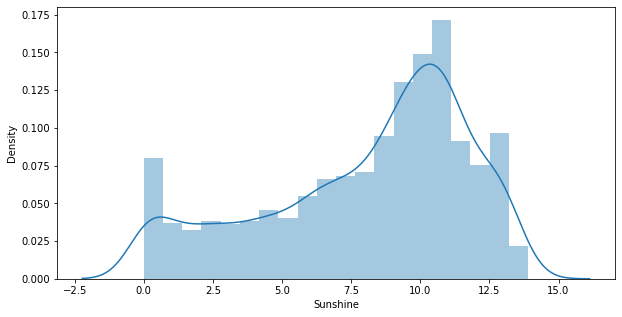

In [503]:
plt.figure(figsize=(10,5))
sns.distplot(df['Sunshine'])
print(df['Sunshine'].skew())

print(df['Sunshine'].kurt())

<AxesSubplot:xlabel='Sunshine'>

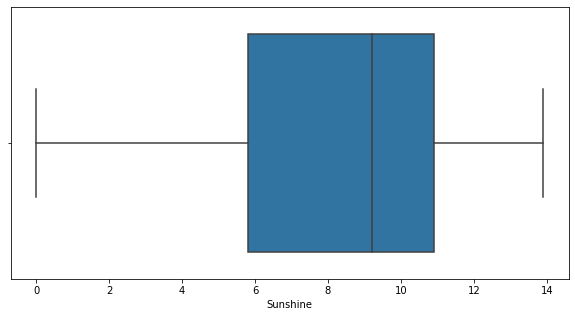

In [504]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Sunshine'])

this column is almost normally distributed and also dont have any outliers.

0.6890794822563625
0.4865441828157535


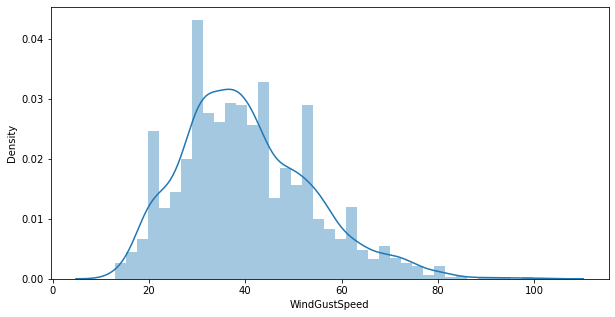

In [505]:
plt.figure(figsize=(10,5))
sns.distplot(df['WindGustSpeed'])
print(df['WindGustSpeed'].skew())

print(df['WindGustSpeed'].kurt())

<AxesSubplot:xlabel='WindGustSpeed'>

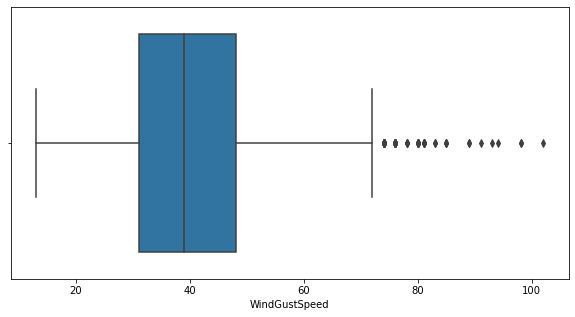

In [506]:
plt.figure(figsize=(10,5))
sns.boxplot(df['WindGustSpeed'])

this column is also normally distributed and also have outliers are presents.

0.8437127996888555
0.7418949479366139


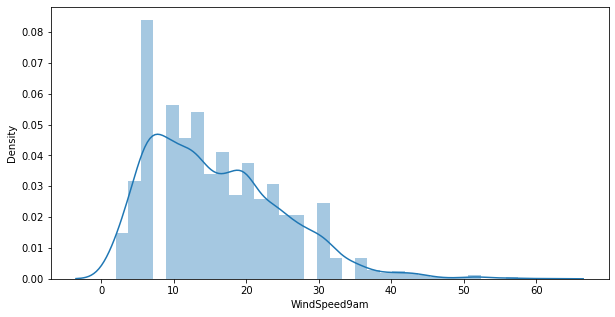

In [507]:
plt.figure(figsize=(10,5))
sns.distplot(df['WindSpeed9am'])
print(df['WindSpeed9am'].skew())

print(df['WindSpeed9am'].kurt())

<AxesSubplot:xlabel='WindSpeed9am'>

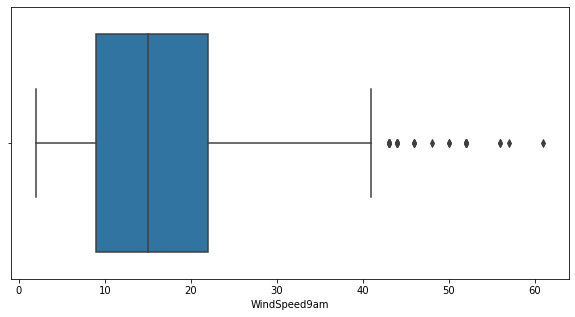

In [508]:
plt.figure(figsize=(10,5))
sns.boxplot(df['WindSpeed9am'])

In this column we can observed that there is highly skewness is present and also ouliers are presents.

0.3591576003775645
-0.21638761334115797


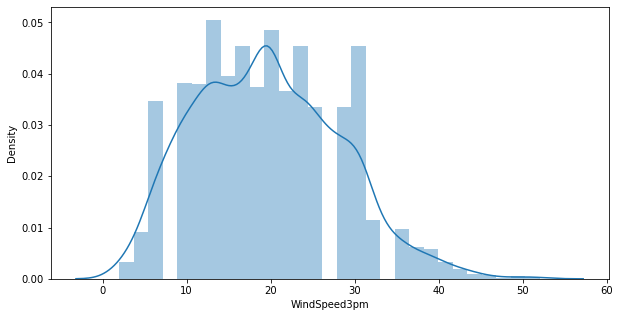

In [509]:
plt.figure(figsize=(10,5))
sns.distplot(df['WindSpeed3pm'])
print(df['WindSpeed3pm'].skew())

print(df['WindSpeed3pm'].kurt())

<AxesSubplot:xlabel='WindSpeed3pm'>

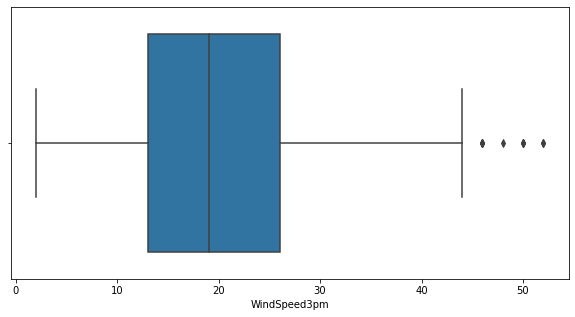

In [510]:
plt.figure(figsize=(10,5))
sns.boxplot(df['WindSpeed3pm'])

this column have also ouliers are presents.

-0.16452823630559157
-0.3591930707877271


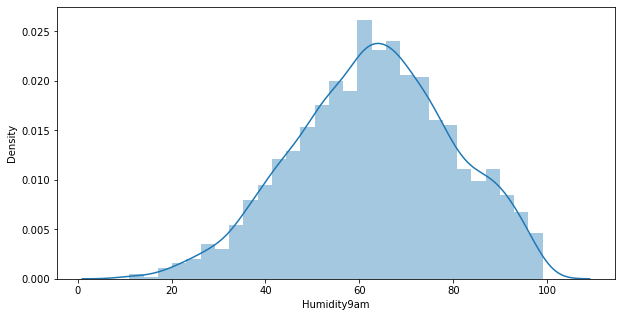

In [511]:
plt.figure(figsize=(10,5))
sns.distplot(df['Humidity9am'])
print(df['Humidity9am'].skew())

print(df['Humidity9am'].kurt())

<AxesSubplot:xlabel='Humidity9am'>

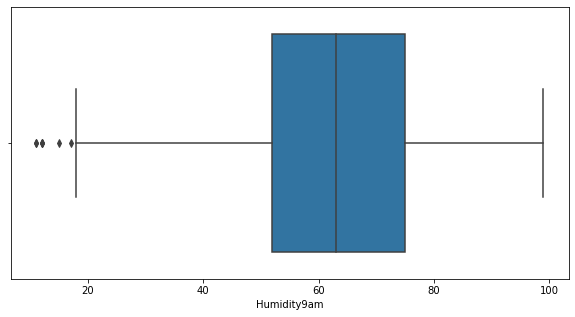

In [512]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Humidity9am'])

in Humidity column have also skewness is present and ouliers are presents.

0.17839447467241254
-0.2106035542513478


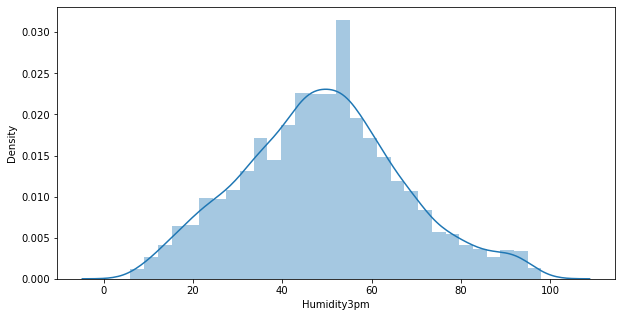

In [513]:
plt.figure(figsize=(10,5))
sns.distplot(df['Humidity3pm'])
print(df['Humidity3pm'].skew())

print(df['Humidity3pm'].kurt())

<AxesSubplot:xlabel='Humidity3pm'>

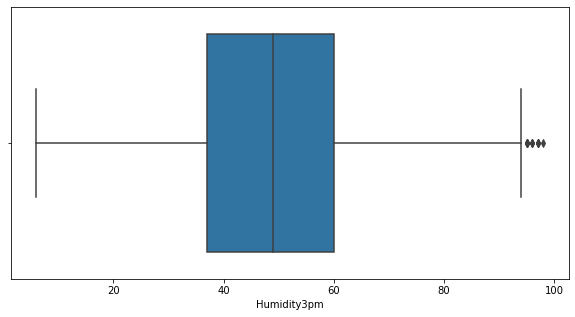

In [514]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Humidity3pm'])

This column is looks like normal distributed but oulierrs are presents.

0.09116616071322277
0.1893611182878856


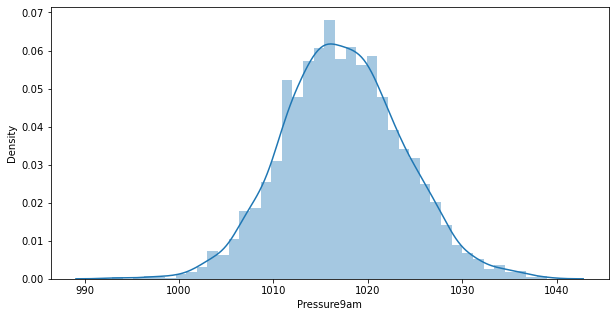

In [515]:
plt.figure(figsize=(10,5))
sns.distplot(df['Pressure9am'])
print(df['Pressure9am'].skew())

print(df['Pressure9am'].kurt())

<AxesSubplot:xlabel='Pressure9am'>

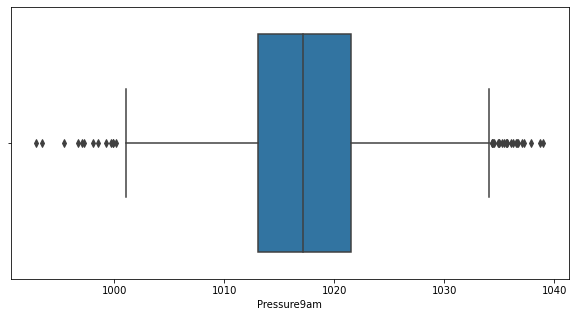

In [516]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Pressure9am'])

In this column we can see ouliers are presents.

0.15107239056303973
0.08949317970084891


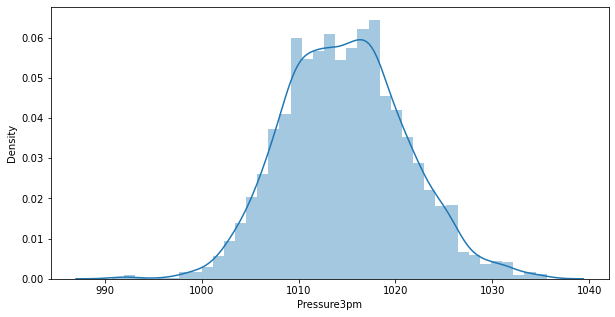

In [517]:
plt.figure(figsize=(10,5))
sns.distplot(df['Pressure3pm'])
print(df['Pressure3pm'].skew())

print(df['Pressure3pm'].kurt())

<AxesSubplot:xlabel='Pressure3pm'>

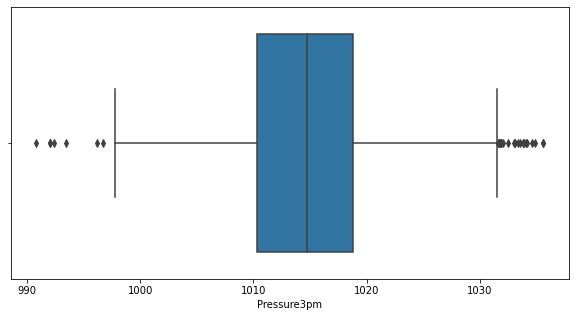

In [518]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Pressure3pm'])

In this column have also some ouliers are presents.

-0.003180008068048749
-1.5928301387107553


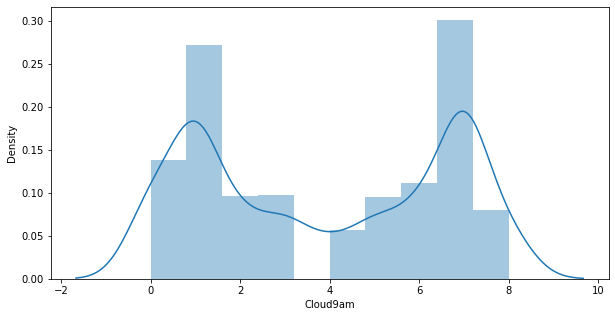

In [519]:
plt.figure(figsize=(10,5))
sns.distplot(df['Cloud9am'])
print(df['Cloud9am'].skew())

print(df['Cloud9am'].kurt())

<AxesSubplot:xlabel='Cloud9am'>

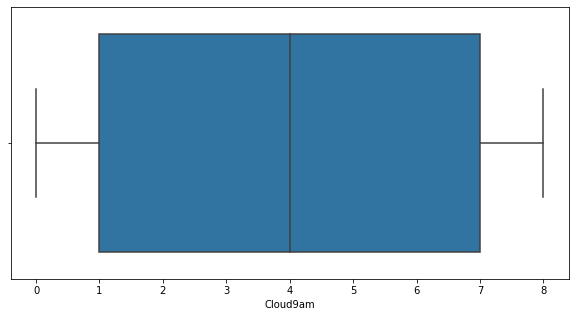

In [520]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Cloud9am'])

-0.04040376091725848
-1.5137669196914842


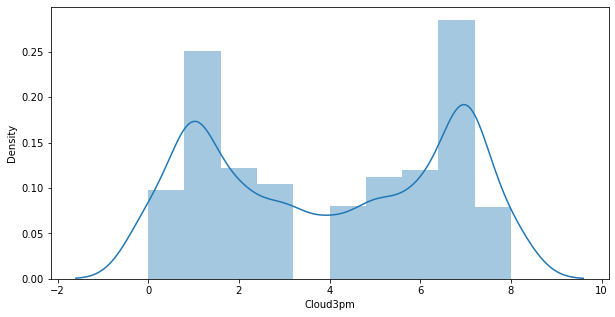

In [521]:
plt.figure(figsize=(10,5))
sns.distplot(df['Cloud3pm'])
print(df['Cloud3pm'].skew())

print(df['Cloud3pm'].kurt())

<AxesSubplot:xlabel='Cloud3pm'>

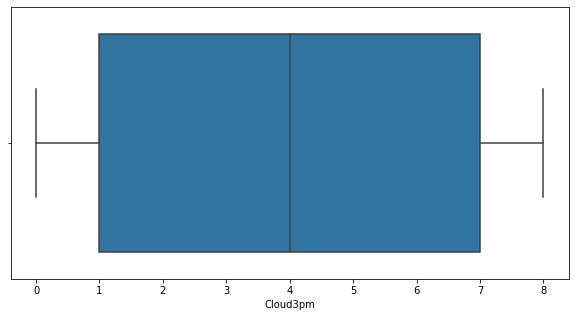

In [522]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Cloud3pm'])

.in Cloud9am and Cloud3pm column we can se same observation there is no ouliers in both columns and nomaly distributed.

0.011791229334744966
-0.5885960672274559


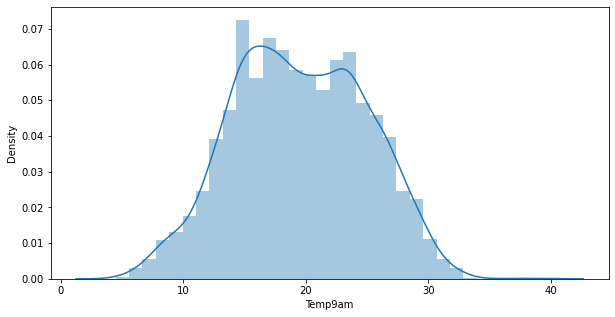

In [523]:
plt.figure(figsize=(10,5))
sns.distplot(df['Temp9am'])
print(df['Temp9am'].skew())

print(df['Temp9am'].kurt())

<AxesSubplot:xlabel='Temp9am'>

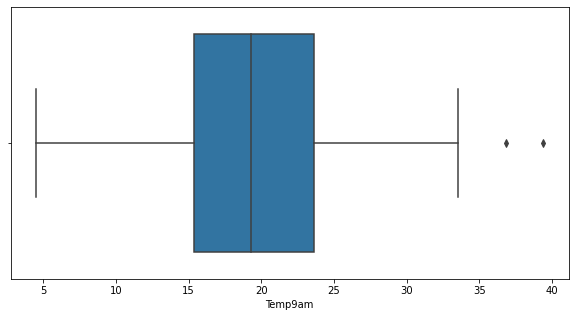

In [524]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Temp9am'])

In this columns ouliers are presents.

0.24551986891231042
-0.44576447223326676


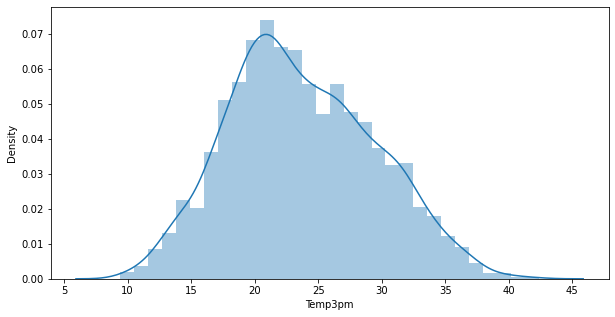

In [525]:
plt.figure(figsize=(10,5))
sns.distplot(df['Temp3pm'])
print(df['Temp3pm'].skew())

print(df['Temp3pm'].kurt())

<AxesSubplot:xlabel='Temp3pm'>

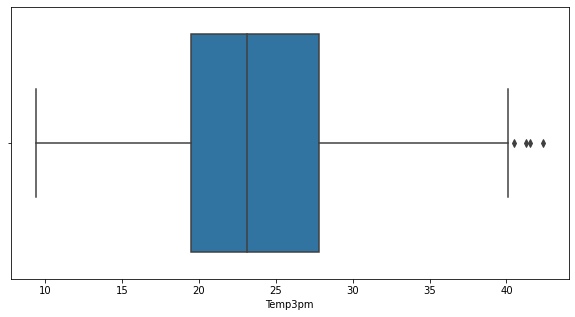

In [526]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Temp3pm'])

This column is almost normally disrtributed but outliers are presrents.

### Let's handel catagorical columns:

In [237]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [238]:
df['Location'] = le.fit_transform(df['Location'])
df['WindGustDir'] = le.fit_transform(df['WindGustDir'])
df['WindDir9am'] = le.fit_transform(df['WindDir9am'])
df['WindDir3pm'] = le.fit_transform(df['WindDir3pm'])
df['RainToday'] = le.fit_transform(df['RainToday'])
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])

### Let's Handel skewness:

In [66]:
df['Rainfall'] = np.sqrt(df['Rainfall'])
df['Evaporation'] = np.sqrt(df['Evaporation'])
df['WindGustSpeed'] =np.sqrt(df['WindGustSpeed'])
df['WindSpeed9am'] =np.sqrt(df['WindSpeed9am'])
df['Humidity9am'] =np.sqrt(df['Humidity9am'])

### Let's Handel Outliers:

In [67]:
# handling outlies :
from scipy import stats

from scipy.stats import zscore
z_score = zscore(df[['Rainfall','MaxTemp','Evaporation','WindGustSpeed','WindSpeed9am','Humidity3pm','Pressure9am','Pressure3pm','Temp9am','Temp3pm']])
abs_z_score = np.abs(z_score)
filtering_entry = (abs_z_score < 3).all(axis=1)
df = df[filtering_entry]
df.reset_index(inplace = True)

In [68]:
df.shape

(3009, 24)

In [69]:
df.head()

,index,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,908,2009-03-11,1,18.7,25.6,2.607681,1.949359,3.4,0,5.744563,...,9.219544,90.0,1020.7,1020.1,4.0,7.0,21.0,20.9,1,1
1,909,2009-03-12,1,16.5,25.5,4.098780,1.673320,6.1,15,4.358899,...,9.165151,65.0,1021.5,1020.1,5.0,7.0,21.0,24.5,1,0
2,910,2009-03-13,1,18.5,26.9,0.000000,1.788854,11.0,1,5.477226,...,8.246211,60.0,1018.9,1016.6,2.0,5.0,23.3,26.4,0,0
3,911,2009-03-14,1,18.2,28.2,0.000000,2.607681,9.0,5,7.071068,...,8.185353,68.0,1016.3,1012.8,1.0,1.0,24.0,25.9,0,1
4,912,2009-03-15,1,20.1,29.4,1.788854,1.949359,7.1,5,6.782330,...,9.486833,68.0,1012.9,1008.5,6.0,2.0,22.0,27.2,1,0


In [70]:
# lets drop unessesory columns:
df = df.drop(['Date','index'],axis=1)

### Lets check the coorelations:

<AxesSubplot:>

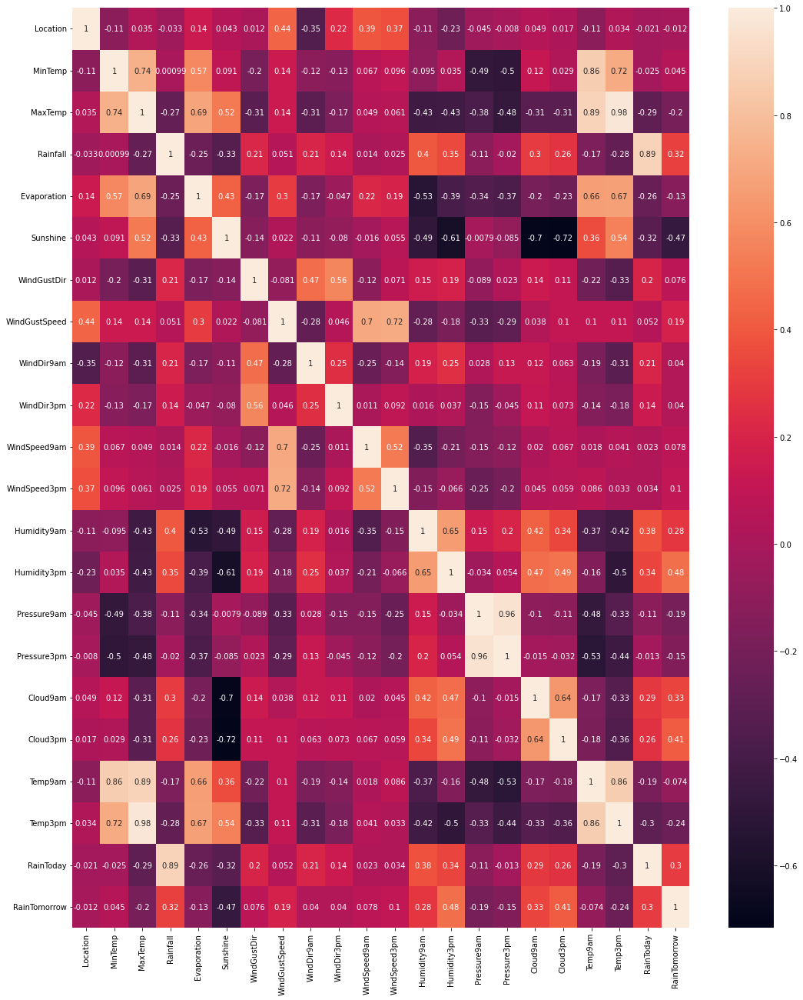

In [30]:
plt.figure(figsize=(18,22))
sns.heatmap(df.corr(),annot = True)

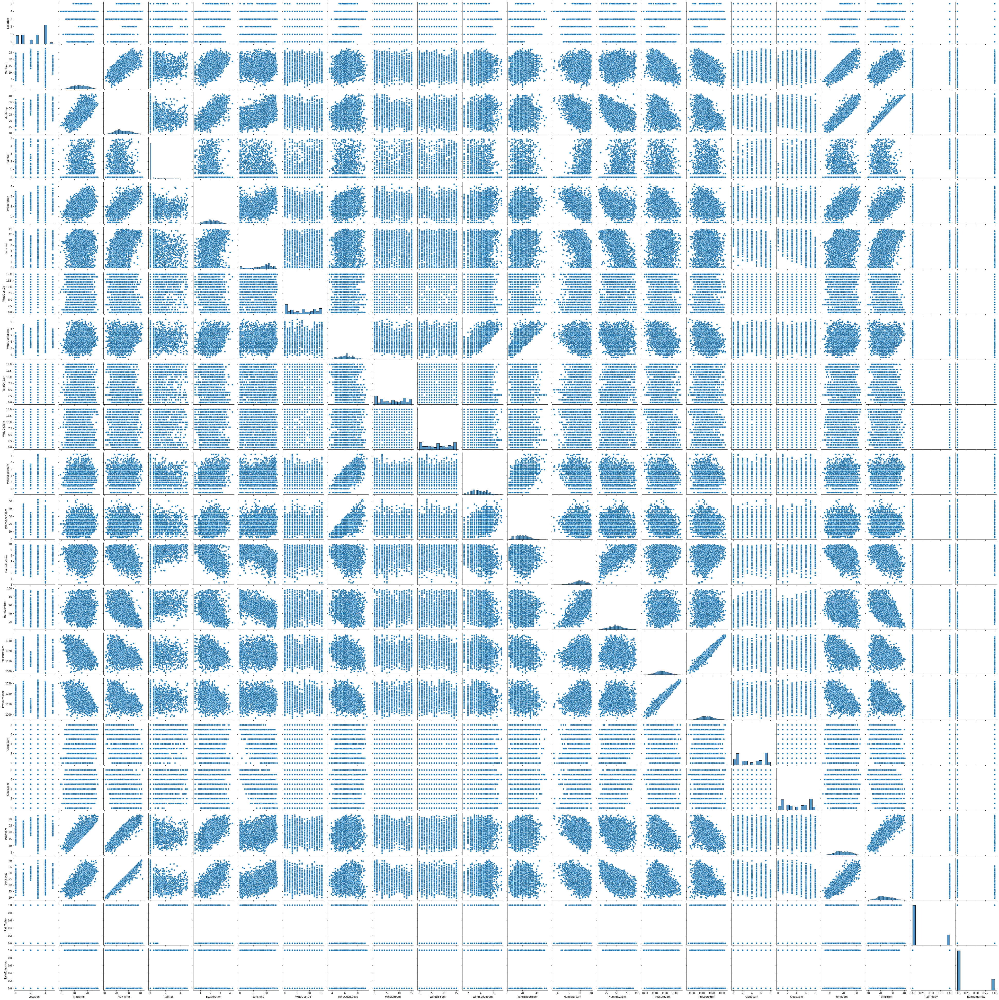

In [72]:
#lets check the relations:
sns.pairplot(df)

### Seprate the dependent and Independent variables:

In [73]:
x = df.drop('RainTomorrow',axis =1)
y = df['RainTomorrow']

In [74]:
# using this methd for biasness
Scaler =StandardScaler()
x = pd.DataFrame(Scaler.fit_transform(x),columns = x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-0.935644,0.851430,0.063664,1.840769,-0.325009,-1.302294,-1.415576,-0.479017,0.980508,0.076707,...,-0.757482,1.275787,2.327803,0.526630,0.857467,0.057597,1.145828,0.275079,-0.497380,1.943242
1,-0.935644,0.432922,0.046537,3.190959,-0.739485,-0.563874,1.572127,-1.815612,1.601895,-1.167563,...,-1.227434,1.225614,0.921045,0.656630,0.857467,0.418657,1.145828,0.275079,0.131084,1.943242
2,-0.935644,0.813384,0.286316,-0.520484,-0.566009,0.776221,-1.216396,-0.736888,0.980508,-1.374941,...,0.064933,0.377970,0.639694,0.234131,0.285893,-0.664524,0.390147,0.702558,0.462772,-0.514604
3,-0.935644,0.756314,0.508967,-0.520484,0.663470,0.229243,-0.419675,0.800514,-0.262267,-0.752806,...,1.827250,0.321833,1.089856,-0.188368,-0.334673,-1.025584,-1.121216,0.832660,0.375486,-0.514604
4,-0.935644,1.117753,0.714491,1.099323,-0.325009,-0.290385,-0.419675,0.522001,-0.262267,-0.545428,...,1.357299,1.522338,1.089856,-0.740866,-1.036893,0.779717,-0.743375,0.460939,0.602431,1.943242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3004,-0.303549,2.087930,1.587970,1.047887,-0.248971,0.283941,-0.419675,0.003697,-0.883655,-0.545428,...,0.299908,0.265276,-0.148091,-1.000865,-1.134878,1.140778,1.145828,1.873479,1.684784,1.943242
3005,-0.303549,2.278161,1.382446,-0.520484,0.425944,-0.618572,-0.818035,1.068092,-1.297913,-1.582320,...,-0.757482,0.265276,2.496614,-1.147115,-1.314515,0.057597,1.523668,1.984995,0.253285,-0.514604
3006,-0.303549,2.030861,1.296810,3.569327,0.486740,0.147197,1.372946,-0.152794,-0.469396,-0.130671,...,0.064933,0.598492,0.358342,-1.228364,-1.412499,0.057597,0.767987,1.854893,1.440382,1.943242
3007,-0.303549,2.144999,1.348192,-0.520484,0.037653,-0.290385,0.576226,-0.152794,-1.505042,1.528356,...,-0.757482,0.034644,0.527153,-1.033365,-1.298185,1.140778,1.145828,1.687619,1.353095,-0.514604


In [75]:
# lets check y values counts:
y.value_counts()

0    2360
1     649
Name: RainTomorrow, dtype: int64

In [76]:
#oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [77]:
y.value_counts()

1    2360
0    2360
Name: RainTomorrow, dtype: int64

### Testing-Spliting:

In [78]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25, random_state =42)

In [79]:
from sklearn.metrics  import confusion_matrix,classification_report,accuracy_score

In [80]:
def metric_score(clf, x_train,x_test,y_train,y_test,train = True):
    if train:
        y_pred = clf.predict(x_train)
        
        print("\n==========Train Result=========")
        
        print(f"Accuracy Score: {accuracy_score(y_train,y_pred)*100: .2f}%")
        
    
    elif train==False:
        pred = clf.predict(x_test)
        
        print("\n=========Train Result========")
        
        print(f"Accuracy Score: {accuracy_score(y_test, pred)*100: .2f}%")
        
        print('\n \n Test Cassification Report \n',classification_report(y_test,pred,digits=2))

### Training the Models:

In [81]:
#for DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

In [82]:
Dec = DecisionTreeClassifier()
Dec.fit(x_train,y_train)

DecisionTreeClassifier()

In [83]:
metric_score(Dec,x_train,x_test,y_train,y_test,train=True)

metric_score(Dec,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  100.00%

=========Train Result========
Accuracy Score:  84.83%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.87      0.83      0.85       601
           1       0.83      0.87      0.85       579

    accuracy                           0.85      1180
   macro avg       0.85      0.85      0.85      1180
weighted avg       0.85      0.85      0.85      1180



In [86]:
# for RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

In [87]:
RFR = RandomForestClassifier()
RFR.fit(x_train,y_train)

RandomForestClassifier()

In [88]:
metric_score(RFR,x_train,x_test,y_train,y_test,train=True)
metric_score(RFR,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  100.00%

=========Train Result========
Accuracy Score:  91.19%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.93      0.89      0.91       601
           1       0.89      0.93      0.91       579

    accuracy                           0.91      1180
   macro avg       0.91      0.91      0.91      1180
weighted avg       0.91      0.91      0.91      1180



In [77]:
# for AdaBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [78]:
Adb = AdaBoostClassifier()
Adb.fit(x_train,y_train)

AdaBoostClassifier()

In [79]:
metric_score(Adb,x_train,x_test,y_train,y_test,train=True)
metric_score(Adb,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  86.27%

=========Train Result========
Accuracy Score:  84.57%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.87      0.84      0.85       745
           1       0.82      0.86      0.84       668

    accuracy                           0.85      1413
   macro avg       0.85      0.85      0.85      1413
weighted avg       0.85      0.85      0.85      1413



In [80]:
# for GradientbosstingClaasifier
from sklearn.ensemble import GradientBoostingClassifier

In [81]:
Grb =GradientBoostingClassifier ()
Grb.fit(x_train,y_train)

GradientBoostingClassifier()

In [82]:
metric_score(Grb,x_train,x_test,y_train,y_test,train=True)
metric_score(Grb,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  91.74%

=========Train Result========
Accuracy Score:  88.89%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           0       0.92      0.87      0.89       745
           1       0.86      0.91      0.89       668

    accuracy                           0.89      1413
   macro avg       0.89      0.89      0.89      1413
weighted avg       0.89      0.89      0.89      1413



### Cross-val-score:

In [90]:
from sklearn.model_selection import cross_val_score

In [85]:
#checkig cv score for DecisionTreeClassifier
score = cross_val_score(Dec,x,y)
print(score)
print(score.mean())

[0.74005305 0.81432361 0.67168142 0.88584071 0.83982301]
0.7903443581136592


In [91]:
#checkig cv score for RandomForestClassifier
score = cross_val_score(RFR,x,y)
print(score)
print(score.mean())

[0.79449153 0.78072034 0.9184322  0.9375     0.90677966]
0.8675847457627119


In [87]:
# checking cv score for AdaBoostClassifier
score = cross_val_score(Adb,x,y)
print(score)
print(score.mean())

[0.56321839 0.70291777 0.58318584 0.83097345 0.8380531 ]
0.7036697104136835


In [88]:
# checking cv score for GradientBoostingClassifier
score = cross_val_score(Grb,x,y)
print(score)
print(score.mean())

[0.63837312 0.75862069 0.70884956 0.90176991 0.87345133]
0.7762129214494182


I am choosing RandomForestClassifier as my best Model.

### Hperperameters:

In [92]:
#  RandomForestClassifier:
from sklearn.model_selection import RandomizedSearchCV

parameters = {'max_depth':[2,8,],
              'max_features':[0.2,0.6,1.0],
              'n_estimators':[20,60,100,120],
              'max_samples':[0.5,0.75,1.0],
              'criterion':['gini','entropy'],
              'bootstrap':[True,False]}

In [93]:
RFR =  RandomizedSearchCV(RandomForestClassifier(),parameters,cv= 5)

In [94]:
RFR.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 8],
                                        'max_features': [0.2, 0.6, 1.0],
                                        'max_samples': [0.5, 0.75, 1.0],
                                        'n_estimators': [20, 60, 100, 120]})

In [95]:
RFR.best_params_

{'n_estimators': 60,
 'max_samples': 1.0,
 'max_features': 0.2,
 'max_depth': 8,
 'criterion': 'gini',
 'bootstrap': True}

In [96]:
RFR.best_score_

0.8947879307656323

In [96]:
Final_model = RandomForestClassifier(n_estimators = 60, max_features= 0.2,max_depth= 8,criterion= 'gini',bootstrap = 'True',max_samples=1.0)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

89.0677966101695


### Saving this Model:

In [97]:
# we use joblib methode for save the model
import joblib
joblib.dump(Final_model,"RainTommorrow Prediction")

['RainTommorrow Prediction']

In [98]:
# load the saved model
model = joblib.load("RainTommorrow Prediction")

#pediction
prediction = model.predict(x_test)
prediction

array([1, 0, 1, ..., 0, 0, 0])

In [99]:
x = df.drop('Rainfall',axis =1)
y = df['Rainfall']

In [100]:
# using this methd for biasness
Scaler =StandardScaler()
x = pd.DataFrame(Scaler.fit_transform(x),columns = x.columns)
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,-0.935644,0.851430,0.063664,-0.325009,-1.302294,-1.415576,-0.479017,0.980508,0.076707,0.287950,...,1.275787,2.327803,0.526630,0.857467,0.057597,1.145828,0.275079,-0.497380,1.943242,1.906925
1,-0.935644,0.432922,0.046537,-0.739485,-0.563874,1.572127,-1.815612,1.601895,-1.167563,-1.166493,...,1.225614,0.921045,0.656630,0.857467,0.418657,1.145828,0.275079,0.131084,1.943242,-0.524404
2,-0.935644,0.813384,0.286316,-0.566009,0.776221,-1.216396,-0.736888,0.980508,-1.374941,-0.995933,...,0.377970,0.639694,0.234131,0.285893,-0.664524,0.390147,0.702558,0.462772,-0.514604,-0.524404
3,-0.935644,0.756314,0.508967,0.663470,0.229243,-0.419675,0.800514,-0.262267,-0.752806,-0.161826,...,0.321833,1.089856,-0.188368,-0.334673,-1.025584,-1.121216,0.832660,0.375486,-0.514604,1.906925
4,-0.935644,1.117753,0.714491,-0.325009,-0.290385,-0.419675,0.522001,-0.262267,-0.545428,-0.161826,...,1.522338,1.089856,-0.740866,-1.036893,0.779717,-0.743375,0.460939,0.602431,1.943242,-0.524404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3004,-0.303549,2.087930,1.587970,-0.248971,0.283941,-0.419675,0.003697,-0.883655,-0.545428,-0.412916,...,0.265276,-0.148091,-1.000865,-1.134878,1.140778,1.145828,1.873479,1.684784,1.943242,-0.524404
3005,-0.303549,2.278161,1.382446,0.425944,-0.618572,-0.818035,1.068092,-1.297913,-1.582320,-0.161826,...,0.265276,2.496614,-1.147115,-1.314515,0.057597,1.523668,1.984995,0.253285,-0.514604,1.906925
3006,-0.303549,2.030861,1.296810,0.486740,0.147197,1.372946,-0.152794,-0.469396,-0.130671,-0.161826,...,0.598492,0.358342,-1.228364,-1.412499,0.057597,0.767987,1.854893,1.440382,1.943242,-0.524404
3007,-0.303549,2.144999,1.348192,0.037653,-0.290385,0.576226,-0.152794,-1.505042,1.528356,0.591273,...,0.034644,0.527153,-1.033365,-1.298185,1.140778,1.145828,1.687619,1.353095,-0.514604,-0.524404


In [101]:
# import necessoy librories:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

In [102]:
#finding best random state
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.30,random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred= lr.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"on Random_state",maxRS)

Maximum r2 score is  0.822122967902535 on Random_state 177


In [103]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,random_state = maxRS)

In [104]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import ExtraTreesRegressor

In [105]:
DE= DecisionTreeRegressor()
DE.fit(x_train,y_train)
pred_DE=DE.predict(x_test)
pred_train=DE.predict(x_train)
print('R2_score:',r2_score(y_test,pred_DE))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_DE))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_DE))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_DE)))

R2_score: 0.6416369919862841
R2_score on training Data: 100.0
Mean Absolute Error:- 0.3162594875941472
Mean Squared Error:- 0.4319698872897601
Root Mean Squared Error:- 0.6572441610921774


In [106]:
RF= RandomForestRegressor()
RF.fit(x_train,y_train)
pred_RF=RF.predict(x_test)
pred_train=RF.predict(x_train)
print('R2_score:',r2_score(y_test,pred_RF))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_RF))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_RF))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_RF)))

R2_score: 0.8162202439648666
R2_score on training Data: 97.08611462616754
Mean Absolute Error:- 0.2512114293149324
Mean Squared Error:- 0.22152766531527093
Root Mean Squared Error:- 0.4706672554100943


In [113]:
KN=  KNN()
KN.fit(x_train,y_train)
pred_KN=KN.predict(x_test)
pred_train=KN.predict(x_train)
print('R2_score:',r2_score(y_test,pred_KN))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_KN))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_KN))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_KN)))

R2_score: 0.8014399867192852
R2_score on training Data: 83.93376320852151
Mean Absolute Error:- 0.2530372302880723
Mean Squared Error:- 0.24243369638433912
Root Mean Squared Error:- 0.49237556436559593


In [114]:
ET=  ExtraTreesRegressor()
ET.fit(x_train,y_train)
pred_ET=ET.predict(x_test)
pred_train=ET.predict(x_train)
print('R2_score:',r2_score(y_test,pred_ET))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_ET))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_ET))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_ET)))

R2_score: 0.855052542589701
R2_score on training Data: 100.0
Mean Absolute Error:- 0.1883762674545853
Mean Squared Error:- 0.17697494727607047
Root Mean Squared Error:- 0.4206839042274739


### Cross-val-score:

In [107]:
from sklearn.model_selection import cross_val_score

In [108]:
score = cross_val_score(RF,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_RF)-score.mean())*100)

[0.78583311 0.69536737 0.8239326  0.80879534 0.80087901]
0.7829614847156006
Diffrence between R2 score and cross validation score is- 3.3258759249266023


In [117]:
score = cross_val_score(DE,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_DE)-score.mean())*100)

[0.55750094 0.8366421  0.74388207 0.66934457 0.61818434]
0.6851108037522199
Diffrence between R2 score and cross validation score is- 3.1403863035024293


In [118]:
score = cross_val_score(KN,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_KN)-score.mean())*100)

[0.72076794 0.7638223  0.76852176 0.77526063 0.78183249]
0.7620410231918934
Diffrence between R2 score and cross validation score is- 3.9398963527391806


In [119]:
score = cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_ET)-score.mean())*100)

[0.8068408  0.92769368 0.88174977 0.82577023 0.80397816]
0.849206530632768
Diffrence between R2 score and cross validation score is- 0.5846011956933017


I am choosing RandomforestRegressor as my best model:

### Hyperperameters tunning:

In [109]:
#  RandomForestRegressor:
from sklearn.model_selection import RandomizedSearchCV

param = {'max_depth':[int(x)for x in np.linspace(5,10,num=2)],
              'max_features':['auto','log2'],
              'n_estimators':[int(X)for X in np.linspace(start=5,stop=15,num=10)],
              'bootstrap':[True,False]}

In [110]:
RF=  RandomizedSearchCV(RandomForestRegressor(),param,cv= 5)

In [111]:
RF.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [5, 10],
                                        'max_features': ['auto', 'log2'],
                                        'n_estimators': [5, 6, 7, 8, 9, 10, 11,
                                                         12, 13, 15]})

In [112]:
RF.best_params_

{'n_estimators': 11,
 'max_features': 'log2',
 'max_depth': 10,
 'bootstrap': True}

In [113]:
RF.best_score_

0.7641591017018621

In [114]:
Model = RandomForestRegressor(n_estimators = 15, max_features= 'log2',max_depth= 10,bootstrap='True')
Model.fit(x_train,y_train)
pred = Model.predict(x_test)
print('R2_score:',r2_score(y_test,pred))
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred))
print('Mean Squared Error:-',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred)))

R2_score: 0.7873099076345824
Mean Absolute Error:- 0.28762904180149734
Mean Squared Error:- 0.2563761135279389
Root Mean Squared Error:- 0.50633596902446


### Saving model:

In [115]:
# we use joblib methode for save the model
import joblib
joblib.dump(Model,"RainFall Prediction")

['RainFall Prediction']

In [116]:
# load the saved model
model = joblib.load("RainFall Prediction")

#pediction
prediction = model.predict(x_test)
prediction

array([1.42027682e-01, 1.64480907e-02, 2.51666739e+00, 9.19197781e-03,
       3.79681586e-01, 7.86934504e-02, 1.13955952e-03, 1.26613963e-02,
       1.20696559e-01, 2.10285033e-01, 4.09307534e-01, 2.09068103e+00,
       1.56066638e-01, 2.56506697e-01, 2.54336749e+00, 4.83389796e-01,
       5.70896103e-02, 1.41805848e-02, 2.45321161e+00, 8.29776974e-03,
       1.53349596e-01, 1.67701448e-01, 2.59575023e-02, 2.83690403e-02,
       6.32097684e-02, 5.41919373e-02, 5.26549239e-02, 3.11857302e-02,
       3.65956894e-01, 7.78638171e-02, 3.05336997e-03, 2.32150280e-01,
       2.94947078e+00, 9.33973909e-02, 1.95084300e+00, 8.75552582e-02,
       7.79581469e-02, 1.60184746e-01, 8.51298929e-02, 1.49726380e+00,
       3.24271333e-01, 9.02487218e-04, 2.75804625e-01, 9.94526532e-02,
       1.60435360e+00, 2.82817129e-02, 1.37537254e-03, 2.27505147e+00,
       2.60765528e-02, 9.45184866e-04, 9.21992194e-03, 1.11046990e-01,
       1.18581685e-01, 2.96240491e-01, 1.06795207e-02, 1.17453940e-02,
      

These are our Predictions.

# 3)Insurance Claim Fraud Detection:

In [89]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

### https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv

In [90]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")

In [86]:
# checking first 5 rows:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [87]:
# checking shape of our data set:
df.shape

(1000, 40)

in our data set there is 1000 rows and 40 rows.

In [88]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [89]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [91]:
# checking missing values
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In this data set no null value.

In [92]:
# checking duplicate values:
df.duplicated().sum()

0

There is no any duplicate values.But in our data set we can see there is ? null values we have to handel these values.

In [93]:
# handel these ? values:
df.replace('?',np.nan,inplace=True)

In [94]:
# checking type of a data
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

# Visualization:

N    753
Y    247
Name: fraud_reported, dtype: int64


<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

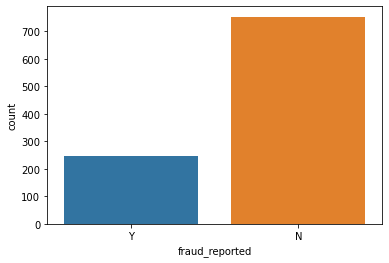

In [95]:
# checking fraud_report column
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'])

acc. to this column mostly the case of Fraud is 'No'.

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


<AxesSubplot:xlabel='policy_state', ylabel='count'>

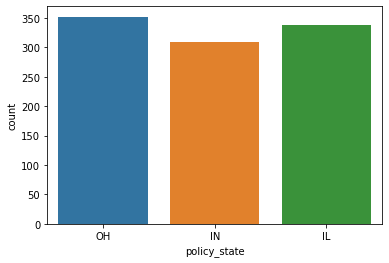

In [3]:
# checking policy state column:
print(df['policy_state'].value_counts())
sns.countplot(df['policy_state'])

In policy_state column 'OH'column is higher than another columns.

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


<AxesSubplot:xlabel='policy_csl', ylabel='count'>

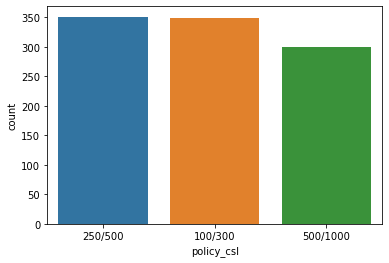

In [5]:
# checking policy state column:
print(df['policy_csl'].value_counts())
sns.countplot(df['policy_csl'])

in this column  basically Combined Single Limit is 25/500 is higher than another.

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


<AxesSubplot:xlabel='insured_sex', ylabel='count'>

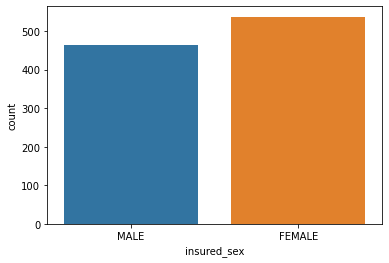

In [98]:
# checking policy state column:
print(df['insured_sex'].value_counts())
sns.countplot(df['insured_sex'])

In this column Female have higer reproductive function than the male.

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

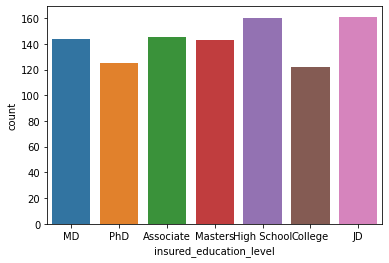

In [99]:
print(df['insured_education_level'].value_counts())
sns.countplot(df['insured_education_level'])

Acc. to this column the Level of education 'JD' customer id higher than another .

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


<AxesSubplot:xlabel='insured_occupation', ylabel='count'>

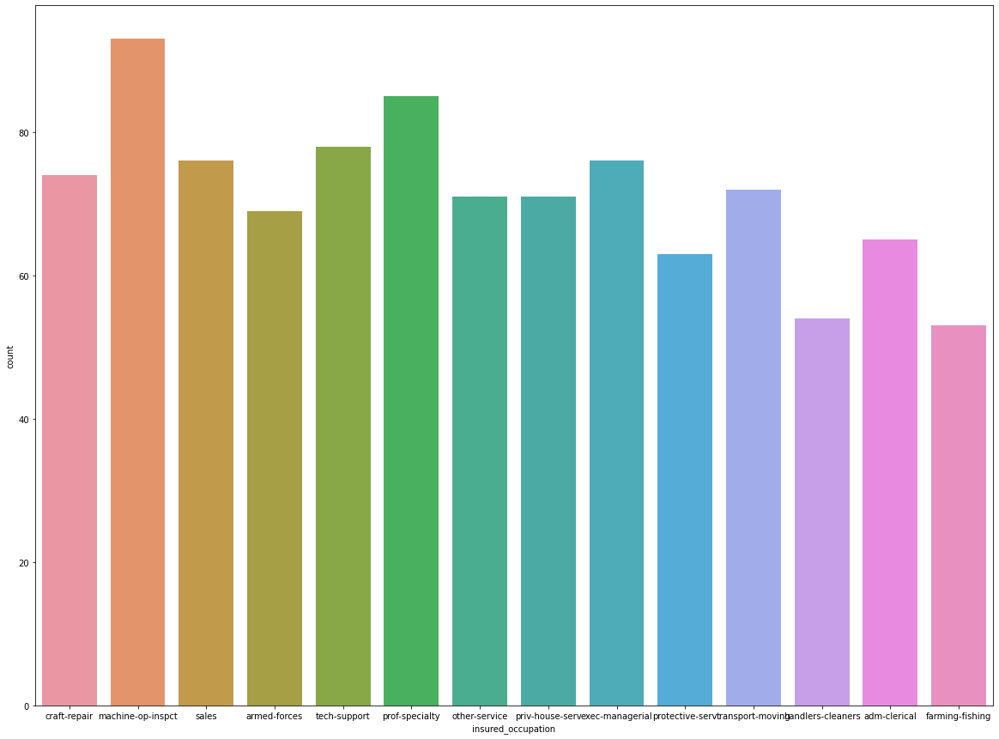

In [100]:
plt.figure(figsize=(20,15))
print(df['insured_occupation'].value_counts())
sns.countplot(df['insured_occupation'])

The Occupation of the customer machine-op-inspct is higher than another.

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

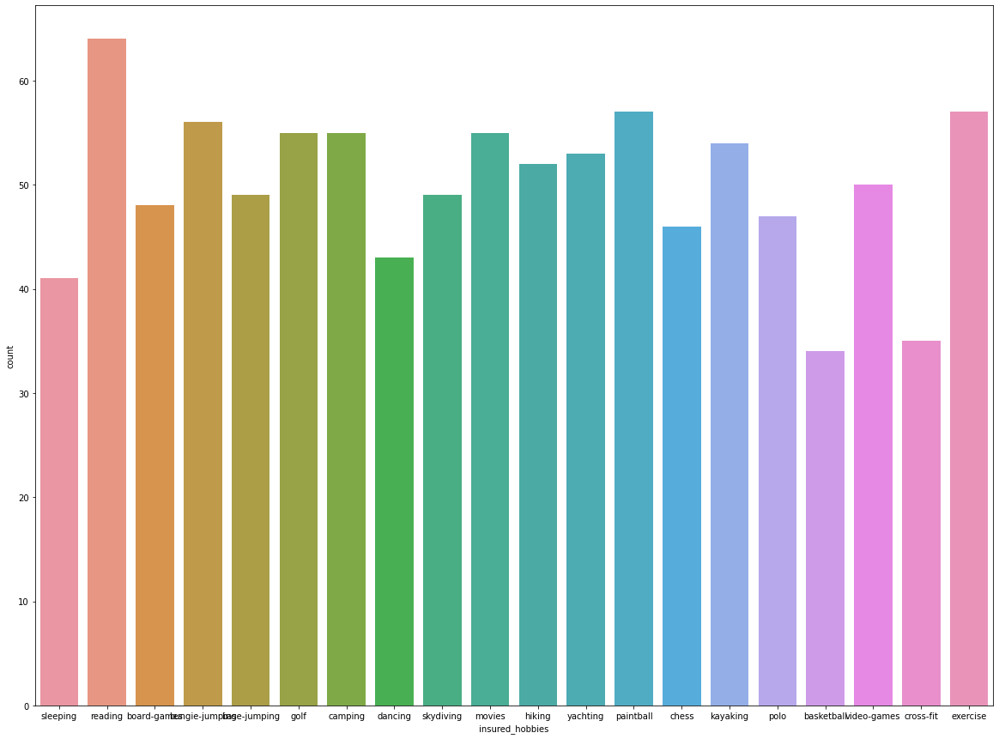

In [101]:
plt.figure(figsize=(20,15))
print(df['insured_hobbies'].value_counts())
sns.countplot(df['insured_hobbies'])

In this column 'reading' column is higher than another.

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

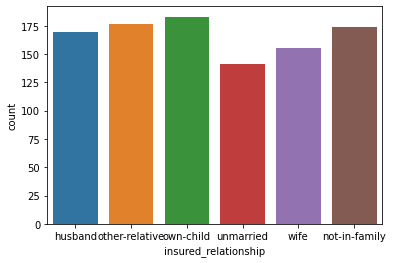

In [102]:
print(df['insured_relationship'].value_counts())
sns.countplot(df['insured_relationship'])

In this column the customer own-child category is higher than another.

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


<AxesSubplot:xlabel='incident_type', ylabel='count'>

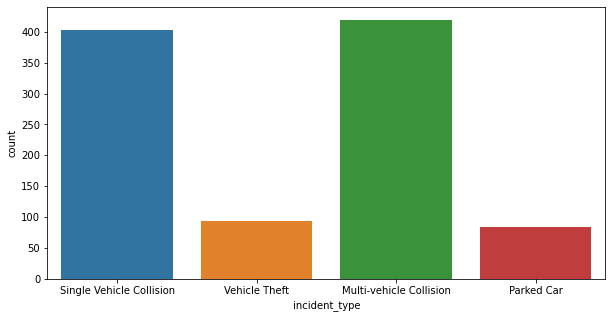

In [103]:
plt.figure(figsize=(10,5))
print(df['incident_type'].value_counts())
sns.countplot(df['incident_type'])

vehicle damage made by customer 'Multi-vehicle Collision' coolumn is higher than another.

Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


<AxesSubplot:xlabel='collision_type', ylabel='count'>

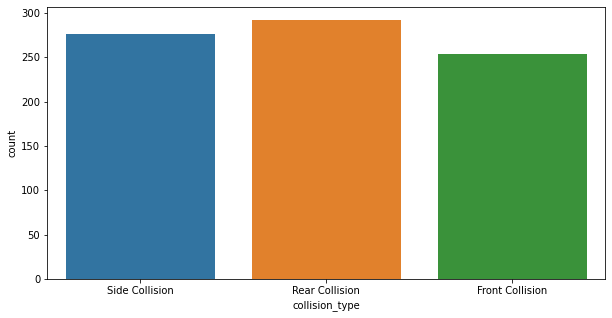

In [104]:
plt.figure(figsize=(10,5))
print(df['collision_type'].value_counts())
sns.countplot(df['collision_type'])

 the area of damage on the vehicle is 'Rear Collision' is higher than another.

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


<AxesSubplot:xlabel='incident_severity', ylabel='count'>

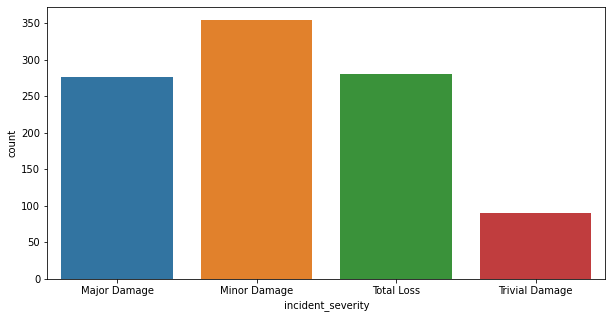

In [105]:
plt.figure(figsize=(10,5))
print(df['incident_severity'].value_counts())
sns.countplot(df['incident_severity'])

 Teh level of damage is Minor Damage.

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

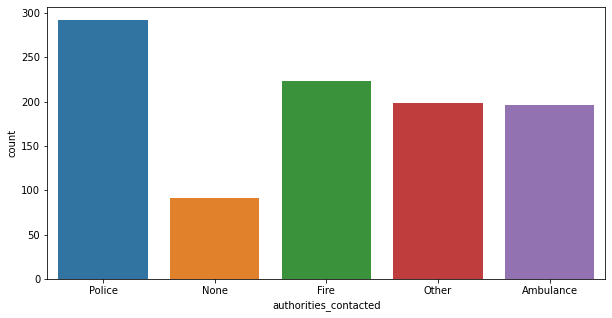

In [106]:
plt.figure(figsize=(10,5))
print(df['authorities_contacted'].value_counts())
sns.countplot(df['authorities_contacted'])

the government agencies that were contacted after damage'Policy'is higher than another.

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


<AxesSubplot:xlabel='incident_state', ylabel='count'>

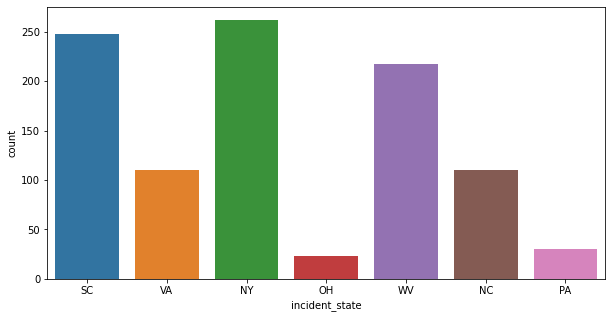

In [107]:
plt.figure(figsize=(10,5))
print(df['incident_state'].value_counts())
sns.countplot(df['incident_state'])

In this  column NY column is higher than another.

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


<AxesSubplot:xlabel='incident_city', ylabel='count'>

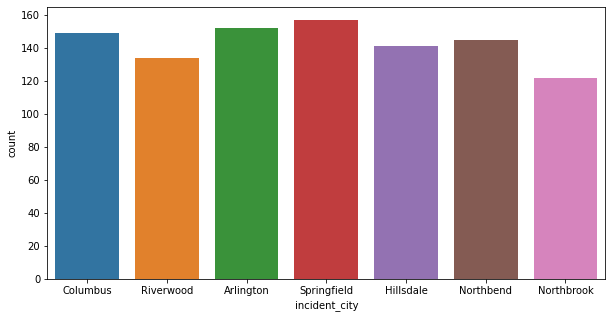

In [108]:
plt.figure(figsize=(10,5))
print(df['incident_city'].value_counts())
sns.countplot(df['incident_city'])

the 'Springfield' city at which the accident happened.

NO     338
YES    302
Name: property_damage, dtype: int64


<AxesSubplot:xlabel='property_damage', ylabel='count'>

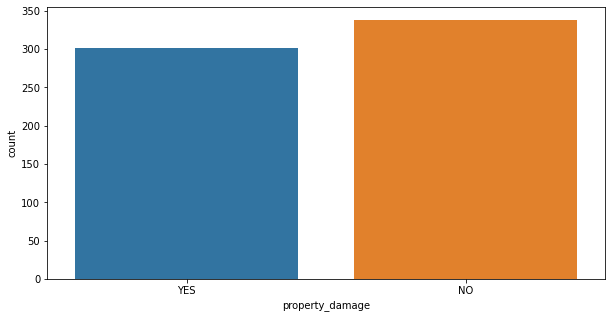

In [110]:
plt.figure(figsize=(10,5))
print(df['property_damage'].value_counts())
sns.countplot(df['property_damage'])

In Property Damage column 'No' column is higher than other column.

NO     343
YES    314
Name: police_report_available, dtype: int64


<AxesSubplot:xlabel='police_report_available', ylabel='count'>

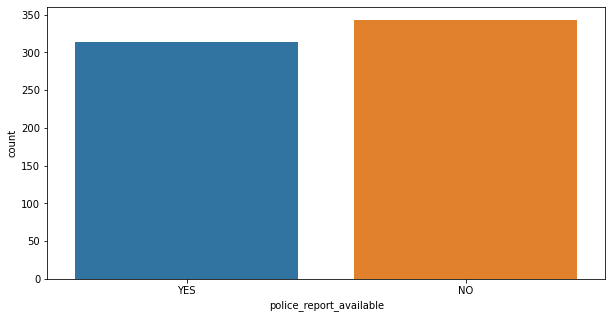

In [111]:
plt.figure(figsize=(10,5))
print(df['police_report_available'].value_counts())
sns.countplot(df['police_report_available'])

In olice_report_available column 'No' column is higher than another.

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


<AxesSubplot:xlabel='auto_make', ylabel='count'>

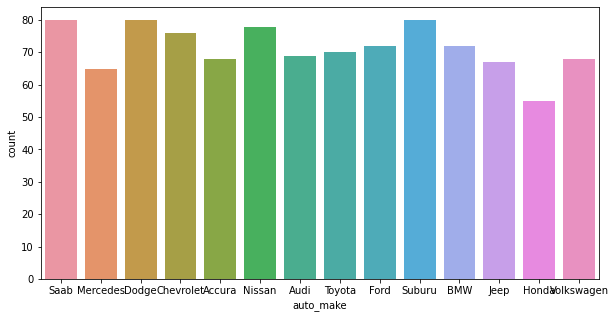

In [112]:
plt.figure(figsize=(10,5))
print(df['auto_make'].value_counts())
sns.countplot(df['auto_make'])

In auto- make column 'Saab' column is higher than another.

### For Numerical Values graph:

0.3621768477780205
-0.48542806739146993


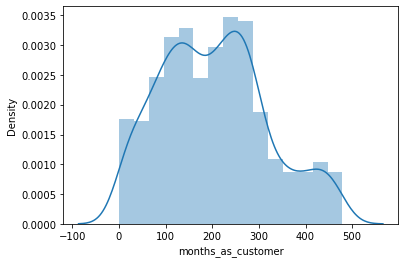

In [113]:
sns.distplot(df['months_as_customer'])
print(df['months_as_customer'].skew())

print(df['months_as_customer'].kurt())

<AxesSubplot:xlabel='months_as_customer'>

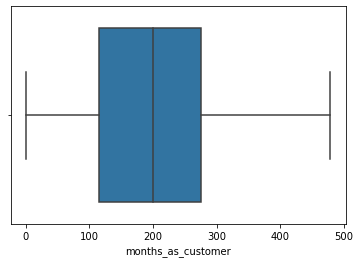

In [114]:
sns.boxplot(df['months_as_customer'])

This coulumn is looking Normall distributed and No Outliers.

0.47898804709224163
-0.26025501504003934


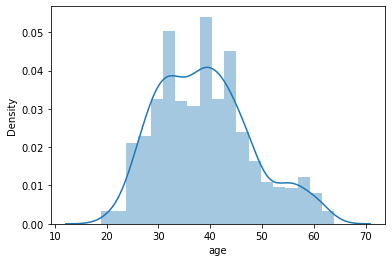

In [115]:
sns.distplot(df['age'])
print(df['age'].skew())

print(df['age'].kurt())

<AxesSubplot:xlabel='age'>

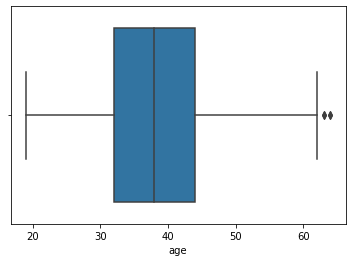

In [116]:
sns.boxplot(df['age'])

Age column is also normaly distributed but outliers are presents.

0.03899064217531216
-1.1326376885310006


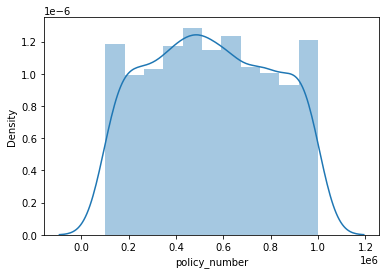

In [117]:
sns.distplot(df['policy_number'])
print(df['policy_number'].skew())

print(df['policy_number'].kurt())

<AxesSubplot:xlabel='policy_number'>

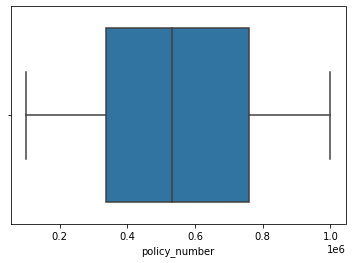

In [118]:
sns.boxplot(df['policy_number'])

The Policy_number column is also normaly distributed and no outliers are presents.

0.4778872137362794
-1.3769433405240865


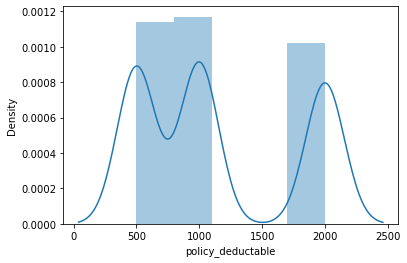

In [119]:
sns.distplot(df['policy_deductable'])
print(df['policy_deductable'].skew())

print(df['policy_deductable'].kurt())

<AxesSubplot:xlabel='policy_deductable'>

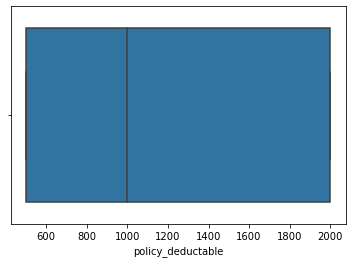

In [120]:
sns.boxplot(df['policy_deductable'])

In this column also have skewness and outliers.

0.004401994526610823
0.0738894402077599


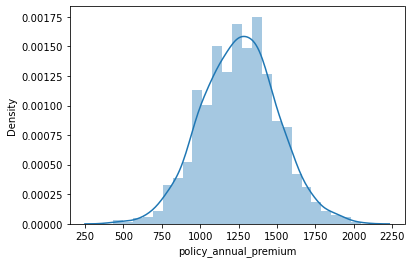

In [121]:
sns.distplot(df['policy_annual_premium'])
print(df['policy_annual_premium'].skew())

print(df['policy_annual_premium'].kurt())

<AxesSubplot:xlabel='policy_annual_premium'>

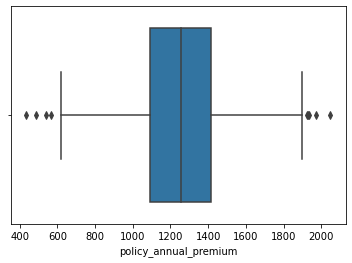

In [122]:
sns.boxplot(df['policy_annual_premium'])

In this column outliers are presents but this is normaly distributed.

1.806712198714504
1.792077309867199


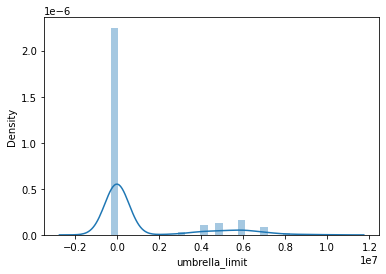

In [123]:
sns.distplot(df['umbrella_limit'])
print(df['umbrella_limit'].skew())

print(df['umbrella_limit'].kurt())

<AxesSubplot:xlabel='umbrella_limit'>

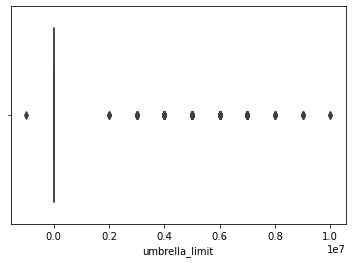

In [124]:
sns.boxplot(df['umbrella_limit'])

In umbrella_limit column ouliers are presents and also not normaly distributed.

0.8165539258839357
-1.1907110539463992


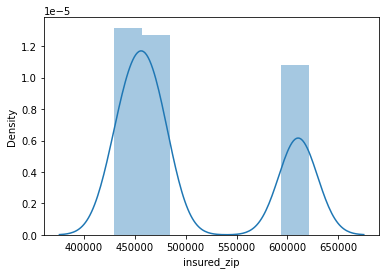

In [125]:
sns.distplot(df['insured_zip'])
print(df['insured_zip'].skew())

print(df['insured_zip'].kurt())

<AxesSubplot:xlabel='insured_zip'>

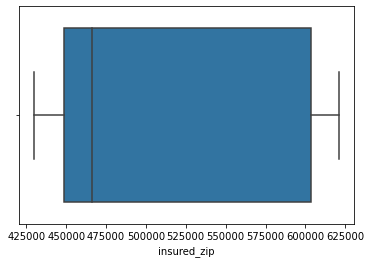

In [126]:
sns.boxplot(df['insured_zip'])

the insured_zip column is normally distributed and no outliers.

0.4788502295807907
-1.276703510816485


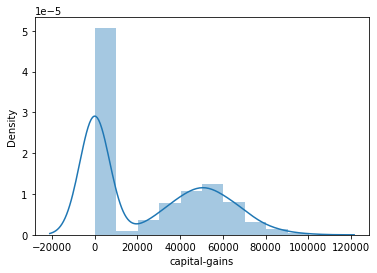

In [127]:
sns.distplot(df['capital-gains'])
print(df['capital-gains'].skew())

print(df['capital-gains'].kurt())

<AxesSubplot:xlabel='capital-gains'>

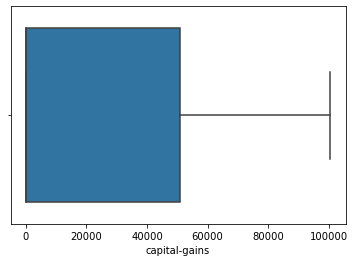

In [128]:
sns.boxplot(df['capital-gains'])

In thus column skweness is presents an no outliers.

-0.39147194299389343
-1.3138745001493803


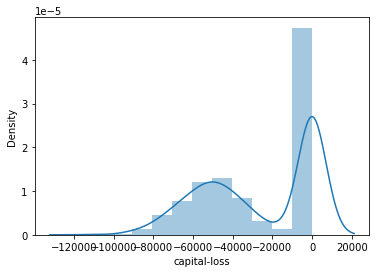

In [129]:
sns.distplot(df['capital-loss'])
print(df['capital-loss'].skew())

print(df['capital-loss'].kurt())

<AxesSubplot:xlabel='capital-loss'>

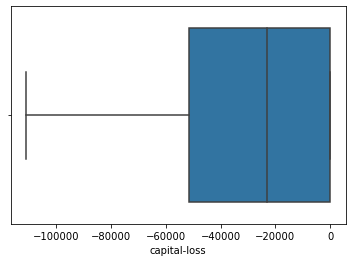

In [130]:
sns.boxplot(df['capital-loss'])

In this column skewness is presents and no outliers are presents.

-0.03558446643823673
-1.1929401516777658


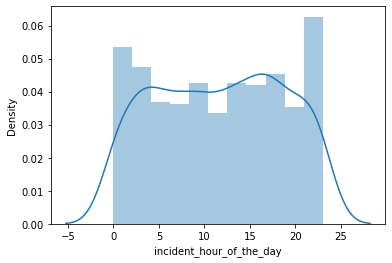

In [131]:
sns.distplot(df['incident_hour_of_the_day'])
print(df['incident_hour_of_the_day'].skew())

print(df['incident_hour_of_the_day'].kurt())

<AxesSubplot:xlabel='incident_hour_of_the_day'>

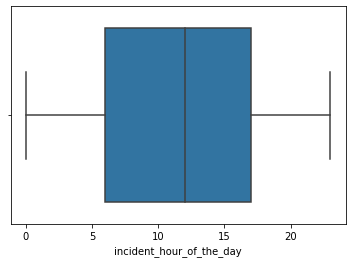

In [132]:
sns.boxplot(df['incident_hour_of_the_day'])

This column  is almost normaly distributed and  also no outliers are presrents.

0.502664087487584
-1.500466560896017


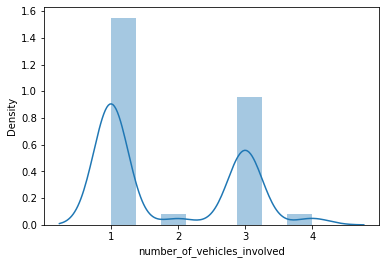

In [133]:
sns.distplot(df['number_of_vehicles_involved'])
print(df['number_of_vehicles_involved'].skew())

print(df['number_of_vehicles_involved'].kurt())

<AxesSubplot:xlabel='number_of_vehicles_involved'>

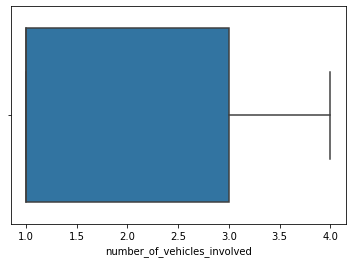

In [134]:
sns.boxplot(df['number_of_vehicles_involved'])

Thsi column is looking nomaly distributed and also no any outliers are present.

0.014777103511243209
-1.5131780655424822


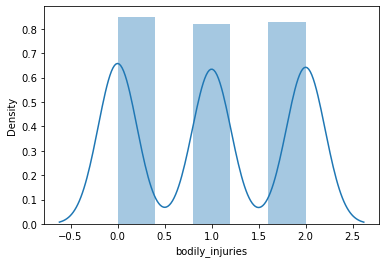

In [135]:
sns.distplot(df['bodily_injuries'])
print(df['bodily_injuries'].skew())

print(df['bodily_injuries'].kurt())

<AxesSubplot:xlabel='bodily_injuries'>

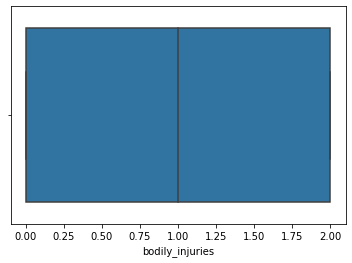

In [136]:
sns.boxplot(df['bodily_injuries'])

This column is normaly distributed and no outliers are prersents.

0.019636419856529662
-1.3436289692221157


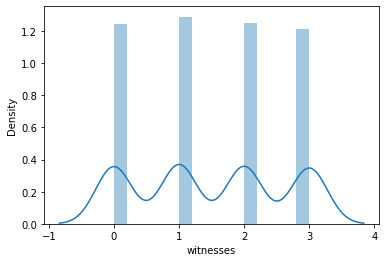

In [137]:
sns.distplot(df['witnesses'])
print(df['witnesses'].skew())

print(df['witnesses'].kurt())

<AxesSubplot:xlabel='witnesses'>

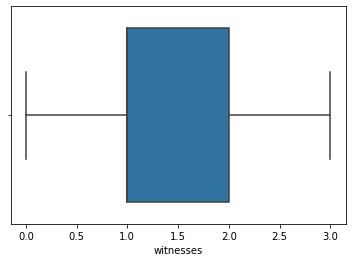

In [138]:
sns.boxplot(df['witnesses'])

In this column no ouliers are presrents.

-0.594581988510234
-0.45408142669809326


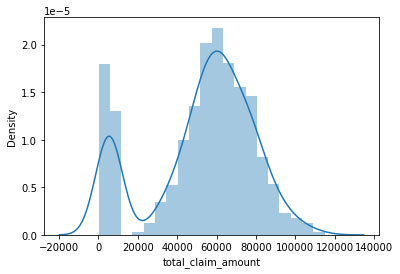

In [139]:
sns.distplot(df['total_claim_amount'])
print(df['total_claim_amount'].skew())

print(df['total_claim_amount'].kurt())

<AxesSubplot:xlabel='total_claim_amount'>

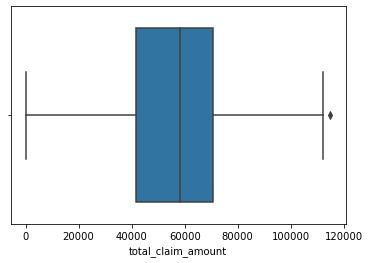

In [140]:
sns.boxplot(df['total_claim_amount'])

The total_claim_amount column  is normaly distributed and ouliers are presents.

0.26481087847181833
-0.7630870610902973


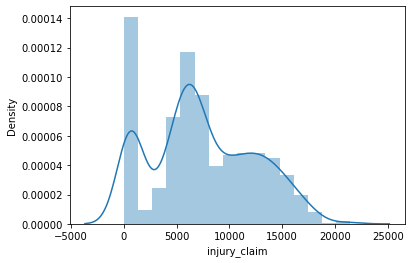

In [141]:
sns.distplot(df['injury_claim'])
print(df['injury_claim'].skew())

print(df['injury_claim'].kurt())

<AxesSubplot:xlabel='injury_claim'>

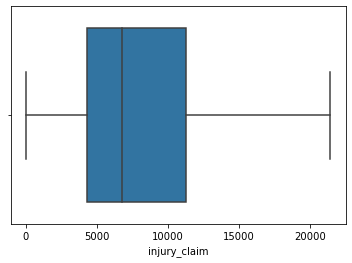

In [142]:
sns.boxplot(df['injury_claim'])

In thi column no ouliers and almost normaly distributed.

0.3781687764308289
-0.37638631173052817


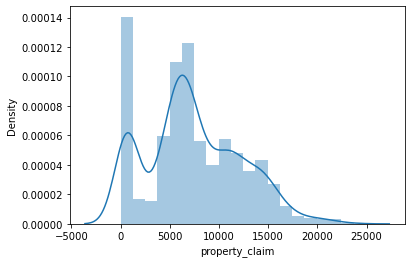

In [143]:
sns.distplot(df['property_claim'])
print(df['property_claim'].skew())

print(df['property_claim'].kurt())

<AxesSubplot:xlabel='property_claim'>

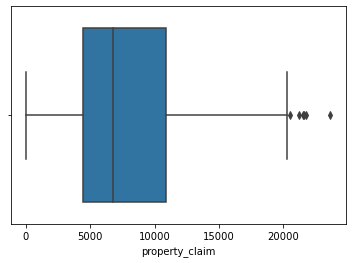

In [144]:
sns.boxplot(df['property_claim'])

this column is also almost normaly distributed and ouliers are presents.

-0.04828880711387396
-1.1718677555927974


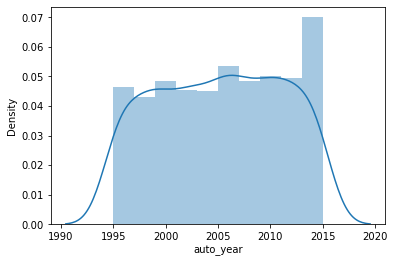

In [145]:
sns.distplot(df['auto_year'])
print(df['auto_year'].skew())

print(df['auto_year'].kurt())

<AxesSubplot:xlabel='auto_year'>

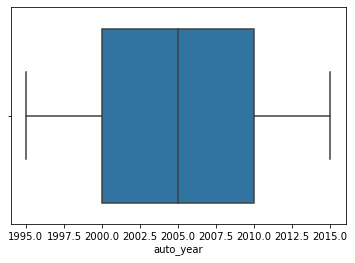

In [146]:
sns.boxplot(df['auto_year'])

This column have no skeness and no outliers.

In [147]:
#checking unique values:
unique = df.nunique().to_frame()
unique.columns = ['Count']

In [148]:
unique.sort_values(by='Count',ascending=False)

,Count
policy_number,1000
incident_location,1000
insured_zip,995
policy_annual_premium,991
policy_bind_date,951
total_claim_amount,763
vehicle_claim,726
injury_claim,638
property_claim,626
months_as_customer,391


In [149]:
#lets drop unnecessory columns:
to_drop = ['policy_number','policy_bind_date','policy_state','_c39','insured_zip','incident_location','incident_date','incident_state','incident_city','insured_hobbies','auto_make','auto_model','auto_year']

df.drop(to_drop,inplace = True,axis=1)

In [150]:
df.head()

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,48,250/500,1000,1406.91,0,MALE,MD,craft-repair,husband,...,1,YES,1,2,YES,71610,6510,13020,52080,Y
1,228,42,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,other-relative,...,1,NaN,0,0,NaN,5070,780,780,3510,Y
2,134,29,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,own-child,...,3,NO,2,3,NO,34650,7700,3850,23100,N
3,256,41,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,unmarried,...,1,NaN,1,2,NO,63400,6340,6340,50720,Y
4,228,44,500/1000,1000,1583.91,6000000,MALE,Associate,sales,unmarried,...,1,NO,0,1,NO,6500,1300,650,4550,N


### Handel Outliers:

In [151]:
# handling outlies :
from scipy import stats

from scipy.stats import zscore
z_score = zscore(df[['age','policy_annual_premium','umbrella_limit','total_claim_amount','property_claim']])
abs_z_score = np.abs(z_score)
filtering_entry = (abs_z_score < 3).all(axis=1)
df = df[filtering_entry]
df.reset_index(inplace = True)

### Let's handel Skewness:

In [152]:
df['umbrella_limit'] = np.sqrt(df['umbrella_limit'])
df['capital-gains'] = np.sqrt(df['capital-gains'])
df['property_claim'] = np.sqrt(df['property_claim'])
df['total_claim_amount'] = np.sqrt(df['total_claim_amount'])
df['policy_annual_premium'] = np.sqrt(df['policy_annual_premium'])
df['age'] = np.sqrt(df['age'])

### Seprate the our target variable:

In [153]:
x = df.drop('fraud_reported',axis=1)
y = df['fraud_reported']

### Let's convert categorical column in to numerical columns:

In [154]:
categorical_cols = x.select_dtypes(include=['object'])
categorical_cols = pd.get_dummies(categorical_cols,drop_first=True)

In [156]:
numerical_col=x.select_dtypes(include=['int64'])
x = pd.concat([numerical_col,categorical_cols],axis=1)

In [157]:
x.head()

,index,months_as_customer,policy_deductable,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,vehicle_claim,...,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,property_damage_YES,police_report_available_YES
0,0,328,1000,0,5,1,1,2,6510,52080,...,1,0,0,0,0,0,0,1,1,1
1,1,228,2000,0,8,1,0,0,780,3510,...,0,1,0,0,0,0,0,1,0,0
2,2,134,2000,0,7,3,2,3,7700,23100,...,0,1,0,0,0,0,0,1,0,0
3,3,256,2000,-62400,5,1,1,2,6340,50720,...,0,0,0,0,0,0,0,1,0,0
4,4,228,1000,-46000,20,1,0,1,1300,4550,...,0,1,0,0,0,1,0,0,0,0


### Lets check the coorelation:

<AxesSubplot:>

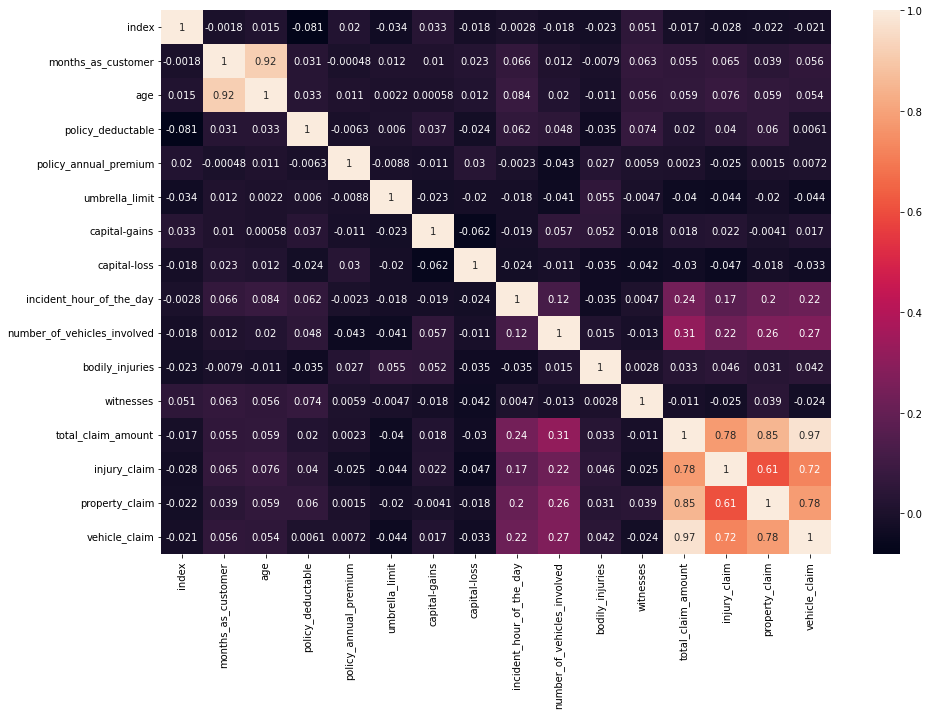

In [158]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot = True)

In [159]:
# lets drop the columns for removing the multicilenearity
df.drop(['age','total_claim_amount'],inplace=True,axis=1)

### StandardScaler:

In [161]:
# using this methd for biasness
Scaler =StandardScaler()
x = pd.DataFrame(Scaler.fit_transform(x),columns = x.columns)
x

,index,months_as_customer,policy_deductable,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,vehicle_claim,...,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,property_damage_YES,police_report_available_YES
0,-1.737057,1.070264,-0.225968,0.954570,-0.958407,-0.821125,0.001248,0.464781,-0.188645,0.753457,...,1.622755,-0.739810,-0.624114,-0.313918,-0.539249,-0.315873,-0.491703,1.555030,1.513918,1.474706
1,-1.733589,0.202991,1.410009,0.954570,-0.527848,-0.821125,-1.222563,-1.333838,-1.362026,-1.825887,...,-0.616236,1.351699,-0.624114,-0.313918,-0.539249,-0.315873,-0.491703,1.555030,-0.660538,-0.678101
2,-1.730120,-0.612245,1.410009,0.954570,-0.671368,1.143567,1.225058,1.364090,0.055042,-0.785546,...,-0.616236,1.351699,-0.624114,-0.313918,-0.539249,-0.315873,-0.491703,1.555030,-0.660538,-0.678101
3,-1.726651,0.445828,1.410009,-1.269796,-0.958407,-0.821125,0.001248,0.464781,-0.223457,0.681233,...,-0.616236,-0.739810,-0.624114,-0.313918,-0.539249,-0.315873,-0.491703,1.555030,-0.660538,-0.678101
4,-1.723183,0.202991,-0.225968,-0.685187,1.194388,-0.821125,-1.222563,-0.434529,-1.255541,-1.770657,...,-0.616236,1.351699,-0.624114,-0.313918,-0.539249,3.165829,-0.491703,-0.643074,-0.660538,-0.678101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
976,1.714318,-1.748372,-0.225968,0.954570,1.194388,-0.821125,-1.222563,-0.434529,2.049585,1.229284,...,-0.616236,1.351699,-0.624114,-0.313918,1.854431,-0.315873,-0.491703,-0.643074,1.513918,-0.678101
977,1.717787,0.697337,-0.225968,0.954570,1.624947,-0.821125,1.225058,1.364090,2.180643,1.828316,...,-0.616236,-0.739810,-0.624114,-0.313918,1.854431,-0.315873,-0.491703,-0.643074,1.513918,-0.678101
978,1.721255,-0.646936,-1.043957,0.954570,-1.101927,1.143567,1.225058,1.364090,0.014086,0.775761,...,1.622755,1.351699,-0.624114,-0.313918,-0.539249,-0.315873,-0.491703,1.555030,-0.660538,1.474706
979,1.724724,2.197719,1.410009,0.954570,-1.388966,-0.821125,-1.222563,-0.434529,-0.452809,-0.071806,...,-0.616236,-0.739810,-0.624114,-0.313918,-0.539249,-0.315873,2.033747,-0.643074,-0.660538,1.474706


In [163]:
# lets counts value of y
y.value_counts()

N    741
Y    240
Name: fraud_reported, dtype: int64

In [164]:
#oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [165]:
# lets check the counts:
y.value_counts()

Y    741
N    741
Name: fraud_reported, dtype: int64

### Testing-Spliting:

In [166]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25, random_state =42)

In [167]:
from sklearn.metrics  import confusion_matrix,classification_report,accuracy_score

In [168]:
def metric_score(clf, x_train,x_test,y_train,y_test,train = True):
    if train:
        y_pred = clf.predict(x_train)
        
        print("\n==========Train Result=========")
        
        print(f"Accuracy Score: {accuracy_score(y_train,y_pred)*100: .2f}%")
        
    
    elif train==False:
        pred = clf.predict(x_test)
        
        print("\n=========Train Result========")
        
        print(f"Accuracy Score: {accuracy_score(y_test, pred)*100: .2f}%")
        
        print('\n \n Test Cassification Report \n',classification_report(y_test,pred,digits=2))

### Training-Model:

In [169]:
#for DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

In [170]:
Dec = DecisionTreeClassifier()
Dec.fit(x_train,y_train)

DecisionTreeClassifier()

In [171]:
metric_score(Dec,x_train,x_test,y_train,y_test,train=True)

metric_score(Dec,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  100.00%

=========Train Result========
Accuracy Score:  79.25%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           N       0.78      0.78      0.78       174
           Y       0.81      0.80      0.80       197

    accuracy                           0.79       371
   macro avg       0.79      0.79      0.79       371
weighted avg       0.79      0.79      0.79       371



In [172]:
# for AdaBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [173]:
Adb = AdaBoostClassifier()
Adb.fit(x_train,y_train)

AdaBoostClassifier()

In [174]:
metric_score(Adb,x_train,x_test,y_train,y_test,train=True)
metric_score(Adb,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  88.84%

=========Train Result========
Accuracy Score:  82.48%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           N       0.81      0.82      0.81       174
           Y       0.84      0.83      0.83       197

    accuracy                           0.82       371
   macro avg       0.82      0.82      0.82       371
weighted avg       0.82      0.82      0.82       371



In [175]:
# for GradientbosstingClaasifier
from sklearn.ensemble import GradientBoostingClassifier

In [176]:
Grb =GradientBoostingClassifier ()
Grb.fit(x_train,y_train)

GradientBoostingClassifier()

In [177]:
metric_score(Grb,x_train,x_test,y_train,y_test,train=True)
metric_score(Grb,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  93.52%

=========Train Result========
Accuracy Score:  86.25%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           N       0.84      0.87      0.86       174
           Y       0.88      0.86      0.87       197

    accuracy                           0.86       371
   macro avg       0.86      0.86      0.86       371
weighted avg       0.86      0.86      0.86       371



In [180]:
from sklearn.ensemble import RandomForestClassifier

In [182]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

RandomForestClassifier()

In [183]:
metric_score(RFC,x_train,x_test,y_train,y_test,train=True)
metric_score(RFC,x_train,x_test,y_train,y_test,train=False)


==========Train Result=========
Accuracy Score:  100.00%

=========Train Result========
Accuracy Score:  84.64%

 
 Test Cassification Report 
               precision    recall  f1-score   support

           N       0.80      0.89      0.84       174
           Y       0.89      0.81      0.85       197

    accuracy                           0.85       371
   macro avg       0.85      0.85      0.85       371
weighted avg       0.85      0.85      0.85       371



### Cross-val-Score:

In [184]:
from sklearn.model_selection import cross_val_score

In [185]:
#checkig cv score for RanndomForestClassifier
score = cross_val_score(RFC,x,y)
print(score)
print(score.mean())

[0.7003367  0.7037037  0.91891892 0.93918919 0.59459459]
0.7713486213486214


In [186]:
#checkig cv score for DecisionTreeClassifier
score = cross_val_score(Dec,x,y)
print(score)
print(score.mean())

[0.56565657 0.38047138 0.85810811 0.77027027 0.55405405]
0.6257120757120757


In [187]:
# checking cv score for AdaBoostClassifier
score = cross_val_score(Adb,x,y)
print(score)
print(score.mean())

[0.22222222 0.30976431 0.71959459 0.67905405 0.48986486]
0.4841000091000091


In [188]:
# checking cv score for GradientBoostingClassifier
score = cross_val_score(Grb,x,y)
print(score)
print(score.mean())

[0.56565657 0.26262626 0.76351351 0.60810811 0.50675676]
0.5413322413322413


### HyperParametes:

In [189]:
#  RandomForestClassifier:
from sklearn.model_selection import RandomizedSearchCV

parameters = {'max_depth':[2,8,],
              'max_features':[0.2,0.6,1.0],
              'n_estimators':[20,60,100,120],
              'max_samples':[0.5,0.75,1.0],
              'criterion':['gini','entropy'],
              'bootstrap':[True,False]}

In [190]:
RFC=  RandomizedSearchCV(RandomForestClassifier(),parameters,cv= 5)

In [191]:
RFC.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 8],
                                        'max_features': [0.2, 0.6, 1.0],
                                        'max_samples': [0.5, 0.75, 1.0],
                                        'n_estimators': [20, 60, 100, 120]})

In [192]:
RFC.best_params_

{'n_estimators': 100,
 'max_samples': 1.0,
 'max_features': 1.0,
 'max_depth': 8,
 'criterion': 'entropy',
 'bootstrap': True}

In [193]:
Final_model = RandomForestClassifier(n_estimators = 100, max_features= 1.0,max_depth= 8,criterion= 'entropy',bootstrap = 'True',max_samples=1.0)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

87.06199460916442


### Saving Model:

In [194]:
# we use joblib methode for save the model
import joblib
joblib.dump(Final_model,"Insurance Claim Fraud Detection")

['Insurance Claim Fraud Detection']

In [195]:
# load the saved model
model = joblib.load("Insurance Claim Fraud Detection")

#pediction
prediction = model.predict(x_test)
prediction

array(['Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'N', 'N', 'Y', 'N', 'N',
       'N', 'Y', 'Y', 'N', 'N', 'N', 'N', 'N', 'Y', 'Y', 'N', 'Y', 'Y',
       'N', 'N', 'N', 'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'N', 'Y',
       'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'N', 'Y', 'N', 'Y',
       'N', 'N', 'Y', 'N', 'N', 'Y', 'N', 'N', 'N', 'N', 'N', 'Y', 'N',
       'N', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'N', 'N', 'Y',
       'N', 'Y', 'Y', 'N', 'Y', 'N', 'N', 'N', 'Y', 'N', 'N', 'Y', 'Y',
       'N', 'Y', 'Y', 'N', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'N',
       'Y', 'N', 'Y', 'N', 'N', 'N', 'N', 'Y', 'N', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'N', 'Y', 'Y', 'N', 'N', 'N', 'Y', 'Y', 'Y',
       'Y', 'N', 'Y', 'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'N', 'N', 'N',
       'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'N', 'N', 'Y', 'Y', 'Y', 'N',
       'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N

These are Prediction:

# 4)Zomato Restaurant:

### Import the liberarories:

In [7]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

### https://github.com/dsrscientist/dataset4/blob/main/Country-Code.xlsx

### https://github.com/dsrscientist/dataset4/blob/main/zomato.csv

In [6]:
df1 = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset4/main/zomato.csv',encoding = 'latin1')

In [5]:
df2 = pd.read_excel(r'C:\Users\ADMIN\Downloads\Country-Code.xlsx')

### Let's connect both datasets by merge method:

In [18]:
# merge the both data sets:
df = pd.merge (df1,df2) 

In [19]:
#checking first 5 rows of conected both data sets:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


In [20]:
# checking the all column:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [21]:
# checking the rows and columns:
df.shape

(9551, 22)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [23]:
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
Country                  object
dtype: object

In [24]:
# is there is any null values:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

Yes there is null value in Cuisines column.

In [25]:
# lets handel the missing values:
df = df.fillna(0)

In [26]:
# checking again the null values.
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

Now there is no null value.

In [27]:
# cheking duplicate values:
df.duplicated().sum()

0

There is no any duplicate values:

In [28]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


### Visualization:

No     7100
Yes    2451
Name: Has Online delivery, dtype: int64


<AxesSubplot:xlabel='Has Online delivery', ylabel='count'>

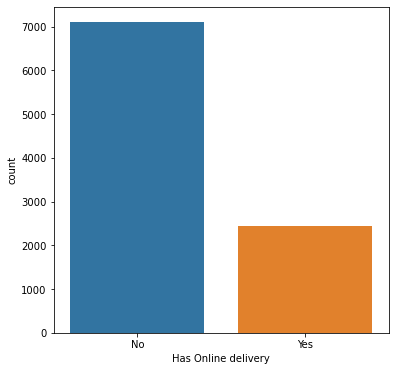

In [106]:
#checking online delivery column:
plt.figure(figsize=(6,6))
print(df['Has Online delivery'].value_counts())
sns.countplot(df['Has Online delivery'])

<AxesSubplot:xlabel='Has Online delivery', ylabel='Price range'>

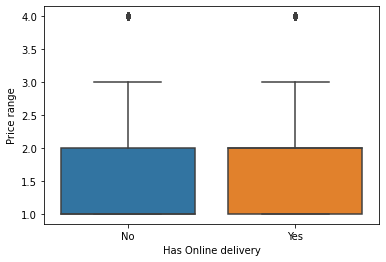

In [107]:
sns.boxplot(data=df,x = 'Has Online delivery',y = 'Price range')

.In Has Online delivery column the 'No'column is higher than Yes.and Outliers are also presents.

No     8393
Yes    1158
Name: Has Table booking, dtype: int64


<AxesSubplot:xlabel='Has Table booking', ylabel='count'>

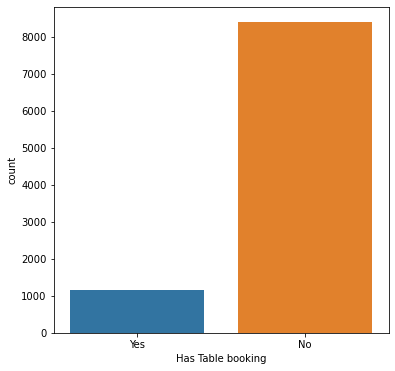

In [108]:
# checking table booking column:
plt.figure(figsize=(6,6))
print(df['Has Table booking'].value_counts())
sns.countplot(df['Has Table booking'])

<AxesSubplot:xlabel='Has Table booking', ylabel='Price range'>

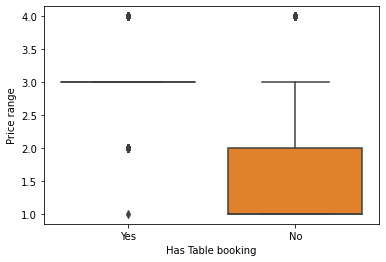

In [109]:
sns.boxplot(data=df,x = 'Has Table booking',y = 'Price range')

In has Table booking column Otliers are presents and the value of'NO'column is higher than Yes.

No     9517
Yes      34
Name: Is delivering now, dtype: int64


<AxesSubplot:xlabel='Is delivering now', ylabel='count'>

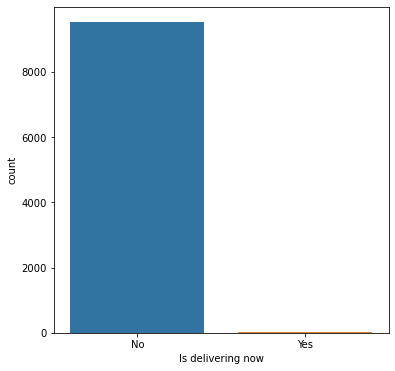

In [110]:
#checking Delivery now column:
plt.figure(figsize=(6,6))
print(df['Is delivering now'].value_counts())
sns.countplot(df['Is delivering now'])

<AxesSubplot:xlabel='Is delivering now', ylabel='Price range'>

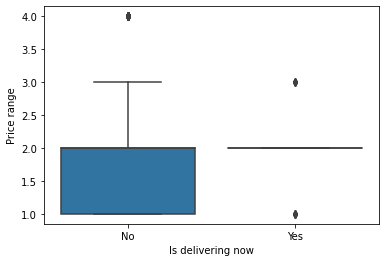

In [111]:
sns.boxplot(data=df,x = 'Is delivering now',y = 'Price range')

Here we can also see the the 'No'column have highest value than yes and ouliers also pesents.

Orange        3737
White         2148
Yellow        2100
Green         1079
Dark Green     301
Red            186
Name: Rating color, dtype: int64


<AxesSubplot:xlabel='Rating color', ylabel='count'>

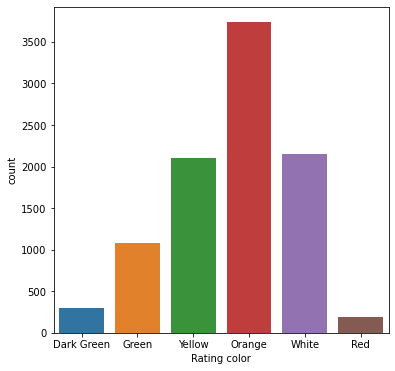

In [112]:
# checking RRating color:
plt.figure(figsize=(6,6))
print(df['Rating color'].value_counts())
sns.countplot(df['Rating color'])

<AxesSubplot:xlabel='Rating color', ylabel='Price range'>

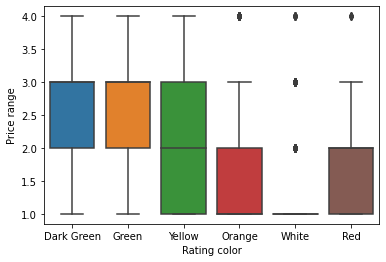

In [113]:
sns.boxplot(data=df,x = 'Rating color',y = 'Price range')

 In Rating column the value of Orange color is highest than another columns. and ouliers ae also presents in this columns.

Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: Rating text, dtype: int64


<AxesSubplot:xlabel='Rating text', ylabel='count'>

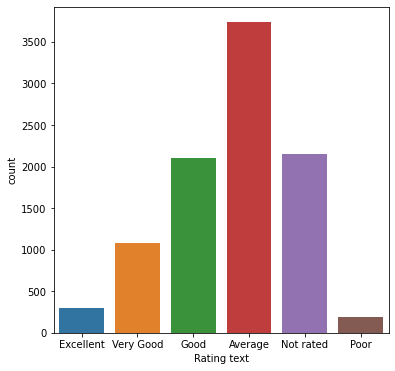

In [114]:
# checking Rating text column:
plt.figure(figsize=(6,6))
print(df['Rating text'].value_counts())
sns.countplot(df['Rating text'])

<AxesSubplot:xlabel='Rating text', ylabel='Price range'>

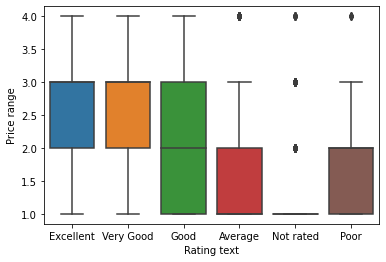

In [115]:
sns.boxplot(data=df,x = 'Rating text',y = 'Price range')

In Rating text column the value Average column is  higher than othes an oulies are also presents in this columns.

India             8652
United States      434
United Kingdom      80
Brazil              60
UAE                 60
South Africa        60
New Zealand         40
Turkey              34
Australia           24
Phillipines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: Country, dtype: int64


<AxesSubplot:xlabel='Country', ylabel='count'>

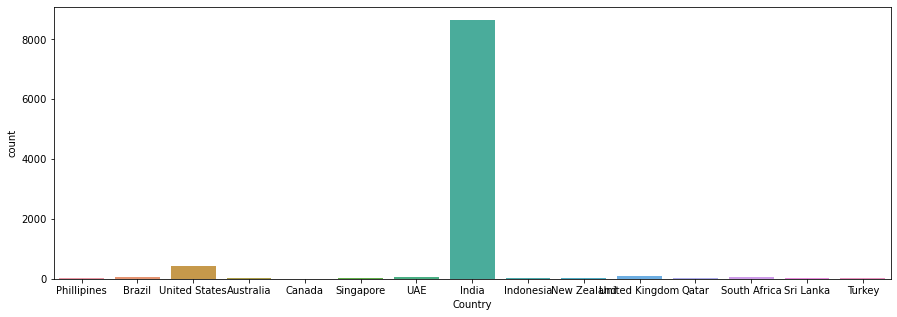

In [116]:
# checking Country column:
plt.figure(figsize=(15,5))
print(df['Country'].value_counts())
sns.countplot(df['Country'])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Phillipines'),
  Text(1, 0, 'Brazil'),
  Text(2, 0, 'United States'),
  Text(3, 0, 'Australia'),
  Text(4, 0, 'Canada'),
  Text(5, 0, 'Singapore'),
  Text(6, 0, 'UAE'),
  Text(7, 0, 'India'),
  Text(8, 0, 'Indonesia'),
  Text(9, 0, 'New Zealand'),
  Text(10, 0, 'United Kingdom'),
  Text(11, 0, 'Qatar'),
  Text(12, 0, 'South Africa'),
  Text(13, 0, 'Sri Lanka'),
  Text(14, 0, 'Turkey')])

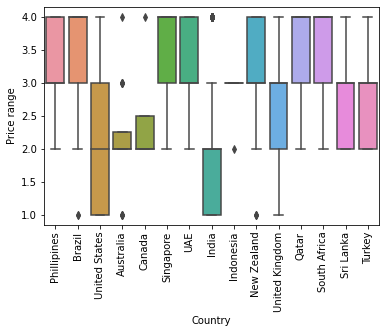

In [117]:
sns.boxplot(data=df,x = 'Country',y = 'Price range')
plt.xticks(rotation=90)

In this column the India column have high value than other columns.Otliers are also presents.

Indian Rupees(Rs.)        8652
Dollar($)                  482
Pounds(£)                  80
Brazilian Real(R$)          60
Emirati Diram(AED)          60
Rand(R)                     60
NewZealand($)               40
Turkish Lira(TL)            34
Botswana Pula(P)            22
Indonesian Rupiah(IDR)      21
Qatari Rial(QR)             20
Sri Lankan Rupee(LKR)       20
Name: Currency, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Botswana Pula(P)'),
  Text(1, 0, 'Brazilian Real(R$)'),
  Text(2, 0, 'Dollar($)'),
  Text(3, 0, 'Emirati Diram(AED)'),
  Text(4, 0, 'Indian Rupees(Rs.)'),
  Text(5, 0, 'Indonesian Rupiah(IDR)'),
  Text(6, 0, 'NewZealand($)'),
  Text(7, 0, 'Pounds(\x8c£)'),
  Text(8, 0, 'Qatari Rial(QR)'),
  Text(9, 0, 'Rand(R)'),
  Text(10, 0, 'Sri Lankan Rupee(LKR)'),
  Text(11, 0, 'Turkish Lira(TL)')])

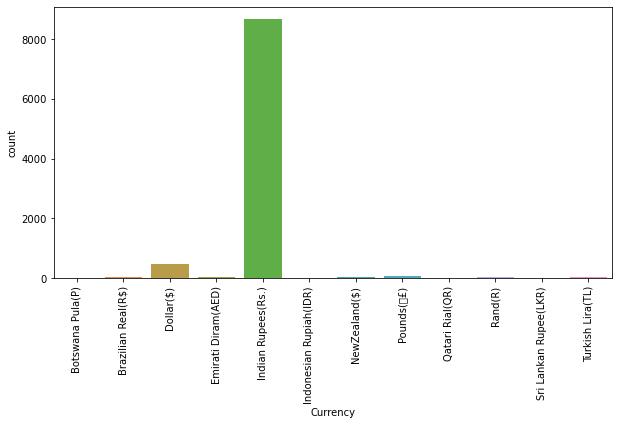

In [118]:
# checking Currency column
plt.figure(figsize=(10,5))
print(df['Currency'].value_counts())
sns.countplot(df['Currency'])
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Botswana Pula(P)'),
  Text(1, 0, 'Brazilian Real(R$)'),
  Text(2, 0, 'Dollar($)'),
  Text(3, 0, 'Emirati Diram(AED)'),
  Text(4, 0, 'Indian Rupees(Rs.)'),
  Text(5, 0, 'Indonesian Rupiah(IDR)'),
  Text(6, 0, 'NewZealand($)'),
  Text(7, 0, 'Pounds(\x8c£)'),
  Text(8, 0, 'Qatari Rial(QR)'),
  Text(9, 0, 'Rand(R)'),
  Text(10, 0, 'Sri Lankan Rupee(LKR)'),
  Text(11, 0, 'Turkish Lira(TL)')])

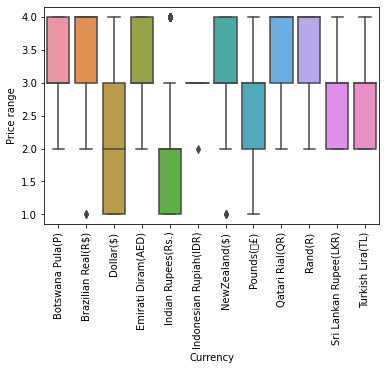

In [119]:
sns.boxplot(data=df,x = 'Currency',y = 'Price range')
plt.xticks(rotation=90)

In Currency column the India have highest currecy value than anothers. and oulires are also presents.

Connaught Place                                122
Rajouri Garden                                  99
Shahdara                                        87
Defence Colony                                  86
Pitampura                                       85
                                              ... 
Lemon Tree Premier, Sector 29                    1
Omaxe Celebration Mall, Sohna Road, Gurgaon      1
Park Inn, Sector 15, Gurgaon                     1
Plaza Mall, MG Road                              1
Moda                                             1
Name: Locality, Length: 1208, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Century City Mall, Poblacion, Makati City'),
  Text(1, 0, 'Little Tokyo, Legaspi Village, Makati City'),
  Text(2, 0, 'Edsa Shangri-La, Ortigas, Mandaluyong City'),
  Text(3, 0, 'SM Megamall, Ortigas, Mandaluyong City'),
  Text(4, 0, 'SM by the Bay, Mall of Asia Complex, Pasay City'),
  Text(5, 0, 'Sofitel Philippine Plaza Manila, Pasay City'),
  Text(6, 0, 'Kapitolyo'),
  Text(7, 0, 'UP Town Center, Diliman, Quezon City'),
  Text(8, 0, 'Addition Hills'),
  Text(9, 0, 'Little Baguio'),
  Text(10, 0, 'Nuvali, Don Jose, Santa Rosa'),
  Text(11, 0, 'Solenad 3, Don Jose, Santa Rosa'),
  Text(12, 0, 'Tagaytay City'),
  Text(13, 0, 'BGC Stopover Pavillion, Bonifacio Global City'),
  Text(14, 0, 'Bonifacio Global City')])

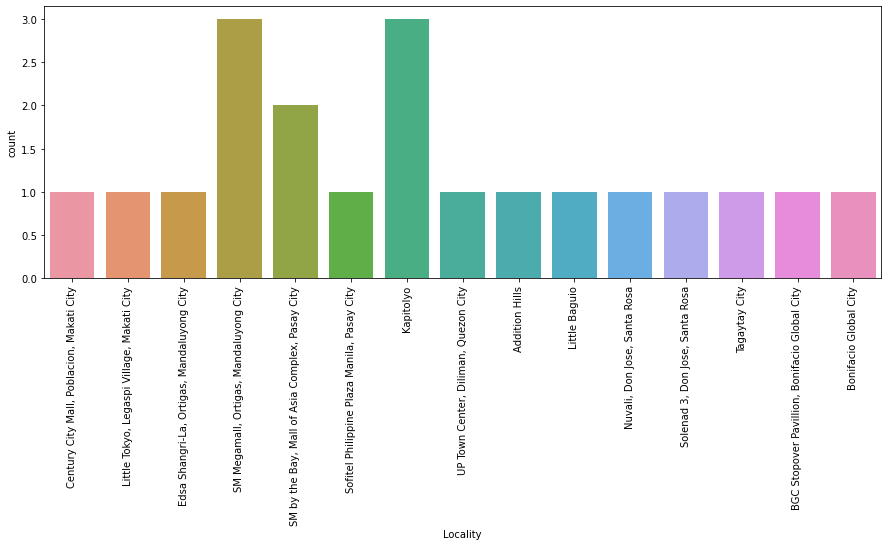

In [120]:
# checking Locality column:
plt.figure(figsize=(15,5))
print(df['Locality'].value_counts())
sns.countplot(df['Locality'].head(20))
plt.xticks(rotation=90)

In this column the Connaught Place have highest value.

New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
                ... 
Huskisson          1
Panchkula          1
Forrest            1
Flaxton            1
Chatham-Kent       1
Name: City, Length: 141, dtype: int64


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Makati City'),
  Text(1, 0, 'Mandaluyong City'),
  Text(2, 0, 'Pasay City'),
  Text(3, 0, 'Pasig City'),
  Text(4, 0, 'Quezon City'),
  Text(5, 0, 'San Juan City'),
  Text(6, 0, 'Santa Rosa'),
  Text(7, 0, 'Tagaytay City'),
  Text(8, 0, 'Taguig City')])

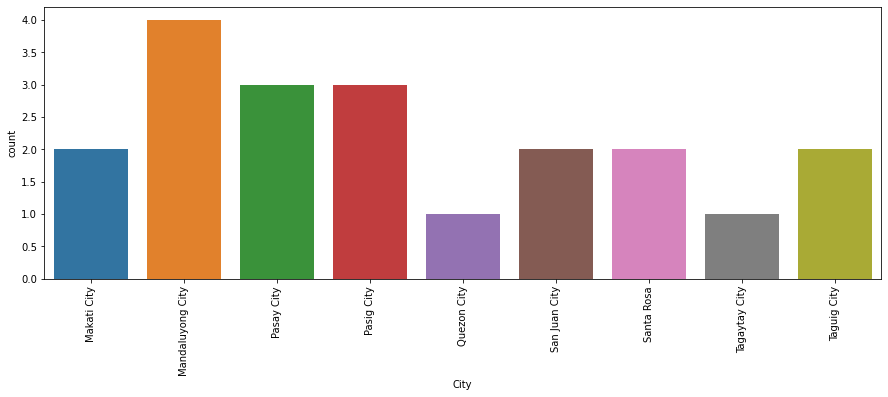

In [121]:
# checking City column:
plt.figure(figsize=(15,5))
print(df['City'].value_counts())
sns.countplot(df['City'].head(20))
plt.xticks(rotation=90)

In city column 'New Delhi'have highest value than others.

Sector 41, Noida                                                                         11
Dilli Haat, INA, New Delhi                                                               11
Greater Kailash (GK) 1, New Delhi                                                        10
The Imperial, Janpath, New Delhi                                                          9
Palate of Delhi, Dhaula Kuan Metro Station, Chanakyapuri, New Delhi                       8
                                                                                         ..
23-24, Defence Colony Market, Defence Colony, New Delhi                                   1
28, Main Market, Defence Colony, New Delhi                                                1
Daryaganj, New Delhi                                                                      1
Ground Floor, E-23, Netaji Subhash Marg, Opposite Golcha Cinema, Daryaganj, New Delhi     1
CafeaÛôa Mahallesi, BademaltÛ± Sokak, No 21/B, KadÛ±kí_y, ÛÁstanbul             

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'Third Floor, Century City Mall, Kalayaan Avenue, Poblacion, Makati City'),
  Text(1, 0, 'Little Tokyo, 2277 Chino Roces Avenue, Legaspi Village, Makati City'),
  Text(2, 0, 'Edsa Shangri-La, 1 Garden Way, Ortigas, Mandaluyong City'),
  Text(3, 0, 'Third Floor, Mega Fashion Hall, SM Megamall, Ortigas, Mandaluyong City'),
  Text(4, 0, 'Third Floor, Mega Atrium, SM Megamall, Ortigas, Mandaluyong City'),
  Text(5, 0, 'Ground Floor, Mega Fashion Hall, SM Megamall, Ortigas, Mandaluyong City'),
  Text(6, 0, 'Building K, SM By The Bay, Sunset Boulevard, Mall of Asia Complex (MOA), Pasay City'),
  Text(7, 0, 'Building B, By The Bay, Seaside Boulevard, Mall of Asia Complex (MOA), Pasay City'),
  Text(8, 0, 'Plaza Level, Sofitel Philippine Plaza Manila, CCP Complex, Pasay City'),
  Text(9, 0, 'Brixton Technology Center, 10 Brixton Street, Kapitolyo, Pasig City'),
  Text(10, 0, '75 East 

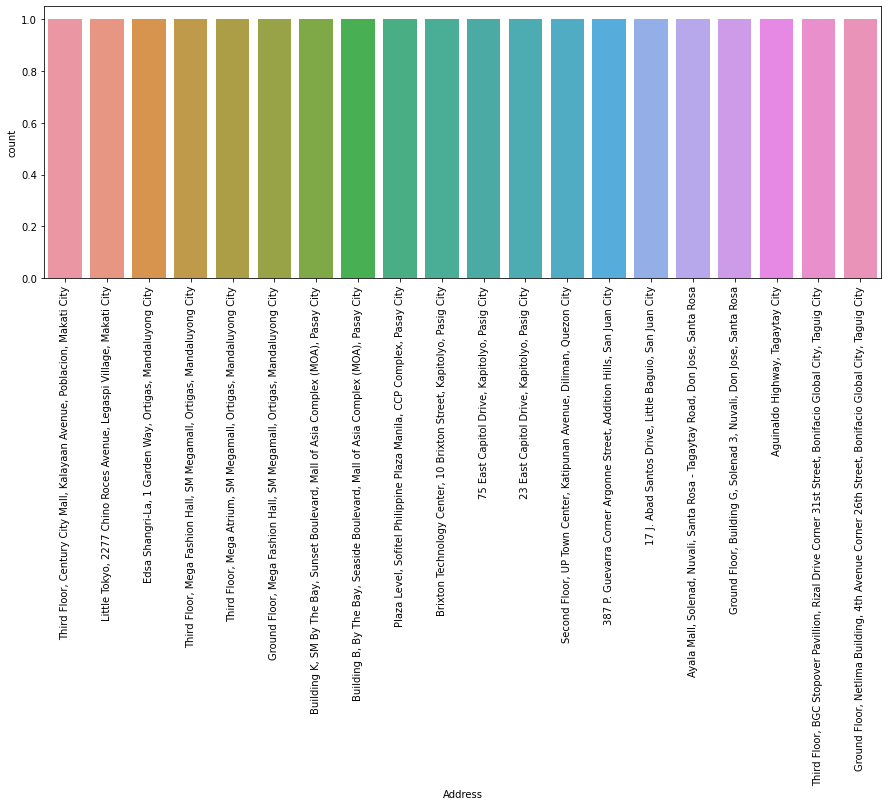

In [122]:
# checking Address column:
plt.figure(figsize=(15,5))
print(df['Address'].value_counts())
sns.countplot(df['Address'].head(20))
plt.xticks(rotation=90)

In this column the 'Sector 41 Nodida' have highest value than another addesses.

North Indian                                             936
North Indian, Chinese                                    511
Fast Food                                                354
Chinese                                                  354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: Cuisines, Length: 1826, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'French, Japanese, Desserts'),
  Text(1, 0, 'Japanese'),
  Text(2, 0, 'Seafood, Asian, Filipino, Indian'),
  Text(3, 0, 'Japanese, Sushi'),
  Text(4, 0, 'Japanese, Korean'),
  Text(5, 0, 'Chinese'),
  Text(6, 0, 'Asian, European'),
  Text(7, 0, 'Seafood, Filipino, Asian, European'),
  Text(8, 0, 'European, Asian, Indian'),
  Text(9, 0, 'Filipino'),
  Text(10, 0, 'Filipino, Mexican'),
  Text(11, 0, 'American, Ice Cream, Desserts'),
  Text(12, 0, 'Korean'),
  Text(13, 0, 'Cafe, American, Italian, Filipino'),
  Text(14, 0, 'Italian, Pizza'),
  Text(15, 0, 'Cafe, Korean, Desserts'),
  Text(16, 0, 'Cafe, Bakery, American, Italian')])

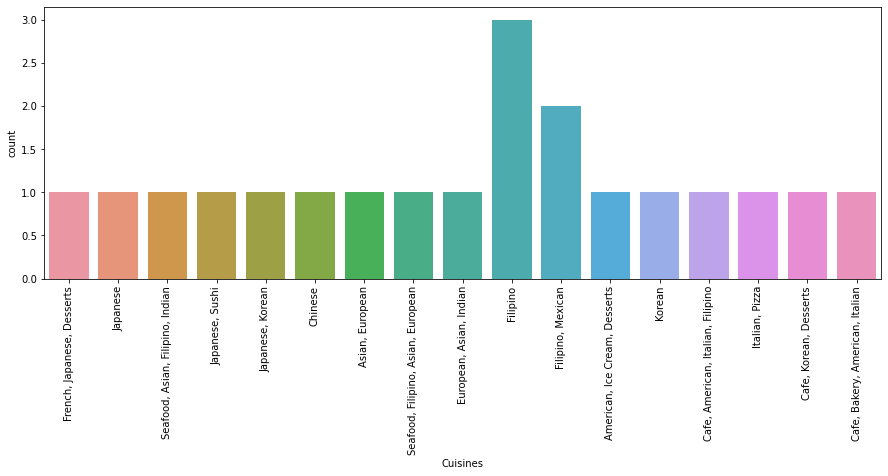

In [123]:
# checking Cuisines column:
plt.figure(figsize=(15,5))
print(df['Cuisines'].value_counts())
sns.countplot(df['Cuisines'].head(20))
plt.xticks(rotation=90)

In cussions column the 'Norrth Indian' column have highest value.

Connaught Place, New Delhi                    122
Rajouri Garden, New Delhi                      99
Shahdara, New Delhi                            87
Defence Colony, New Delhi                      86
Pitampura, New Delhi                           85
                                             ... 
Ramada Gurgaon Central, Sector 44, Gurgaon      1
Sector 5, Gurgaon                               1
Sector 53, Gurgaon                              1
The Claremont, MG Road, Gurgaon                 1
Moda, ÛÁstanbul                                 1
Name: Locality Verbose, Length: 1265, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Century City Mall, Poblacion, Makati City, Makati City'),
  Text(1, 0, 'Little Tokyo, Legaspi Village, Makati City, Makati City'),
  Text(2, 0, 'Edsa Shangri-La, Ortigas, Mandaluyong City, Mandaluyong City'),
  Text(3, 0, 'SM Megamall, Ortigas, Mandaluyong City, Mandaluyong City'),
  Text(4, 0, 'SM by the Bay, Mall of Asia Complex, Pasay City, Pasay City'),
  Text(5, 0, 'Sofitel Philippine Plaza Manila, Pasay City, Pasay City'),
  Text(6, 0, 'Kapitolyo, Pasig City'),
  Text(7, 0, 'UP Town Center, Diliman, Quezon City, Quezon City'),
  Text(8, 0, 'Addition Hills, San Juan City'),
  Text(9, 0, 'Little Baguio, San Juan City'),
  Text(10, 0, 'Nuvali, Don Jose, Santa Rosa, Santa Rosa'),
  Text(11, 0, 'Solenad 3, Don Jose, Santa Rosa, Santa Rosa'),
  Text(12, 0, 'Tagaytay City, Tagaytay City'),
  Text(13, 0, 'BGC Stopover Pavillion, Bonifacio Global City, Taguig City'),
  Text(14, 0, 'Bonifacio Global City, T

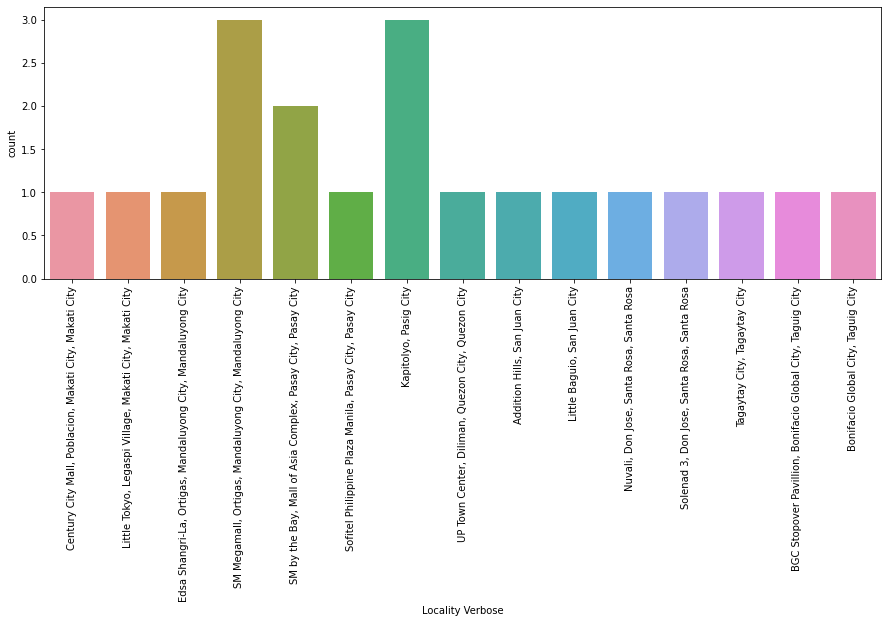

In [124]:
# checking Locality Verbose
plt.figure(figsize=(15,5))
print(df['Locality Verbose'].value_counts())
sns.countplot(df['Locality Verbose'].head(20))
plt.xticks(rotation=90)

In this column 'Connaught Place, New Delhi'column have highest value.

Cafe Coffee Day             83
Domino's Pizza              79
Subway                      63
Green Chick Chop            51
McDonald's                  48
                            ..
Odeon Social                 1
Johnny Rockets               1
House of Commons             1
HotMess                      1
Walter's Coffee Roastery     1
Name: Restaurant Name, Length: 7446, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]),
 [Text(0, 0, 'Le Petit Souffle'),
  Text(1, 0, 'Izakaya Kikufuji'),
  Text(2, 0, 'Heat - Edsa Shangri-La'),
  Text(3, 0, 'Ooma'),
  Text(4, 0, 'Sambo Kojin'),
  Text(5, 0, 'Din Tai Fung'),
  Text(6, 0, 'Buffet 101'),
  Text(7, 0, 'Vikings'),
  Text(8, 0, 'Spiral - Sofitel Philippine Plaza Manila'),
  Text(9, 0, 'Locavore'),
  Text(10, 0, 'Silantro Fil-Mex'),
  Text(11, 0, "Mad Mark's Creamery & Good Eats"),
  Text(12, 0, "Guevarra's"),
  Text(13, 0, 'Sodam Korean Restaurant'),
  Text(14, 0, 'Cafe Arabelle'),
  Text(15, 0, "Nonna's Pasta & Pizzeria"),
  Text(16, 0, 'Balay Dako'),
  Text(17, 0, 'Hobing Korean Dessert Cafe'),
  Text(18, 0, 'Wildflour Cafe + Bakery')])

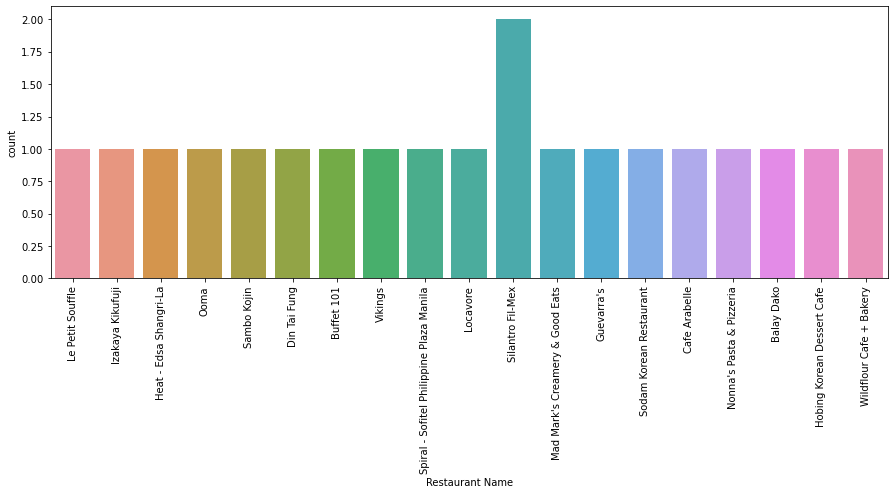

In [125]:
# checking  first (20)Resturent Name column:
plt.figure(figsize=(15,5))
print(df['Restaurant Name'].value_counts())
sns.countplot(df['Restaurant Name'].head(20))
plt.xticks(rotation=90)

In thsi column 'Cafe Coffee Day'have highest value than another.

0.000000     498
77.353663     19
77.230412     12
77.088688     10
77.251426      9
            ... 
77.227294      1
77.225420      1
77.230347      1
77.230578      1
29.026016      1
Name: Longitude, Length: 8120, dtype: int64


<AxesSubplot:xlabel='Longitude', ylabel='Density'>

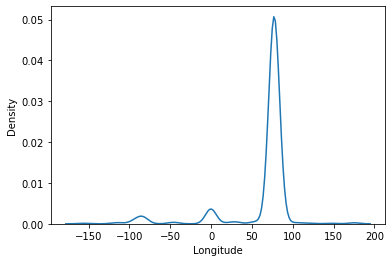

In [126]:
# checking Longitude column:
print(df['Longitude'].value_counts())
sns.kdeplot(df['Longitude'])

0.000000     498
28.574309     16
28.574300      9
28.551456      9
28.597103      8
            ... 
28.645175      1
28.646194      1
28.648280      1
28.643514      1
40.984776      1
Name: Latitude, Length: 8677, dtype: int64


<AxesSubplot:xlabel='Latitude', ylabel='Density'>

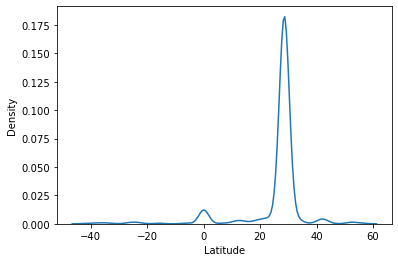

In [127]:
# checking Latitude column:
print(df['Latitude'].value_counts())
sns.kdeplot(df['Latitude'])

Text(0.5, 1.0, 'Average Cost for two')

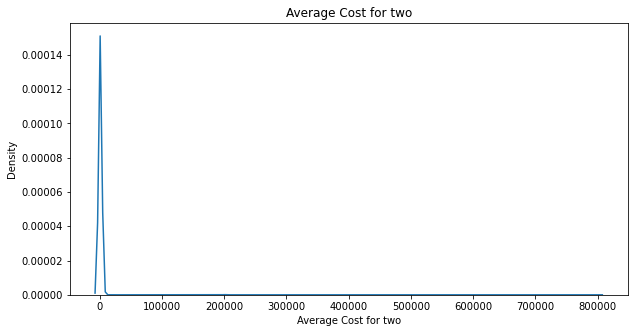

In [128]:
# checking Average cost for two column:
plt.figure(figsize=(10,5))
sns.kdeplot(df['Average Cost for two'])
plt.title('Average Cost for two')

Text(0.5, 1.0, 'Price range')

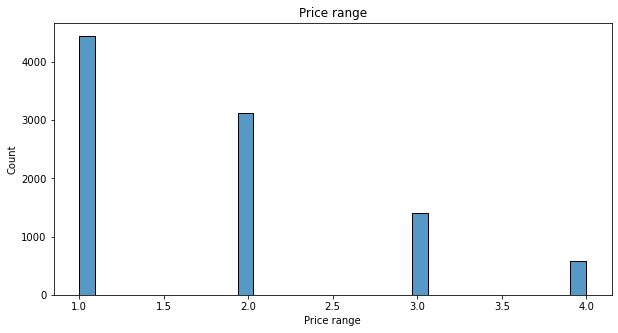

In [129]:
# checking Price range column:
plt.figure(figsize=(10,5))
sns.histplot(df['Price range'])
plt.title('Price range')

Text(0.5, 1.0, 'Aggregate rating')

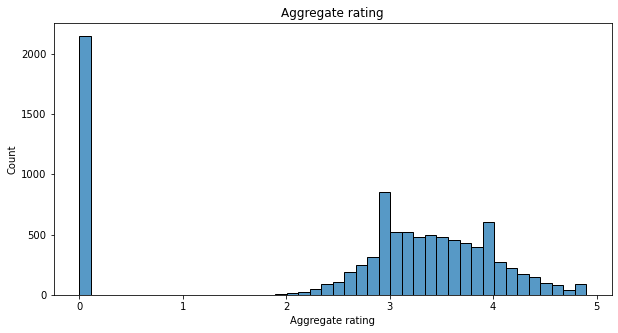

In [130]:
# checking Aggregate rating column:
plt.figure(figsize=(10,5))
sns.histplot(df['Aggregate rating'])
plt.title('Aggregate rating')

Text(0.5, 1.0, 'Votes')

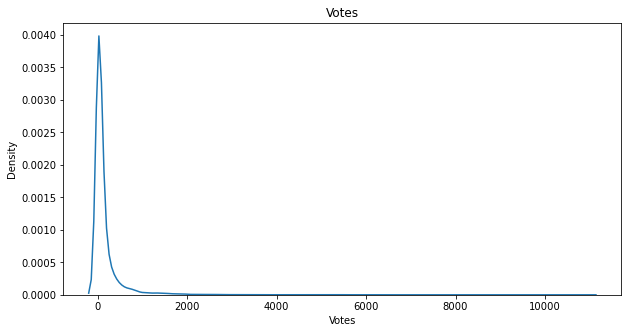

In [131]:
# checking Votes column:
plt.figure(figsize=(10,5))
sns.kdeplot(df['Votes'])
plt.title('Votes')

1)In Latitude,Longitude,votes,Aggregate rating,Average cost of two and Price range are these all column
are not normaly distributed or skewness are presents in all these columns and also outlires are also presents almost all these
columns.

### Relationship with depends variables and independant variables:

<AxesSubplot:xlabel='Price range', ylabel='Average Cost for two'>

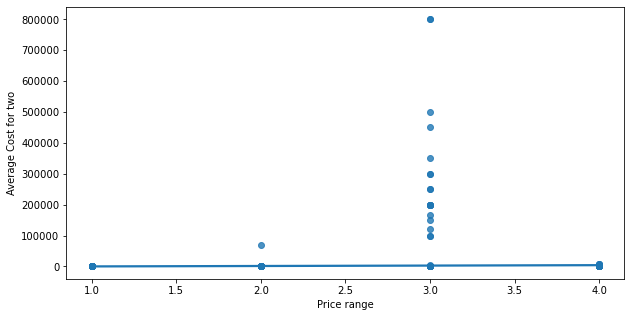

In [132]:
plt.figure(figsize=(10,5))
sns.regplot(x='Price range',y='Average Cost for two',data =df)

<AxesSubplot:xlabel='Price range', ylabel='Latitude'>

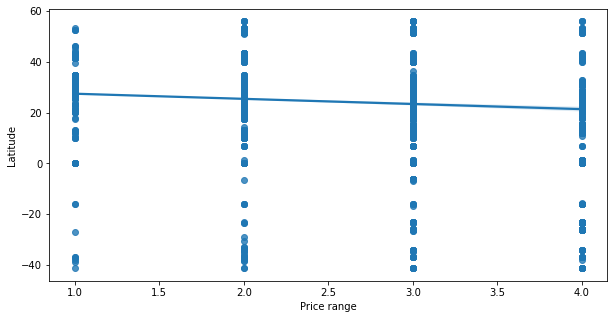

In [133]:
plt.figure(figsize=(10,5))
sns.regplot(x='Price range',y='Latitude',data =df)

<AxesSubplot:xlabel='Price range', ylabel='Longitude'>

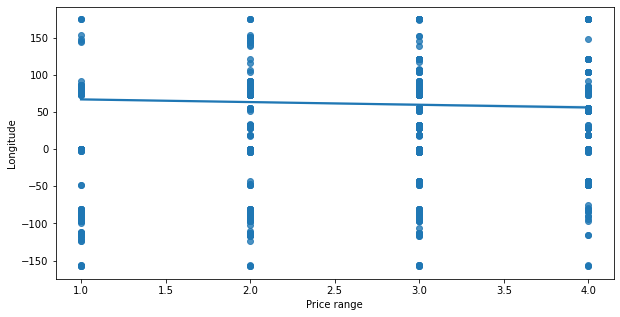

In [134]:
plt.figure(figsize=(10,5))
sns.regplot(x='Price range',y='Longitude',data =df)

<AxesSubplot:xlabel='Price range', ylabel='Votes'>

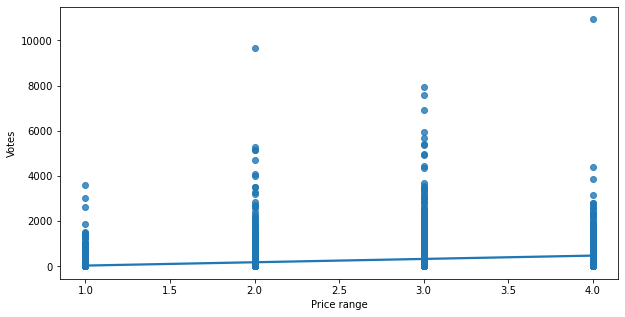

In [135]:
plt.figure(figsize=(10,5))
sns.regplot(x='Price range',y='Votes',data =df)

<AxesSubplot:xlabel='Price range', ylabel='Aggregate rating'>

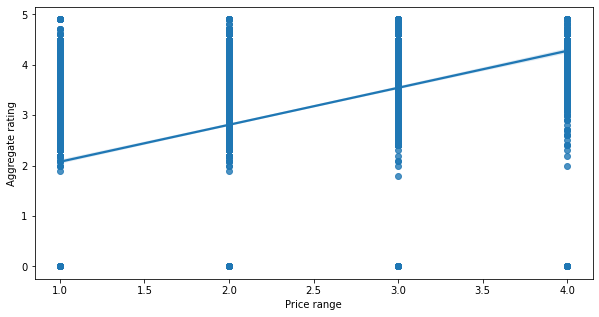

In [137]:
plt.figure(figsize=(10,5))
sns.regplot(x='Price range',y='Aggregate rating',data =df)

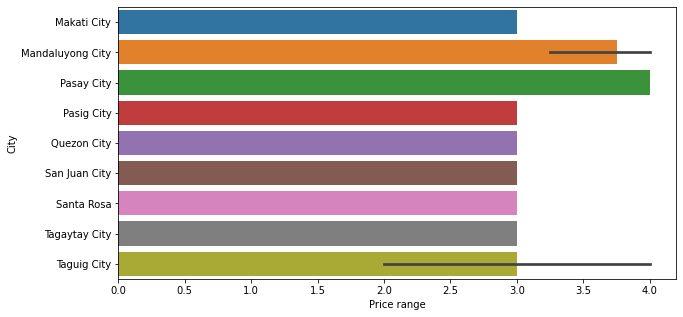

In [138]:
plt.figure(figsize=(10,5))
sns.barplot(x='Price range',y ='City',data=df.head(20))
plt.show()

<AxesSubplot:xlabel='Price range', ylabel='Locality'>

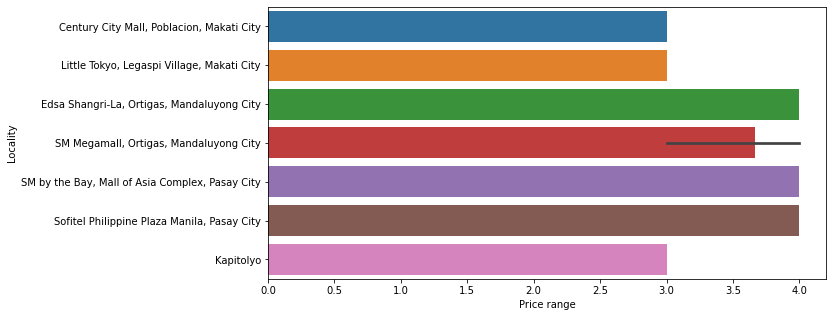

In [140]:
plt.figure(figsize = (10,5))
sns.barplot(x='Price range',y='Locality',data =df.head(10))

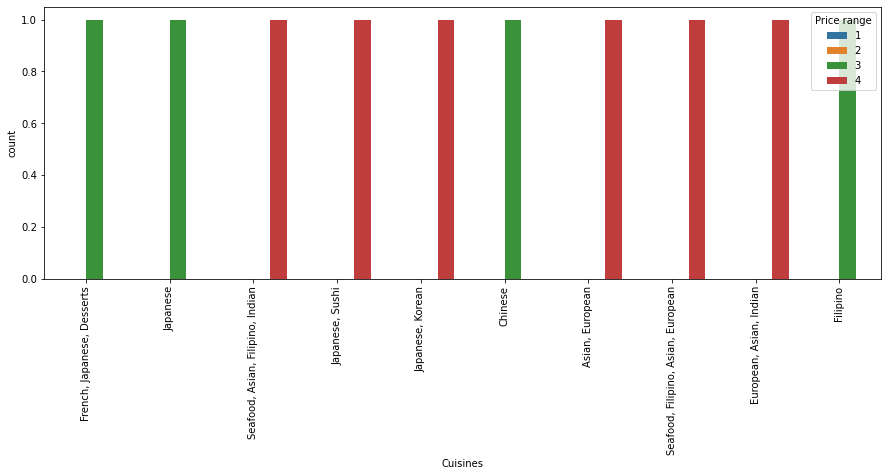

In [141]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Cuisines'].head(10))
plt.xticks(rotation=90)
plt.show()

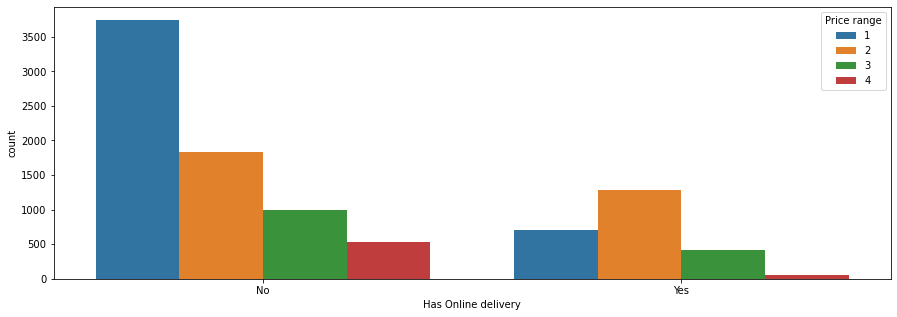

In [142]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Has Online delivery'])
plt.show()

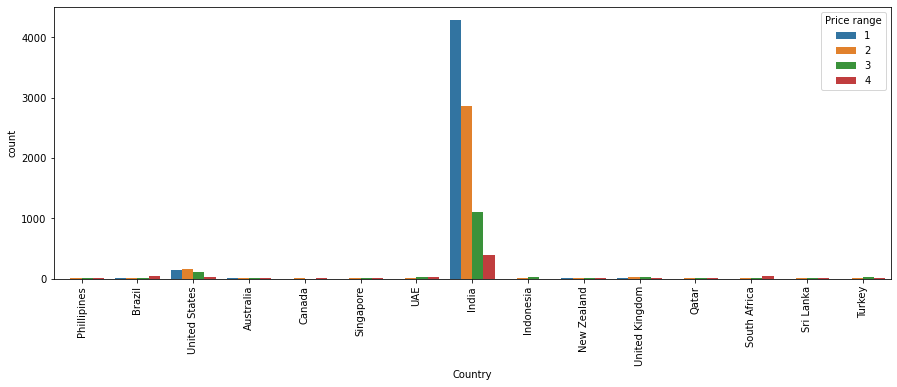

In [143]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Country'])
plt.xticks(rotation=90)
plt.show()

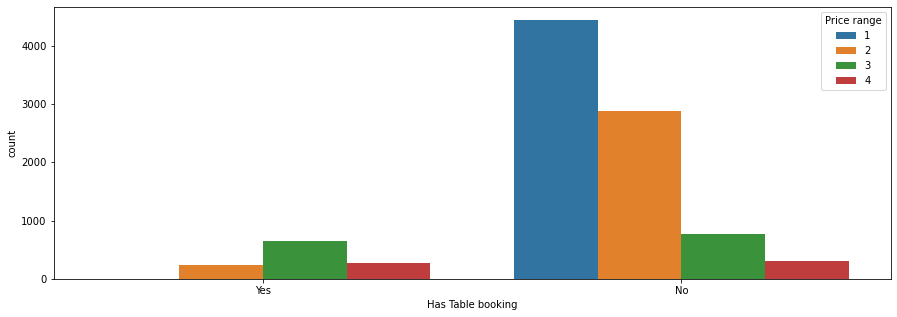

In [144]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Has Table booking'])
plt.show()

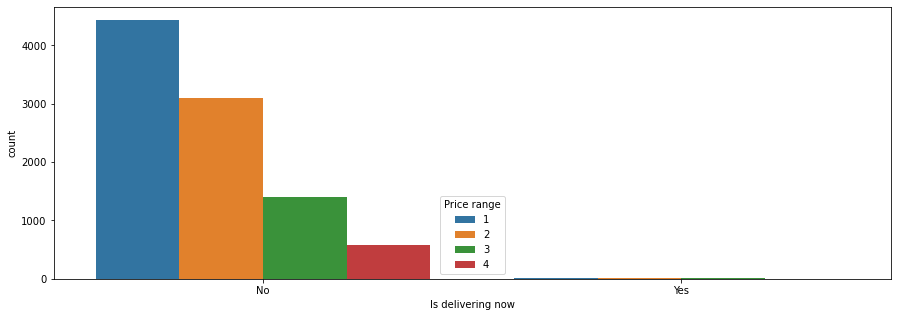

In [145]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Is delivering now'])
plt.show()

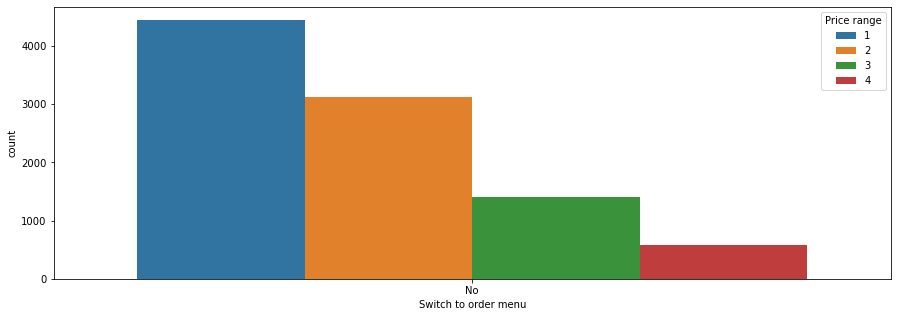

In [146]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Switch to order menu'])
plt.show()

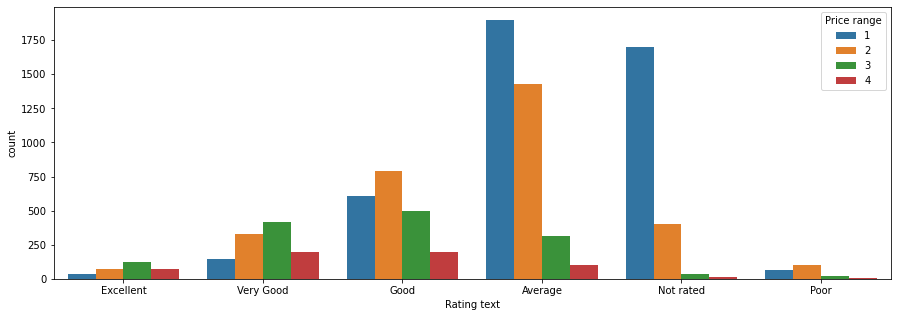

In [147]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Rating text'])
plt.show()

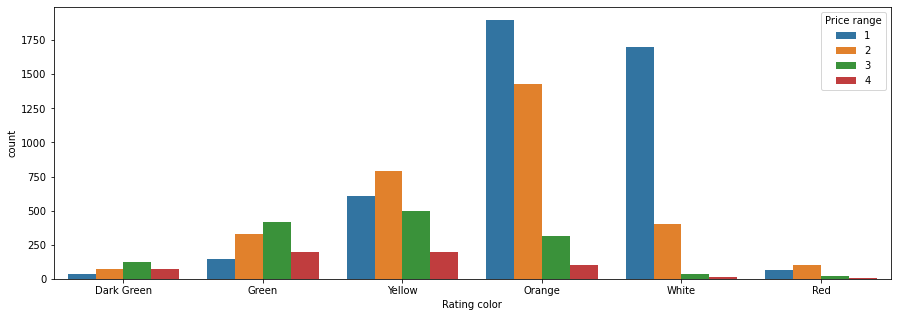

In [148]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Rating color'])
plt.show()

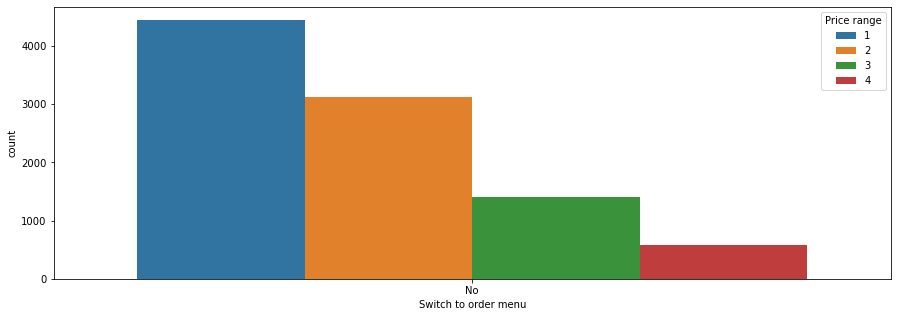

In [150]:
plt.figure(figsize=(15,5))
sns.countplot(hue =df['Price range'],x=df['Switch to order menu'])
plt.show()

### Our Conclusion:

### Let's cheking the outliers by creating the boxplots in our numeriacl columns:

<AxesSubplot:>

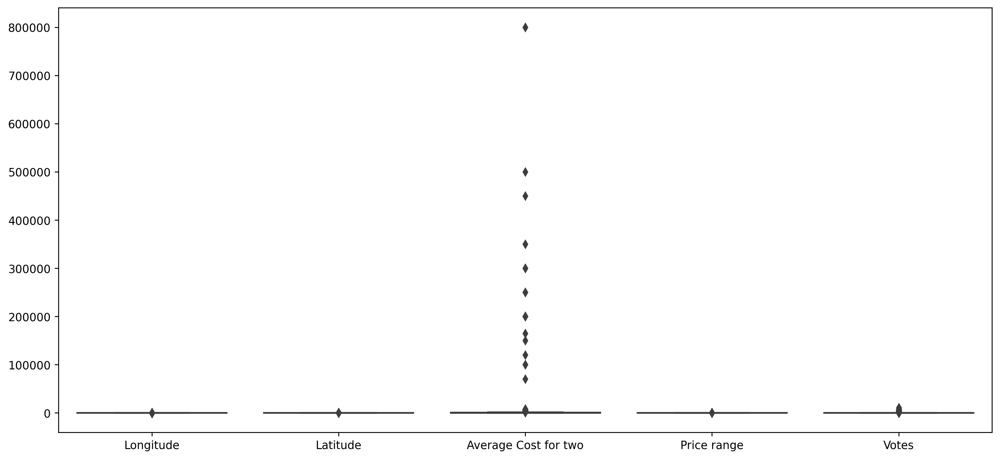

In [151]:
plt.figure(figsize=(15,7),dpi=250)
sns.boxplot(data=df[[
    'Longitude',
    'Latitude',
    'Average Cost for two',
    'Price range',
    'Votes']])

There is outlies are presents and in Average cost for two columns have highers outliers than anothers.

### Let's convert all categorical columns in numerical columns:

In [30]:
from sklearn.preprocessing import LabelEncoder # converting in numerical column with LabelEncoder method:
le = LabelEncoder()

In [31]:
df['Locality'] = le.fit_transform(df['Locality'])
df['Currency'] = le.fit_transform(df['Currency'])
df['Has Table booking'] = le.fit_transform(df['Has Table booking'])
df['Has Online delivery'] = le.fit_transform(df['Has Online delivery'])
df['Is delivering now'] = le.fit_transform(df['Is delivering now'])
df['Rating color'] = le.fit_transform(df['Rating color'])
df['Switch to order menu'] = le.fit_transform(df['Switch to order menu'])
df['Rating text'] = le.fit_transform(df['Rating text'])
df['Country'] = le.fit_transform(df['Country'])
df['Restaurant Name'] = le.fit_transform(df['Restaurant Name'])
df['City'] = le.fit_transform(df['City'])
df['Locality Verbose'] = le.fit_transform(df['Locality Verbose'])
df['Address'] = le.fit_transform(df['Address'])

### Let's handeling skewnss and outliers:

In [32]:
df.skew()

Restaurant ID            0.061570
Restaurant Name          0.044637
Country Code             3.043965
City                    -1.193777
Address                 -0.040407
Locality                -0.253554
Locality Verbose        -0.183064
Longitude               -2.807328
Latitude                -3.081635
Average Cost for two    35.477915
Currency                 2.858093
Has Table booking        2.321100
Has Online delivery      1.114620
Is delivering now       16.673412
Switch to order menu     0.000000
Price range              0.889618
Aggregate rating        -0.954130
Rating color             0.046009
Rating text              0.431408
Votes                    8.807637
Country                  3.312721
dtype: float64

In [33]:
from scipy import stats # using Zscore method:

from scipy.stats import zscore
z_score = zscore(df[['Country','Votes','Rating text','Rating color','Aggregate rating','Price range','Is delivering now','Has Online delivery','Has Table booking','Currency','Average Cost for two','Latitude','Longitude','Locality Verbose','Locality','City','Country Code','Restaurant Name']])
abs_z_score = np.abs(z_score)
filtering_entry = (abs_z_score < 3).all(axis=1)
df = df[filtering_entry]
df.reset_index(inplace = True)

In [34]:
df.skew()

index                   -0.019844
Restaurant ID            0.108162
Restaurant Name          0.045448
Country Code            19.985320
City                    -1.392152
Address                 -0.121484
Locality                -0.316614
Locality Verbose        -0.241733
Longitude               -3.702347
Latitude                -3.241005
Average Cost for two     3.716607
Currency               -18.026851
Has Table booking        2.269837
Has Online delivery      1.001452
Is delivering now        0.000000
Switch to order menu     0.000000
Price range              1.054225
Aggregate rating        -0.861415
Rating color             0.101035
Rating text              0.422542
Votes                    3.730394
Country                 20.254626
dtype: float64

now our data is cleaned by using diffrents methods:

In [35]:
# droping all usless columns:
df.drop(['index','Restaurant ID','Cuisines','Switch to order menu','Locality Verbose','Is delivering now','Country Code'],inplace=True,axis=1)

<AxesSubplot:>

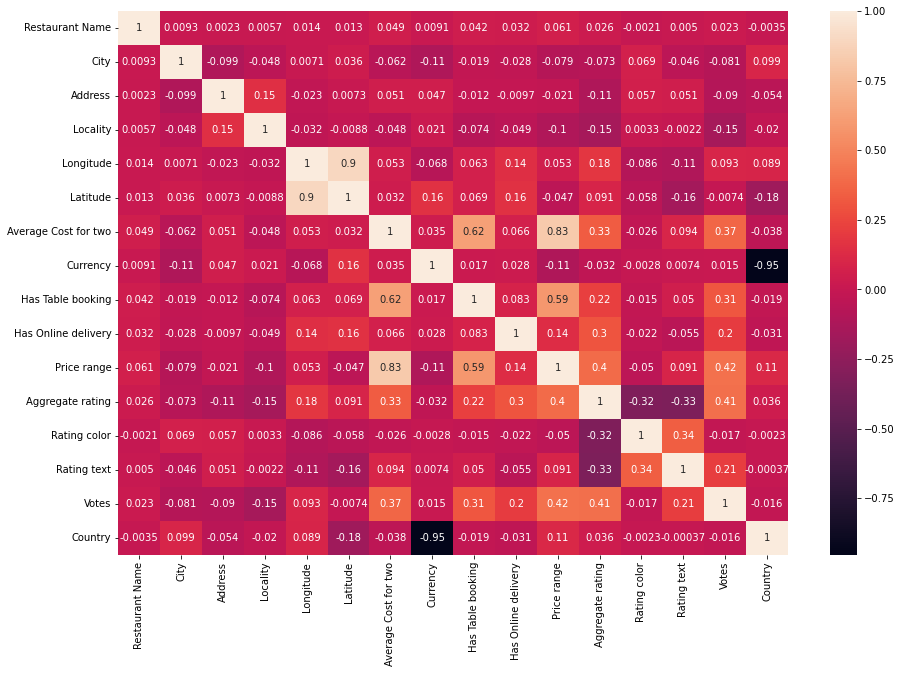

In [36]:
# checking coorelations with heatmap:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot = True)

In [37]:
# checking all numerical columns:
df.dtypes

Restaurant Name           int32
City                      int32
Address                   int32
Locality                  int32
Longitude               float64
Latitude                float64
Average Cost for two      int64
Currency                  int32
Has Table booking         int32
Has Online delivery       int32
Price range               int64
Aggregate rating        float64
Rating color              int32
Rating text               int32
Votes                     int64
Country                   int32
dtype: object

### Seperating our target variables :

In [38]:
x = df.drop(['Price range','Average Cost for two'],axis =1)
y = df[['Price range','Average Cost for two']]

In [39]:
# using this methd for biasness
Scaler =StandardScaler()
x = pd.DataFrame(Scaler.fit_transform(x),columns = x.columns)
x

,Restaurant Name,City,Address,Locality,Longitude,Latitude,Currency,Has Table booking,Has Online delivery,Aggregate rating,Rating color,Rating text,Votes,Country
0,1.056536,2.121012,-1.815318,-1.868890,1.709369,-3.566603,-19.984745,-0.377759,-0.617682,0.608073,-0.780022,-1.015678,-0.318724,20.397638
1,-0.845151,2.121012,-1.441372,-1.865606,1.709336,-3.566203,-19.984745,-0.377759,-0.617682,1.005488,-1.506234,2.100363,-0.324244,20.397638
2,0.786336,2.121012,-0.990264,-1.694830,1.708283,-3.567063,-19.984745,-0.377759,-0.617682,0.873017,1.398615,0.230738,-0.324244,20.397638
3,0.640016,2.121012,-1.078111,-1.599589,1.708355,-3.566909,-19.984745,-0.377759,-0.617682,0.409366,-0.780022,-1.015678,-0.318724,20.397638
4,-0.209385,2.121012,-1.440185,-1.560180,1.709015,-3.565105,-19.984745,-0.377759,-0.617682,0.873017,1.398615,0.230738,-0.313203,20.397638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8403,-0.127577,3.027356,0.932091,1.047442,-4.032545,-3.748570,0.045263,-0.377759,-0.617682,0.806781,1.398615,0.230738,-0.037178,-0.049610
8404,0.631602,3.027356,0.909535,1.047442,0.573551,-1.234759,0.045263,-0.377759,-0.617682,1.204196,-1.506234,2.100363,0.443106,-0.049610
8405,1.666124,3.027356,1.564434,1.333164,0.574743,-1.234526,0.045263,-0.377759,-0.617682,0.873017,1.398615,0.230738,-0.097904,-0.049610
8406,-0.585702,3.027356,-1.804238,1.622170,0.573532,-1.234535,0.045263,-0.377759,-0.617682,1.270432,-1.506234,2.100363,1.238059,-0.049610


### Testing Spliting:

In [44]:
 # import necessoy librories:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

In [45]:
#finding best random state
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.30,random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred= lr.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"on Random_state",maxRS)

Maximum r2 score is  0.5109088411086944 on Random_state 194


In [46]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import ExtraTreesRegressor

In [47]:
DE= DecisionTreeRegressor()
DE.fit(x_train,y_train)
pred_DE=DE.predict(x_test)
pred_train=DE.predict(x_train)
print('R2_score:',r2_score(y_test,pred_DE))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_DE))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_DE))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_DE)))

R2_score: 0.21297746199592477
R2_score on training Data: 100.0
Mean Absolute Error:- 146.17380103051923
Mean Squared Error:- 135267.39219183513
Root Mean Squared Error:- 367.7871560996049


In [48]:
RF= RandomForestRegressor()
RF.fit(x_train,y_train)
pred_RF=RF.predict(x_test)
pred_train=RF.predict(x_train)
print('R2_score:',r2_score(y_test,pred_RF))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_RF))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_RF))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_RF)))

R2_score: 0.5768455207067661
R2_score on training Data: 94.33754390039901
Mean Absolute Error:- 110.65479389615541
Mean Squared Error:- 73737.72980366627
Root Mean Squared Error:- 271.5469200776659


In [49]:
KN=  KNN()
KN.fit(x_train,y_train)
pred_KN=KN.predict(x_test)
pred_train=KN.predict(x_train)
print('R2_score:',r2_score(y_test,pred_KN))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_KN))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_KN))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_KN)))

R2_score: 0.46670504207971364
R2_score on training Data: 66.6569162369053
Mean Absolute Error:- 127.44351961950059
Mean Squared Error:- 98266.9384700753
Root Mean Squared Error:- 313.47557874589734


In [50]:
ET=  ExtraTreesRegressor()
ET.fit(x_train,y_train)
pred_ET=ET.predict(x_test)
pred_train=ET.predict(x_train)
print('R2_score:',r2_score(y_test,pred_ET))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_ET))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_ET))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred_ET)))

R2_score: 0.5606689732784829
R2_score on training Data: 99.9999910403184
Mean Absolute Error:- 114.3310760998811
Mean Squared Error:- 76475.14327092744
Root Mean Squared Error:- 276.54139522127144


### Cross-val-Score:

In [51]:
from sklearn.model_selection import cross_val_score

In [52]:
score = cross_val_score(RF,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_RF)-score.mean())*100)

[-0.10466541  0.44343407  0.48867031  0.55378252  0.0423889 ]
0.2847220782391925
Diffrence between R2 score and cross validation score is- 29.21234424675736


In [53]:
score = cross_val_score(DE,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_DE)-score.mean())*100)

[-2.10346004 -0.16048868  0.06146878  0.21079758 -1.01916489]
-0.6021694483170508
Diffrence between R2 score and cross validation score is- 81.51469103129756


In [54]:
score = cross_val_score(KN,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_KN)-score.mean())*100)

[0.28323921 0.40062247 0.41037044 0.48335881 0.26689315]
0.36889681571065397
Diffrence between R2 score and cross validation score is- 9.780822636905967


In [55]:
score = cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Diffrence between R2 score and cross validation score is-",(r2_score(y_test,pred_ET)-score.mean())*100)

[0.28064666 0.47576542 0.47332332 0.53264849 0.42045515]
0.4365678064020653
Diffrence between R2 score and cross validation score is- 12.410116687641759


I am choosing KNN model as my best fit model due to least distance b/w R2 score and cross-val-score.

### Hyperparameter-Tunings:

In [57]:
from sklearn.model_selection import GridSearchCV

parameters = {'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
              'weights':['uniform', 'distance'],
              'n_jobs':[None],
              'metric_params':[None],
              'metric':['minkowski'],
              'leaf_size':[30],
              'n_neighbors':[5]
             }

In [59]:
KN=  GridSearchCV(KNN(),parameters,cv= 5)

In [60]:
KN.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [30], 'metric': ['minkowski'],
                         'metric_params': [None], 'n_jobs': [None],
                         'n_neighbors': [5],
                         'weights': ['uniform', 'distance']})

In [61]:
KN.best_params_

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'weights': 'distance'}

In [63]:
KN.best_score_

0.48536514037658735

In [68]:
Model = KNN(algorithm = 'auto', leaf_size= 30,metric= 'minkowski',metric_params= None,n_neighbors = 5,weights='distance')
Model.fit(x_train,y_train)
pred = Model.predict(x_test)
print('R2_score:',r2_score(y_test,pred))
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred))
print('Mean Squared Error:-',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:-',np.sqrt(mean_squared_error(y_test,pred)))

R2_score: 0.4708475426051864
Mean Absolute Error:- 126.52143690656092
Mean Squared Error:- 96924.14940562357
Root Mean Squared Error:- 311.32643544296644


### Saving Model:

In [71]:
# we use joblib methode for save the model
import joblib
joblib.dump(Final_model,"zometo Prediction")

['zometo Prediction']

In [72]:
# load the saved model
model = joblib.load("zometo Prediction")

#pediction
prediction = model.predict(x_test)
prediction

array([[1.00000000e+00, 2.24165813e+02],
       [3.00000000e+00, 1.36940691e+03],
       [1.00000000e+00, 3.77394900e+02],
       ...,
       [3.08692099e+00, 1.48744345e+03],
       [1.00000000e+00, 2.59019111e+02],
       [3.37313786e+00, 2.00462577e+03]])

### These are our predictions.